In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from HLR import HierarchicalLinearRegression
import os

# Data Preparation and Exploration

In [9]:
# load comments.pkl into a pandas dataframe
data = pd.read_pickle('comments.pkl')

In [10]:
data.head()

,comment_id,score,replies,awards,length,length_to_avg_ratio
0,t1_lg0m40h,1,0,0,2,0.018433
1,t1_lg2121c,1,1,0,177,1.631336
2,t1_lhhnu1p,5,0,0,40,0.329670
3,t1_lhk9ejk,2,1,0,15,0.123626
4,t1_lhp8vgm,1,0,0,166,1.368132


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1276 entries, 0 to 1275
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   comment_id           1276 non-null   object 
 1   score                1276 non-null   object 
 2   replies              1276 non-null   int64  
 3   awards               1276 non-null   object 
 4   length               1276 non-null   int64  
 5   length_to_avg_ratio  1276 non-null   float64
dtypes: float64(1), int64(2), object(3)
memory usage: 59.9+ KB


In [15]:
# changing the type of the 'score' and 'awards' columns to int
data['score'] = data['score'].astype(int)
data['awards'] = data['awards'].astype(int)

In [16]:
print(f'Total number of data-points {len(data)}')

Total number of data-points 1276


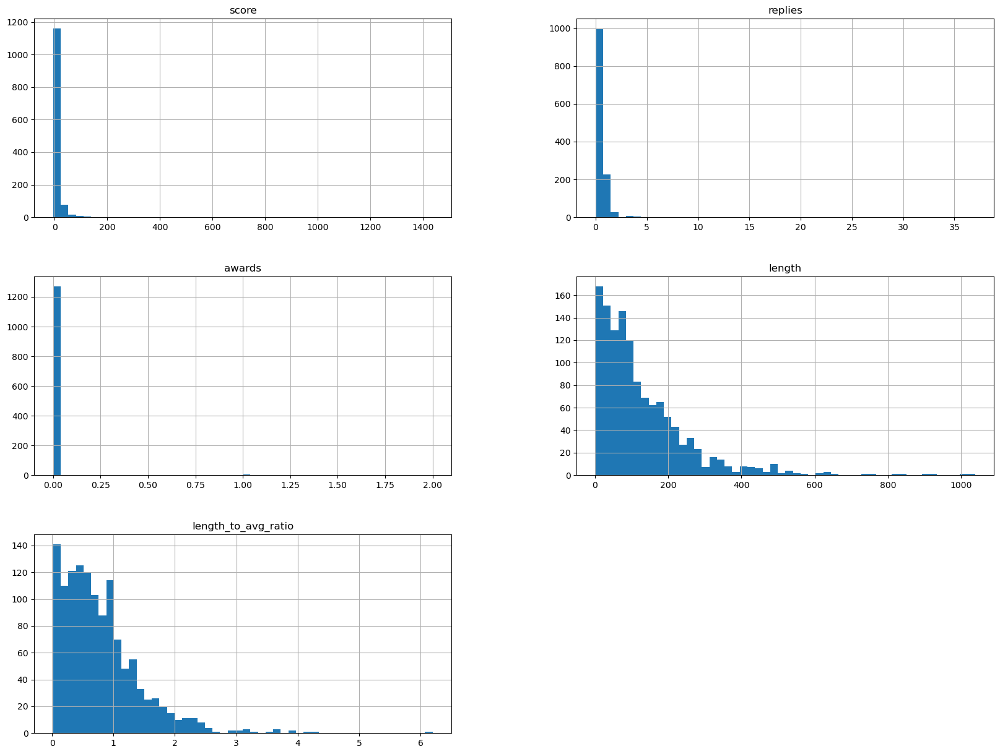

In [17]:
# show the distribution of each column as a histogram
data.hist(bins=50, figsize=(20,15))
plt.show()

In [22]:
# choosing 50 random comments, such that the score is greater than 25 or less than -3 or the number of replies is greater than 5
random_comments = data[(data['score'] > 25) | (data['score'] < -3) | (data['replies'] > 5)].sample(50)

In [24]:
# display the random comments
random_comments.describe()

,score,replies,awards,length,length_to_avg_ratio
count,50.00000,50.000000,50.000000,50.000000,50.000000
mean,93.74000,2.360000,0.040000,118.740000,0.647821
std,224.17557,5.749037,0.282843,133.566739,0.546736
min,-4.00000,0.000000,0.000000,5.000000,0.054920
25%,28.00000,0.000000,0.000000,42.500000,0.246756
50%,42.50000,0.500000,0.000000,80.500000,0.481706
75%,71.50000,1.750000,0.000000,158.250000,0.944867
max,1437.00000,37.000000,2.000000,744.000000,2.886172


In [5]:
# saving the data into a csv file
data.to_csv('comments.csv')

In [25]:
# saving the random comments into a csv file
random_comments.to_csv('random_comments.csv')

# Label Preprocessing

In [40]:
from data_preprocessing import clean_data

In [45]:
# from the raw_labels folder, loading the labels from the first_25 and second_25 folders
first_25_comments = []
second_25_comments = []
column_types = {
    'score': 'int64',
    'replies': 'int64',
    'length': 'int64',
    'length_ratio': 'float64',
    'sureness': 'float64'
}

for i in range(1, 6):
    first_25_comments.append(clean_data(pd.read_csv(f'raw_labels/first_25/p{i}.csv', header=0, names=['score', 'replies', 'length', 'length_ratio', 'sureness'], dtype=column_types)))
    second_25_comments.append(clean_data(pd.read_csv(f'raw_labels/second_25/p{i}.csv', header=0, names=['score', 'replies', 'length', 'length_ratio', 'sureness'], dtype=column_types)))

In [46]:
second_25_comments[0].head()

,score,replies,length,length_ratio,sureness
0,26,3,441,1.01,70.0
1,41,1,188,0.66,80.0
2,107,1,110,0.33,90.0
3,47,0,15,0.15,80.0
4,46,0,262,1.70,90.0


In [47]:
print(second_25_comments[0].info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25 entries, 0 to 24
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   score         25 non-null     int64  
 1   replies       25 non-null     int64  
 2   length        25 non-null     int64  
 3   length_ratio  25 non-null     float64
 4   sureness      25 non-null     float64
dtypes: float64(2), int64(3)
memory usage: 1.1 KB
None


In [48]:
# creating a single dataframe for the first and second 25 comments by averaging the sureness column
first_25 = first_25_comments[0]
for i in range(1, 5):
    first_25['sureness'] += first_25_comments[i]['sureness']
first_25['sureness'] /= 5

second_25 = second_25_comments[0]
for i in range(1, 5):
    second_25['sureness'] += second_25_comments[i]['sureness']
second_25['sureness'] /= 5

In [49]:
first_25.head()

,score,replies,length,length_ratio,sureness
0,232,1,57,0.27,85.0
1,26,1,161,1.07,72.0
2,54,0,125,0.59,72.6
3,154,0,190,1.12,86.6
4,45,1,52,0.59,68.0


In [50]:
# saving the data into a csv file and a pickle file
first_25.to_csv('labels/first_25.csv')
first_25.to_pickle('labels/first_25.pkl')

second_25.to_csv('labels/second_25.csv')
second_25.to_pickle('labels/second_25.pkl')

In [51]:
# creating the full dataset by merging the first_25 and second_25 dataframes and saving it into a csv file and a pickle file
full_data = pd.concat([first_25, second_25], ignore_index=True)
full_data.to_csv('labels/full_data.csv')
full_data.to_pickle('labels/full_data.pkl')

# Exploring the labeled data

In [2]:
full_data = pd.read_pickle('labels/full_data.pkl')

In [3]:
full_data['sureness'].describe()

count    50.000000
mean     76.801748
std       8.871449
min      58.200000
25%      71.250000
50%      77.700000
75%      84.000000
max      92.000000
Name: sureness, dtype: float64

In [14]:
plt.figure(figsize=(5, 6))
# box plot of the sureness column
full_data.boxplot(column='sureness')
# adding the mean, std, and whiskers values to the plot
plt.text(1, full_data['sureness'].mean(), f'Mean: {full_data["sureness"].mean():.2f}')
plt.text(1, full_data['sureness'].quantile(0.25), f'Q1: {full_data["sureness"].quantile(0.25):.2f}')
plt.text(1, full_data['sureness'].quantile(0.75), f'Q3: {full_data["sureness"].quantile(0.75):.2f}')
# adding the max and min values to the plot
plt.text(1, full_data['sureness'].max(), f'Max: {full_data["sureness"].max():.2f}')
plt.text(1, full_data['sureness'].min(), f'Min: {full_data["sureness"].min():.2f}')
plt.title('Boxplot of the sureness column')
plt.ylabel('Sureness')
plt.savefig('plots/sureness_boxplot.png')

<Axes: >

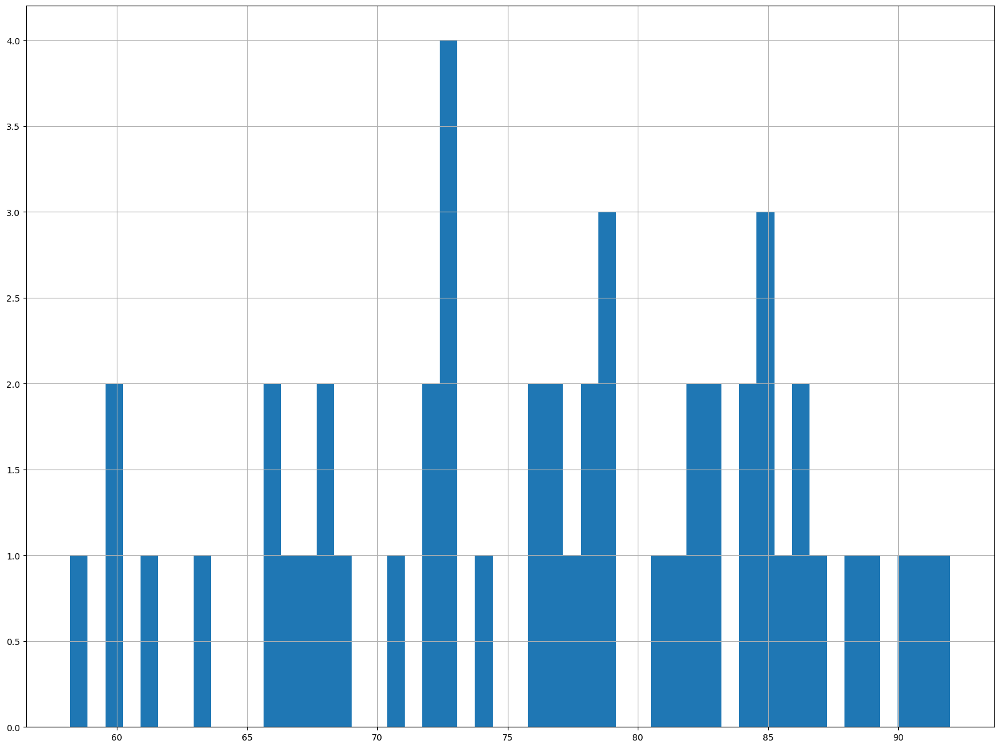

In [6]:
# show the distribution of each column as a histogram
full_data['sureness'].hist(bins=50, figsize=(20,15))

In [16]:
# making a boxplot of the score column
plt.figure(figsize=(5, 6))
full_data.boxplot(column='score')
# adding the mean, Q1, Q3, max, and min values to the plot
plt.text(1, full_data['score'].mean(), f'Mean: {full_data["score"].mean():.2f}')
plt.text(1, full_data['score'].quantile(0.25), f'Q1: {full_data["score"].quantile(0.25):.2f}')
plt.text(1, full_data['score'].quantile(0.75), f'Q3: {full_data["score"].quantile(0.75):.2f}')
plt.text(1, full_data['score'].max(), f'Max: {full_data["score"].max():.2f}')
plt.text(1, full_data['score'].min(), f'Min: {full_data["score"].min():.2f}')
plt.title('Boxplot of the score column')
plt.ylabel('Score')
plt.savefig('plots/score_boxplot.png')

In [3]:
# checking the correlation between the columns
full_data.corr()

,score,replies,length,length_ratio,sureness
score,1.000000,-0.055333,-0.148743,-0.180697,0.229616
replies,-0.055333,1.000000,-0.004553,0.124702,-0.374455
length,-0.148743,-0.004553,1.000000,0.711041,-0.024940
length_ratio,-0.180697,0.124702,0.711041,1.000000,-0.141473
sureness,0.229616,-0.374455,-0.024940,-0.141473,1.000000


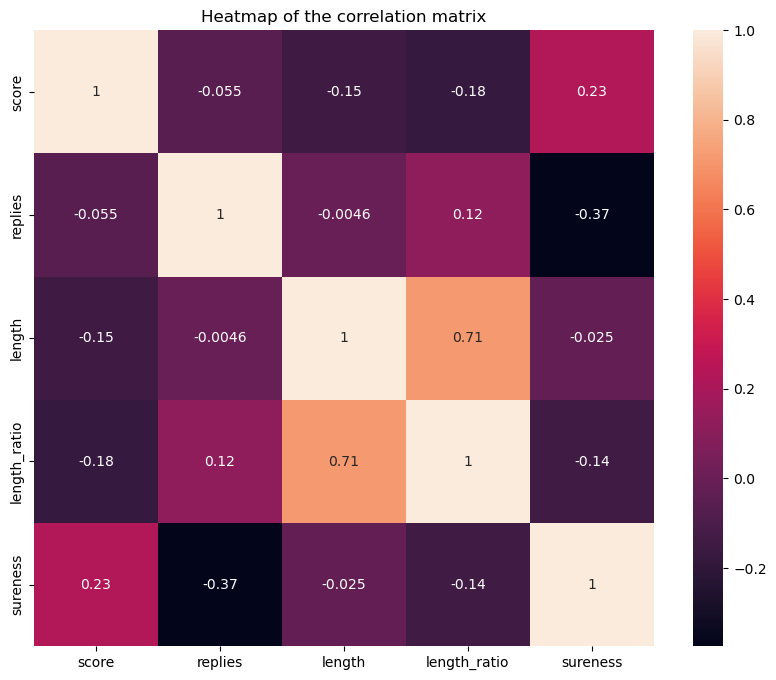

In [4]:
# making a heatmap of the correlation matrix
import seaborn as sns
plt.figure(figsize=(10, 8))
sns.heatmap(full_data.corr(), annot=True)
plt.title('Heatmap of the correlation matrix')
plt.savefig('plots/correlation_heatmap.png')

# Hierarchical Linear Regression

In [3]:
# loading the ffn_data.pkl file into a pandas dataframe
fnn_data = pd.read_pickle('labels/ffn_data.pkl')
full_data = pd.read_pickle('labels/full_data.pkl')

In [4]:
def make_plots(hreg, folder):
    # check that the folder exists
    if not os.path.exists(f'plots/{folder}'):
        os.makedirs(f'plots/{folder}')
    
    fig1 = hreg.plot_studentized_residuals_vs_fitted()
    fig1.savefig(f'plots/{folder}/studentized_residuals_vs_fitted.png')
    fig2 = hreg.plot_qq_residuals()
    fig2.savefig(f'plots/{folder}/qq_residuals.png')
    fig3 = hreg.plot_influence()
    fig3.savefig(f'plots/{folder}/influence.png')
    fig4 = hreg.plot_std_residuals()
    fig4.savefig(f'plots/{folder}/std_residuals.png')
    fig5 = hreg.plot_histogram_std_residuals()
    fig5.savefig(f'plots/{folder}/histogram_std_residuals.png')
    fig_list = hreg.plot_partial_regression()
    for i, fig in enumerate(fig_list):
        fig.savefig(f'plots/{folder}/partial_regression_{i}.png')

In [5]:
dep_var = 'sureness'

## Hierarchy 1

In [24]:
hie1 = {
    1: ['score'],
    2: ['score', 'replies'],
    3: ['score', 'replies', 'length'],
    4: ['score', 'replies', 'length', 'length_ratio'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie1, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie1, dep_var)

In [25]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.052724,2.671587,0.108697,3653.103040,3856.427643,...,78.702605,"{'const': 75.94995596787473, 'score': 0.009086...","{'const': 1.2084343324020237e-45, 'score': 0.1...",{'score': 0.22961611958534275},{'score': 0.22961611958534356},{'score': 0.22961611958534348},{'score': 5.272356237343075},NaN,NaN,NaN
1,2,"[score, replies]",50.0,47.0,2.0,0.183989,5.298619,0.008411,3146.888749,3856.427643,...,78.702605,"{'const': 77.34589215516962, 'score': 0.008292...","{'const': 4.548528629512018e-45, 'score': 0.11...","{'score': 0.20953797090547574, 'replies': -0.3...","{'score': 0.22563289697992547, 'replies': -0.3...","{'score': 0.209216951023463, 'replies': -0.362...","{'score': 4.377173259555411, 'replies': 13.126...",0.131265,7.560506,0.008441
2,3,"[score, replies, length]",50.0,46.0,3.0,0.184010,3.457748,0.023833,3146.806204,3856.427643,...,78.702605,"{'const': 77.30617820752074, 'score': 0.008319...","{'const': 6.044895221306158e-39, 'score': 0.12...","{'score': 0.21023725303258328, 'replies': -0.3...","{'score': 0.2239435896358017, 'replies': -0.37...","{'score': 0.20756479467958328, 'replies': -0.3...","{'score': 4.308314399037756, 'replies': 13.119...",0.000021,0.001207,0.972440
3,4,"[score, replies, length, length_ratio]",50.0,45.0,4.0,0.192018,2.673585,0.043901,3115.922545,3856.427643,...,78.702605,"{'const': 77.92779436128676, 'score': 0.007961...","{'const': 4.142635110850819e-36, 'score': 0.14...","{'score': 0.20119391690326807, 'replies': -0.3...","{'score': 0.21476017417613705, 'replies': -0.3...","{'score': 0.197655111067691, 'replies': -0.340...","{'score': 3.906754293118126, 'replies': 11.602...",0.008008,0.446020,0.507642


In [26]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1849543367384463
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(0.22961611958534342), 'p-value': np.float64(0.10869660919186991), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.5146742223968265
    p-value: 0.9460127851964387
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.19259758893648282
    p-value: 0.6607634033828238
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.7862675357765974
    p-value: 0.7155559154872408
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [41]
    Passed: False
  Normality (mean of residuals):
    Mean: 3.012

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1849543367384463),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(0.22961611958534342),
    'p-value': np.float64(0.10869660919186991),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.5146742223968265),
   'p-value': np.float64(0.9460127851964387),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.19259758893648282),
   'p-value': np.float64(0.6607634033828238),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.7862675357765974),
   'p-value': np.float64(0.7155559154872408),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype

In [27]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.056199,2.858190,0.097395,575.730574,610.012807,...,12.449241,"{'const': 76.35763933568613, 'score': -0.00373...","{'const': 6.911821380945499e-65, 'score': 0.09...",{'score': -0.23706370590385575},{'score': -0.23706370700083093},{'score': -0.23706370700083088},{'score': 5.619920117697579},NaN,NaN,NaN
1,2,"[score, replies]",50.0,47.0,2.0,0.100588,2.628183,0.082800,548.652803,610.012807,...,12.449241,"{'const': 76.6804923344161, 'score': -0.003914...","{'const': 1.3339199875345576e-62, 'score': 0.0...","{'score': -0.24873948957733366, 'replies': -0....","{'score': -0.25333545691653386, 'replies': -0....","{'score': -0.24835841267541695, 'replies': -0....","{'score': 6.16819011466527, 'replies': 4.43888...",0.044389,2.319600,0.134454
2,3,"[score, replies, length]",50.0,46.0,3.0,0.127605,2.242797,0.095919,532.172297,610.012807,...,12.449241,"{'const': 77.24164515010315, 'score': -0.00430...","{'const': 1.747749427737834e-56, 'score': 0.05...","{'score': -0.2735830382476237, 'replies': -0.2...","{'score': -0.27780264365852547, 'replies': -0....","{'score': -0.2701053529064788, 'replies': -0.2...","{'score': 7.295690166873346, 'replies': 4.5282...",0.027017,1.424545,0.238776
3,4,"[score, replies, length, length_ratio]",50.0,45.0,4.0,0.130843,1.693572,0.168130,530.197064,610.012807,...,12.449241,"{'const': 77.3988504286757, 'score': -0.004396...","{'const': 4.787220535713748e-53, 'score': 0.05...","{'score': -0.2793334192566462, 'replies': -0.2...","{'score': -0.28237319155968127, 'replies': -0....","{'score': -0.2744202166416112, 'replies': -0.1...","{'score': 7.530645530162882, 'replies': 3.9740...",0.003238,0.167646,0.684155


In [28]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1175364144057585
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(-0.2370637070008309), 'p-value': np.float64(0.09739451040215853), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.1291261916864321
    p-value: 0.3866381842905979
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.21511408762094897
    p-value: 0.6427882257697356
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.5697891169311007
    p-value: 0.907526892015278
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: 1.6484591

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1175364144057585),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(-0.2370637070008309),
    'p-value': np.float64(0.09739451040215853),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.1291261916864321),
   'p-value': np.float64(0.3866381842905979),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.21511408762094897),
   'p-value': np.float64(0.6427882257697356),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.5697891169311007),
   'p-value': np.float64(0.907526892015278),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype=

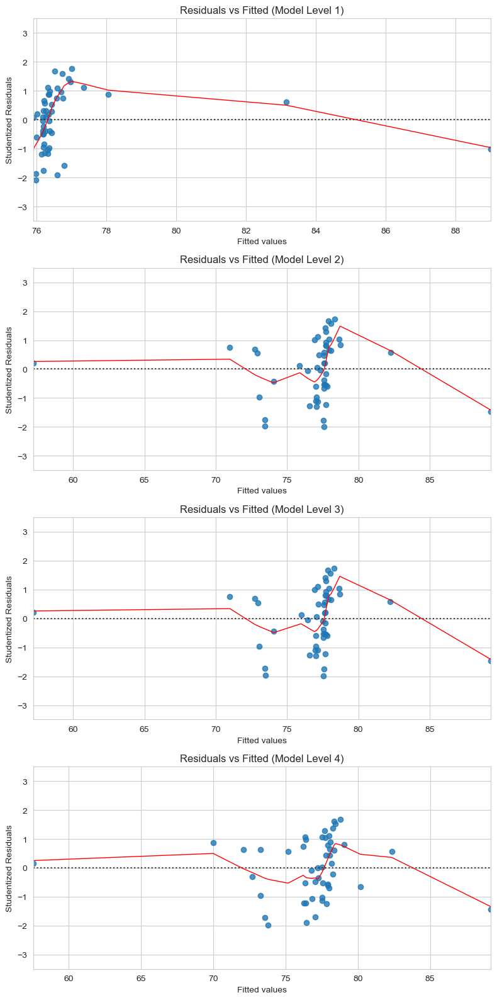

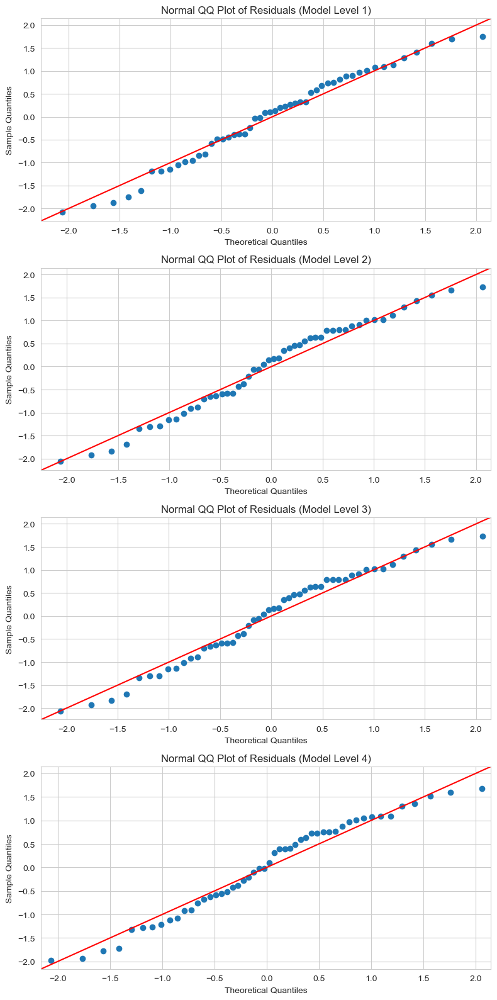

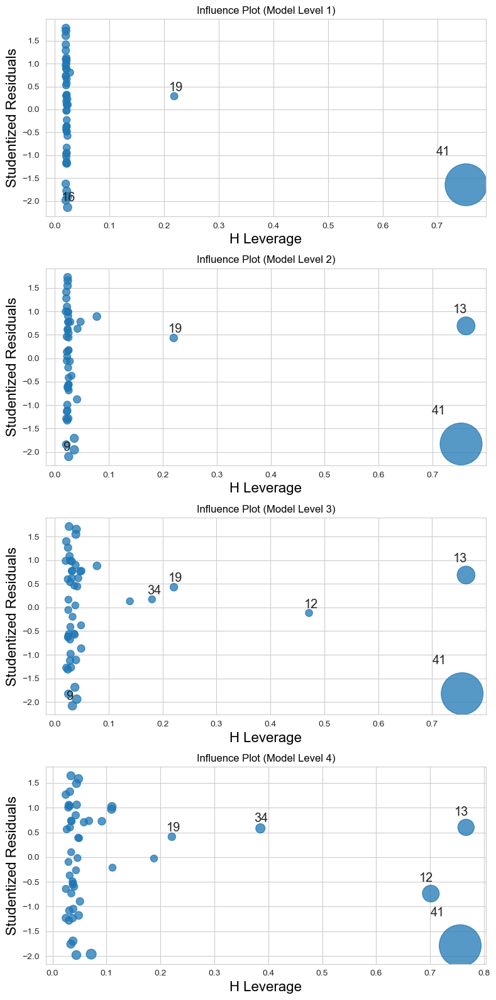

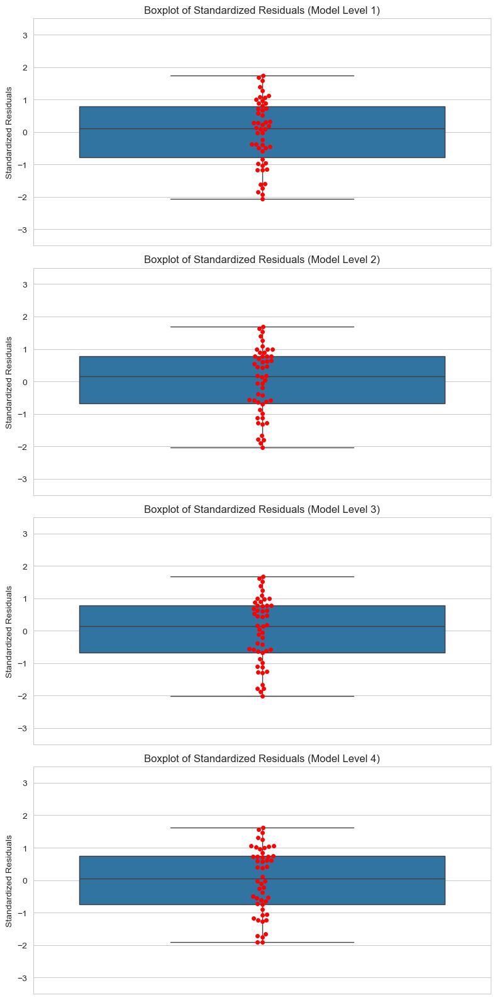

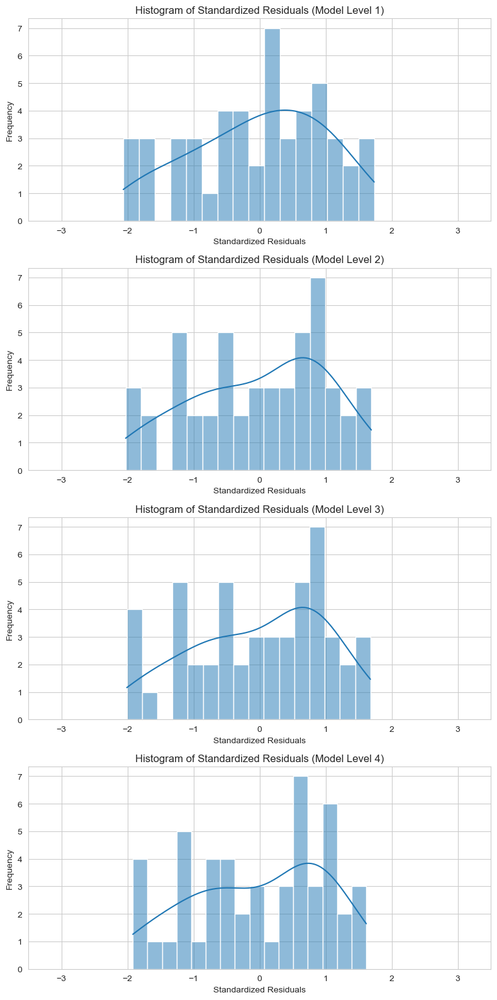

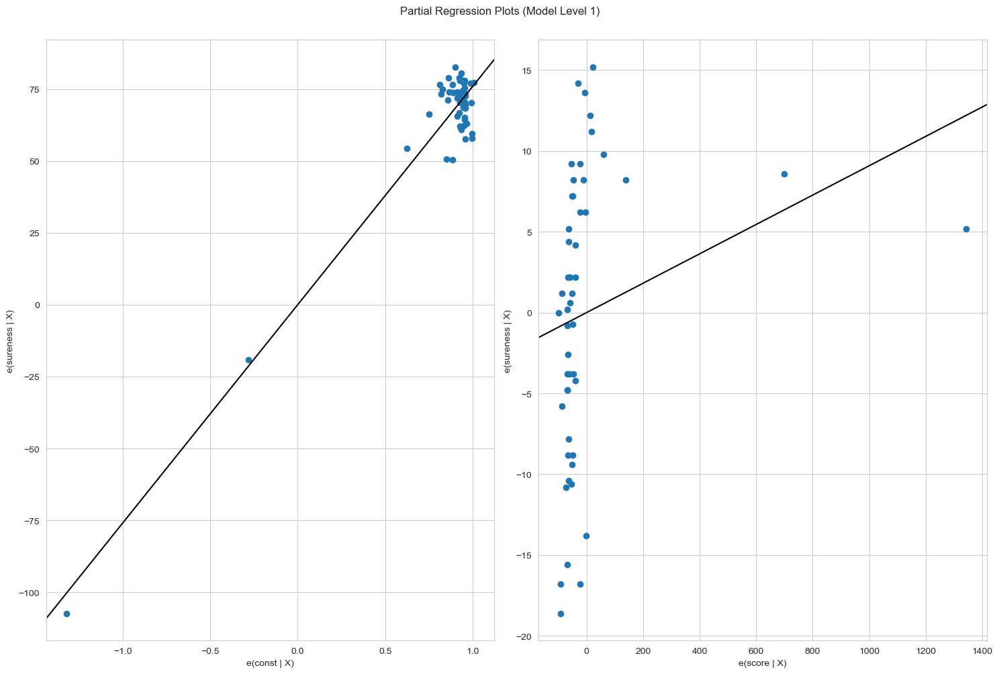

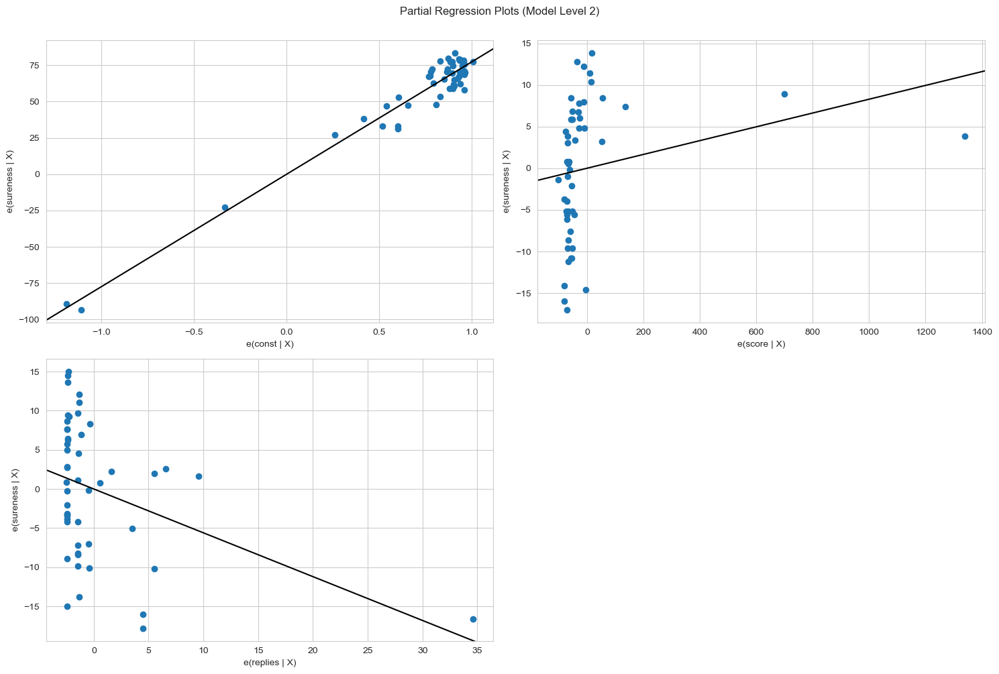

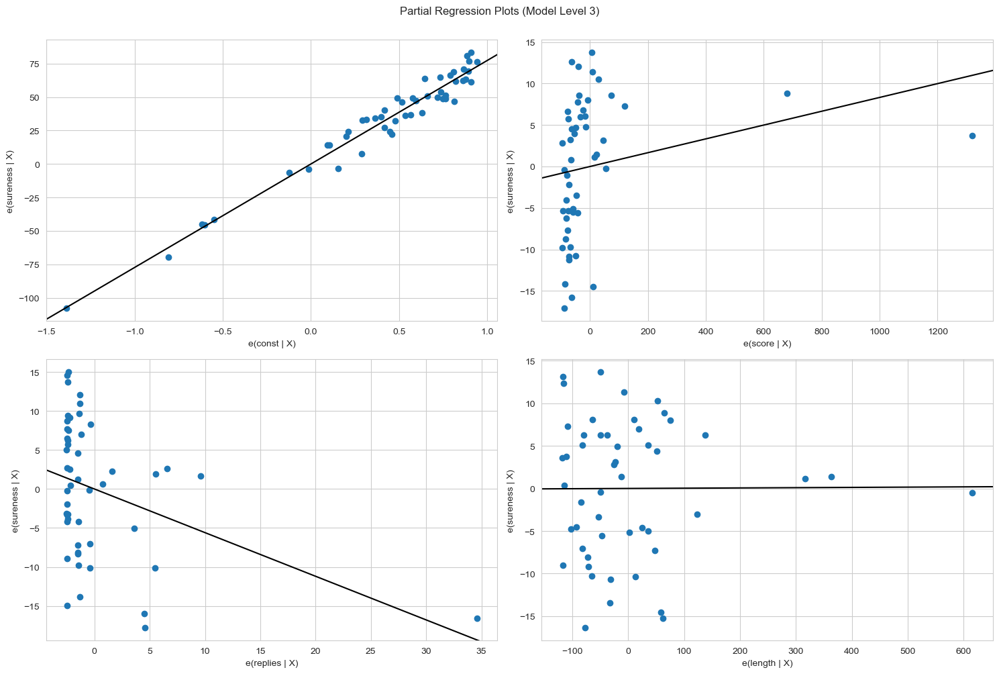

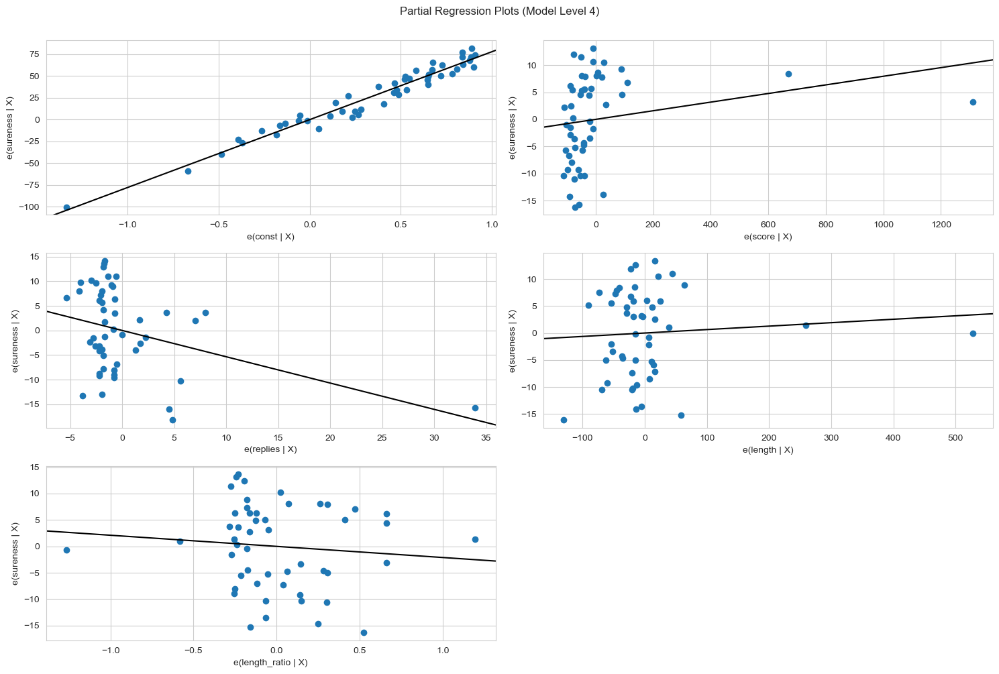

In [20]:
make_plots(full_hreg, 'full_data/hierarchy1')

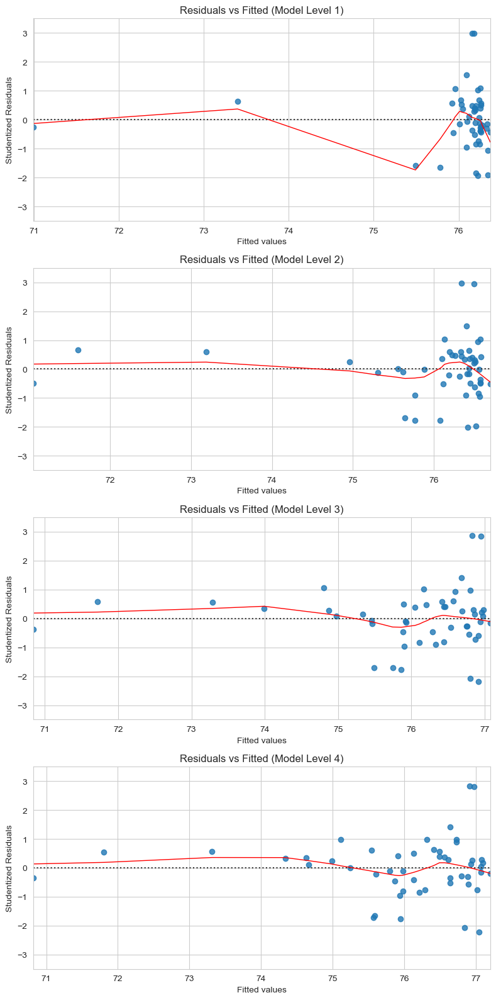

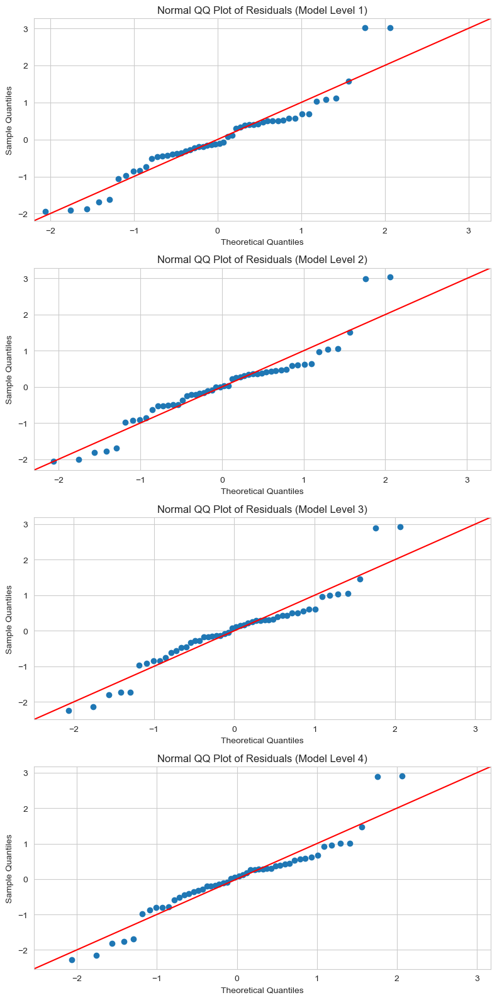

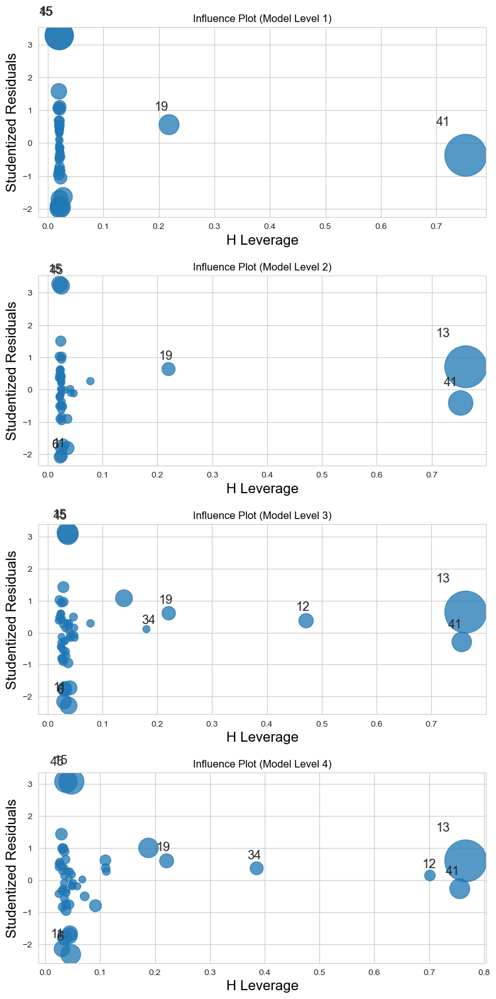

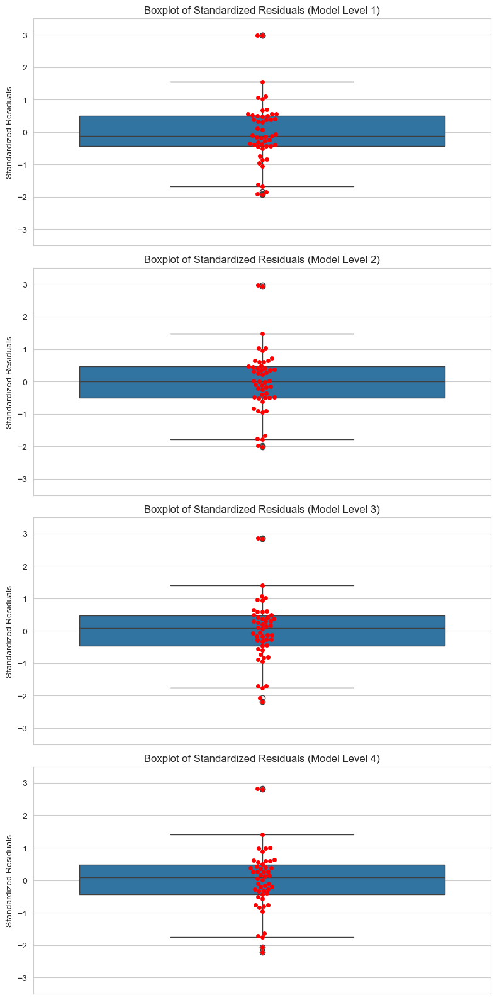

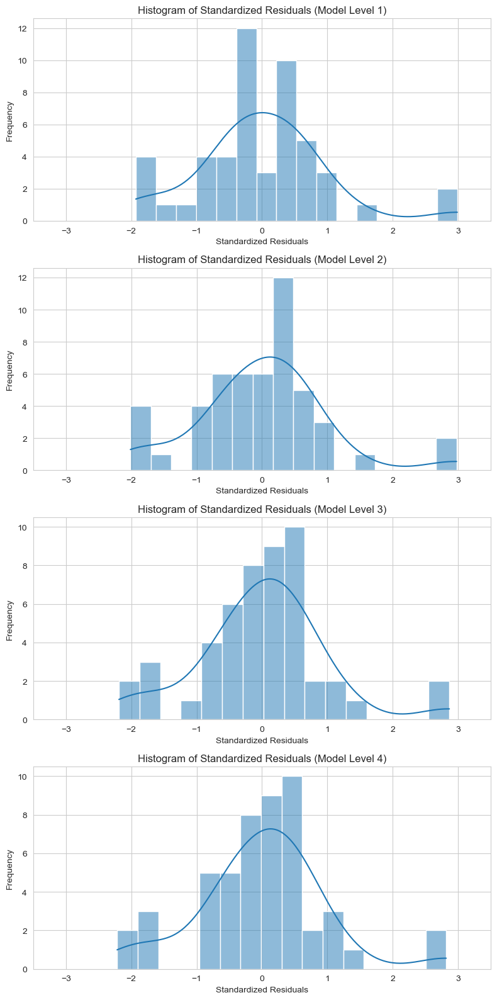

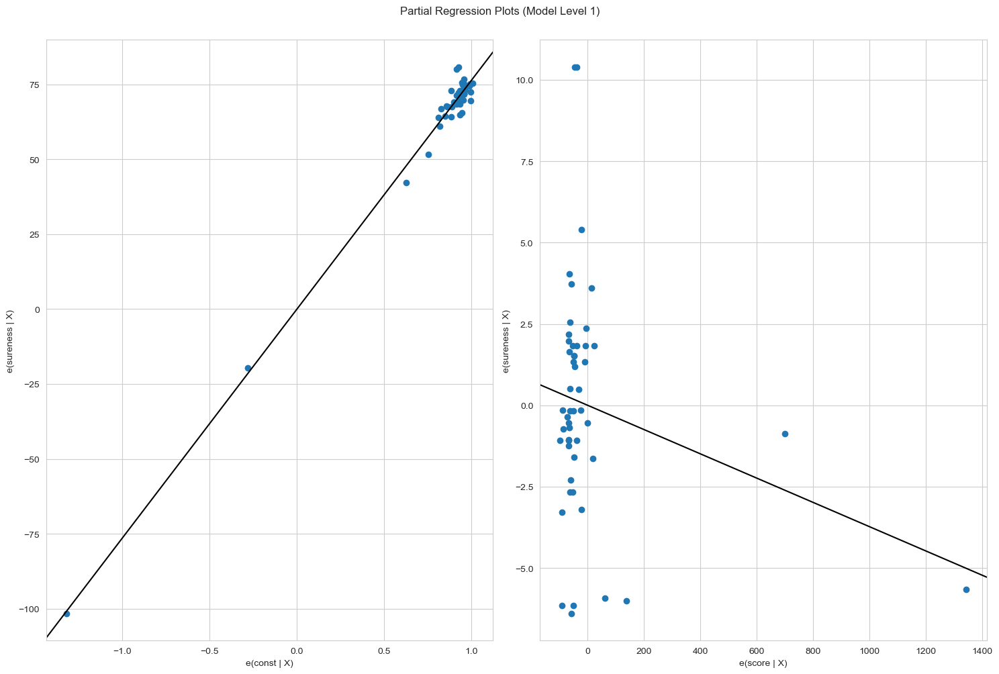

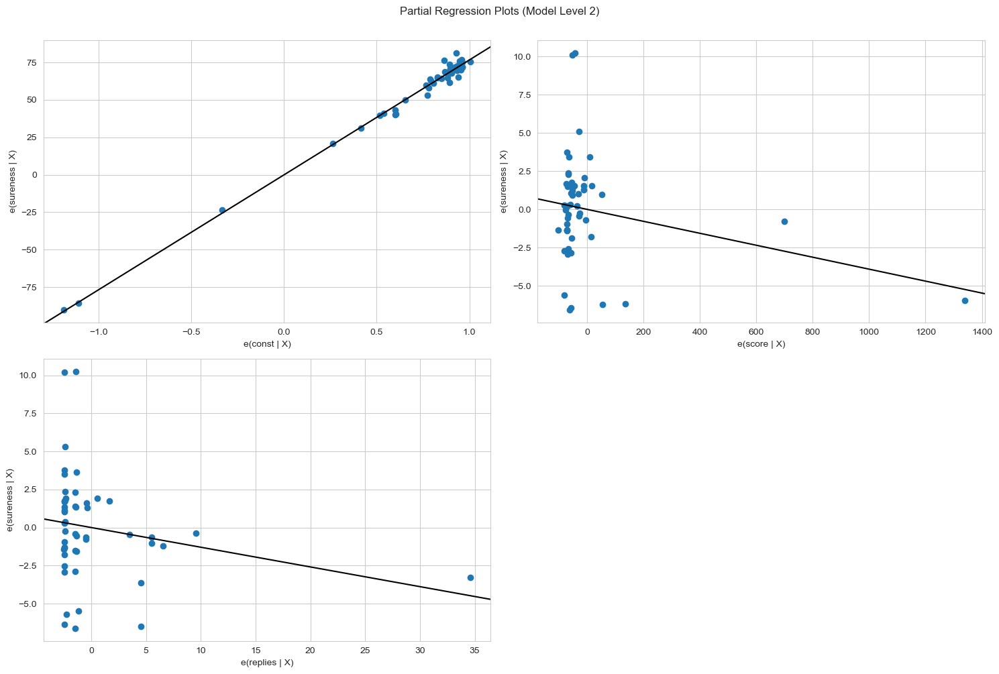

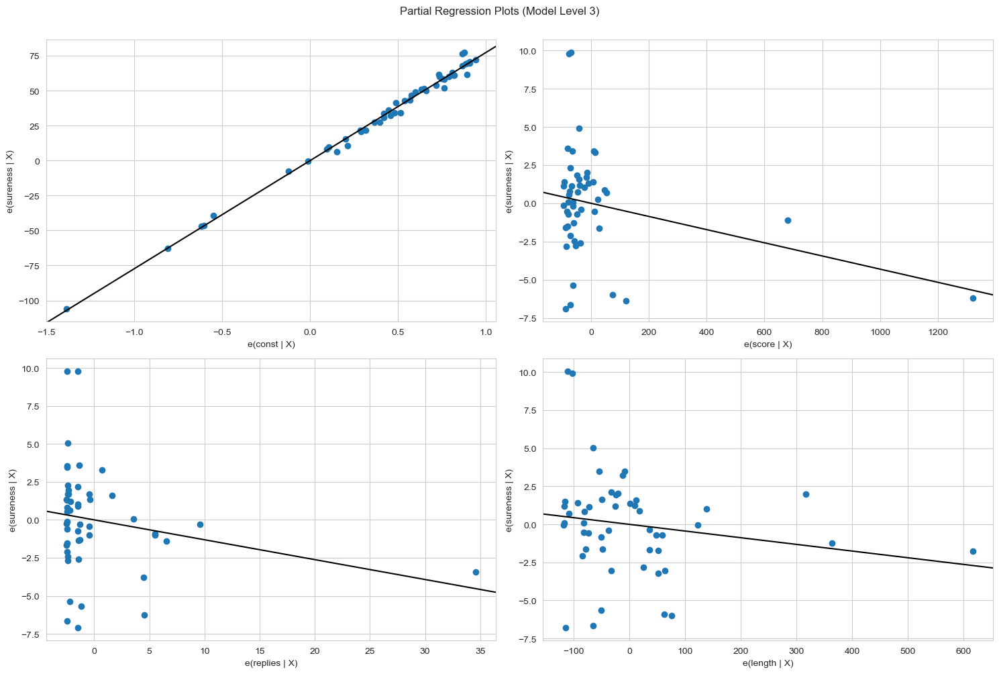

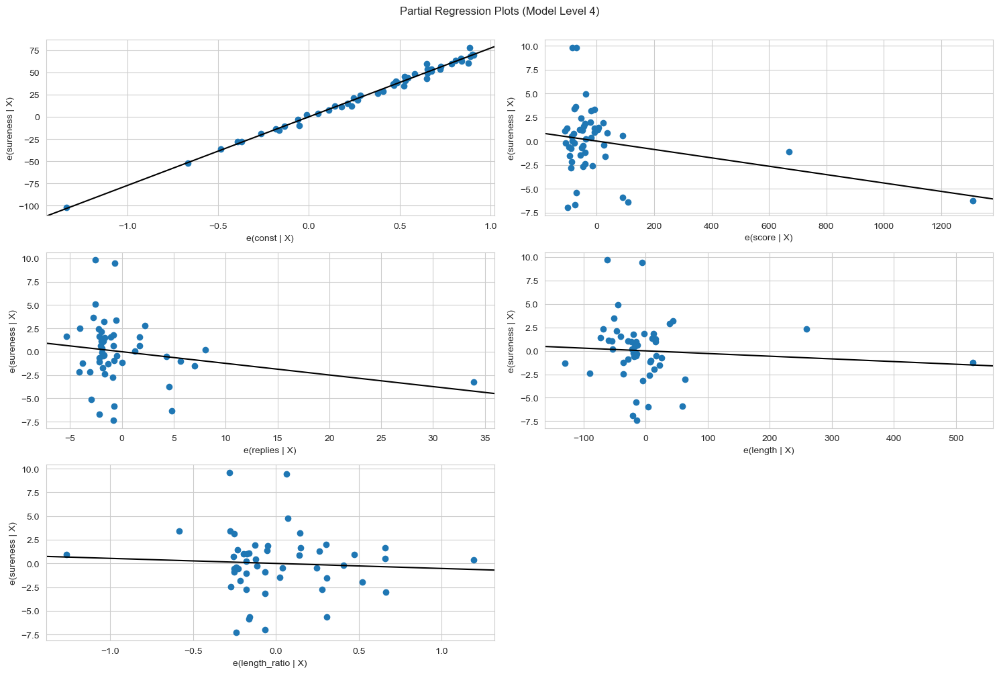

In [21]:
make_plots(fnn_hreg, 'fnn_data/hierarchy1')

# Hierarchy 2

In [22]:
hie2 = {
    1: ['score'],
    2: ['score', 'replies'],
    3: ['score', 'replies', 'length_ratio'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie2, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie2, dep_var)

In [23]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.052724,2.671587,0.108697,3653.103040,3856.427643,...,78.702605,"{'const': 75.94995596787473, 'score': 0.009086...","{'const': 1.2084343324020237e-45, 'score': 0.1...",{'score': 0.22961611958534275},{'score': 0.22961611958534356},{'score': 0.22961611958534348},{'score': 5.272356237343075},NaN,NaN,NaN
1,2,"[score, replies]",50.0,47.0,2.0,0.183989,5.298619,0.008411,3146.888749,3856.427643,...,78.702605,"{'const': 77.34589215516962, 'score': 0.008292...","{'const': 4.548528629512018e-45, 'score': 0.11...","{'score': 0.20953797090547574, 'replies': -0.3...","{'score': 0.22563289697992547, 'replies': -0.3...","{'score': 0.209216951023463, 'replies': -0.362...","{'score': 4.377173259555411, 'replies': 13.126...",0.131265,7.560506,0.008441
2,3,"[score, replies, length_ratio]",50.0,46.0,3.0,0.187558,3.539815,0.021730,3133.122839,3856.427643,...,78.702605,"{'const': 78.0022619975046, 'score': 0.0078702...","{'const': 6.7373846579542595e-37, 'score': 0.1...","{'score': 0.1988750480943967, 'replies': -0.35...","{'score': 0.21195746311767752, 'replies': -0.3...","{'score': 0.19549079446409615, 'replies': -0.3...","{'score': 3.8216650720203487, 'replies': 12.45...",0.003570,0.202109,0.655135


In [24]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1849543367384463
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(0.22961611958534342), 'p-value': np.float64(0.10869660919186991), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.5146742223968265
    p-value: 0.9460127851964387
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.19259758893648282
    p-value: 0.6607634033828238
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.7862675357765974
    p-value: 0.7155559154872408
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [41]
    Passed: False
  Normality (mean of residuals):
    Mean: 3.012

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1849543367384463),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(0.22961611958534342),
    'p-value': np.float64(0.10869660919186991),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.5146742223968265),
   'p-value': np.float64(0.9460127851964387),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.19259758893648282),
   'p-value': np.float64(0.6607634033828238),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.7862675357765974),
   'p-value': np.float64(0.7155559154872408),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype

In [25]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.056199,2.858190,0.097395,575.730574,610.012807,...,12.449241,"{'const': 76.35763933568613, 'score': -0.00373...","{'const': 6.911821380945499e-65, 'score': 0.09...",{'score': -0.23706370590385575},{'score': -0.23706370700083093},{'score': -0.23706370700083088},{'score': 5.619920117697579},NaN,NaN,NaN
1,2,"[score, replies]",50.0,47.0,2.0,0.100588,2.628183,0.082800,548.652803,610.012807,...,12.449241,"{'const': 76.6804923344161, 'score': -0.003914...","{'const': 1.3339199875345576e-62, 'score': 0.0...","{'score': -0.24873948957733366, 'replies': -0....","{'score': -0.25333545691653386, 'replies': -0....","{'score': -0.24835841267541695, 'replies': -0....","{'score': 6.16819011466527, 'replies': 4.43888...",0.044389,2.319600,0.134454
2,3,"[score, replies, length_ratio]",50.0,46.0,3.0,0.125161,2.193707,0.101542,533.662811,610.012807,...,12.449241,"{'const': 77.36542337638707, 'score': -0.00435...","{'const': 3.566090074634355e-54, 'score': 0.05...","{'score': -0.2767162620770742, 'replies': -0.1...","{'score': -0.27924618302515386, 'replies': -0....","{'score': -0.27200738696433213, 'replies': -0....","{'score': 7.398801856316392, 'replies': 3.6456...",0.024573,1.292089,0.261550


In [26]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1175364144057585
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(-0.2370637070008309), 'p-value': np.float64(0.09739451040215853), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.1291261916864321
    p-value: 0.3866381842905979
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.21511408762094897
    p-value: 0.6427882257697356
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.5697891169311007
    p-value: 0.907526892015278
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: 1.6484591

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1175364144057585),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(-0.2370637070008309),
    'p-value': np.float64(0.09739451040215853),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.1291261916864321),
   'p-value': np.float64(0.3866381842905979),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.21511408762094897),
   'p-value': np.float64(0.6427882257697356),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.5697891169311007),
   'p-value': np.float64(0.907526892015278),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype=

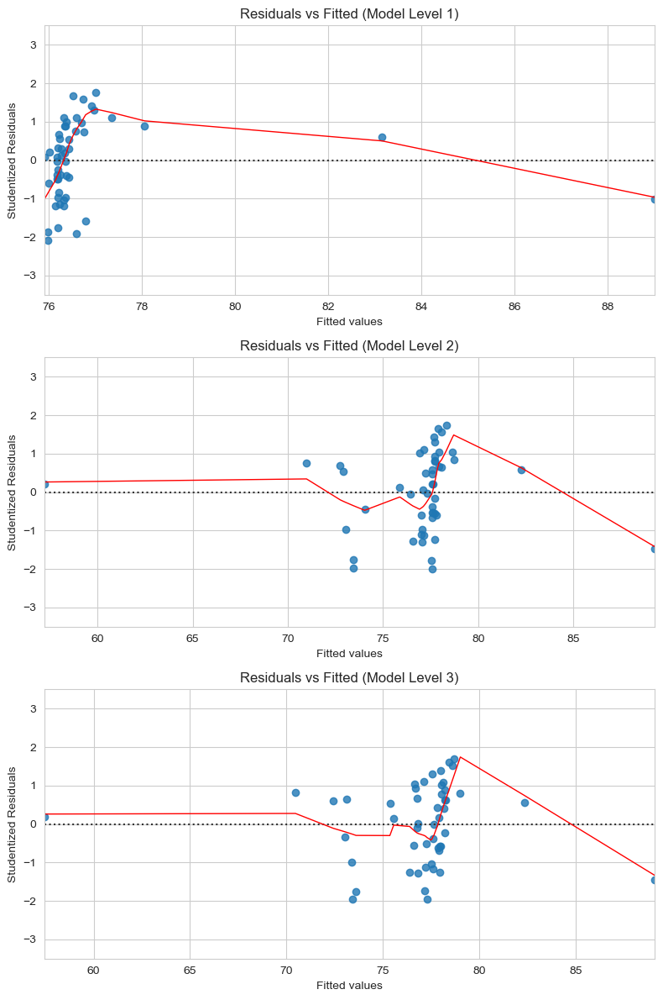

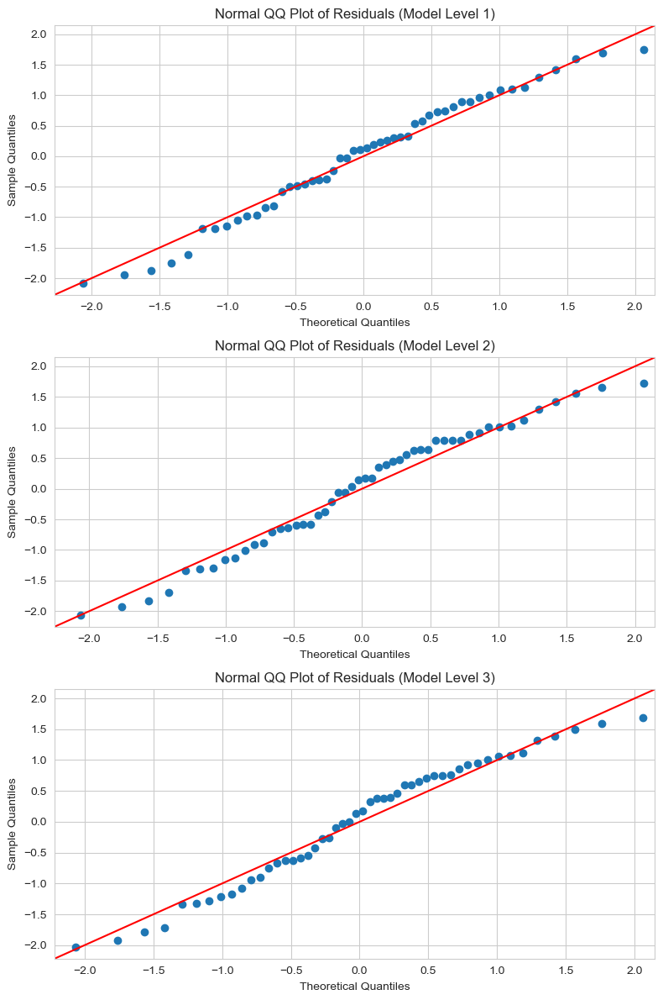

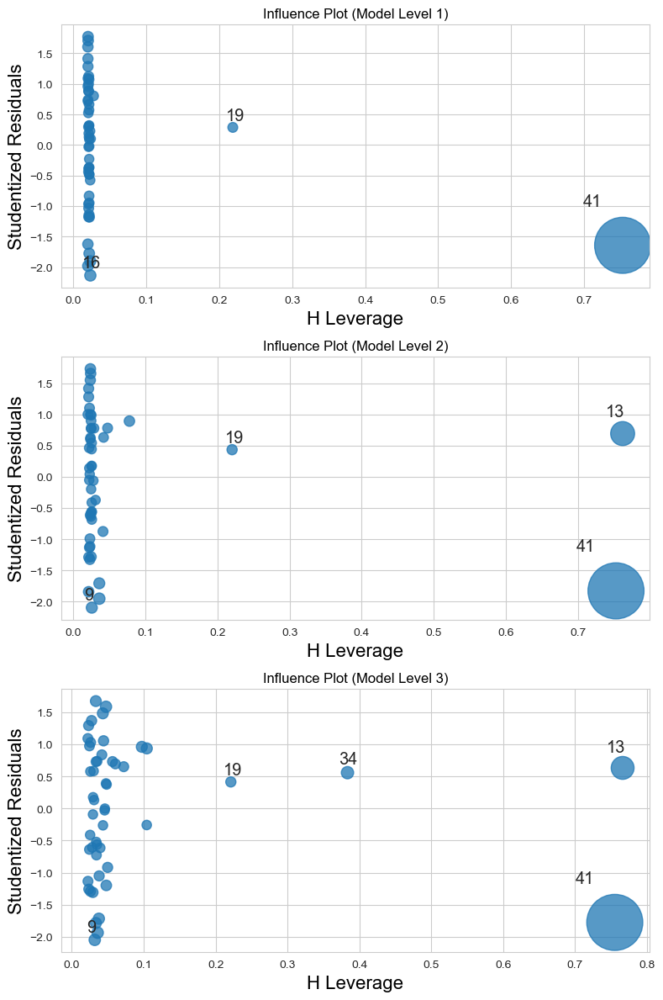

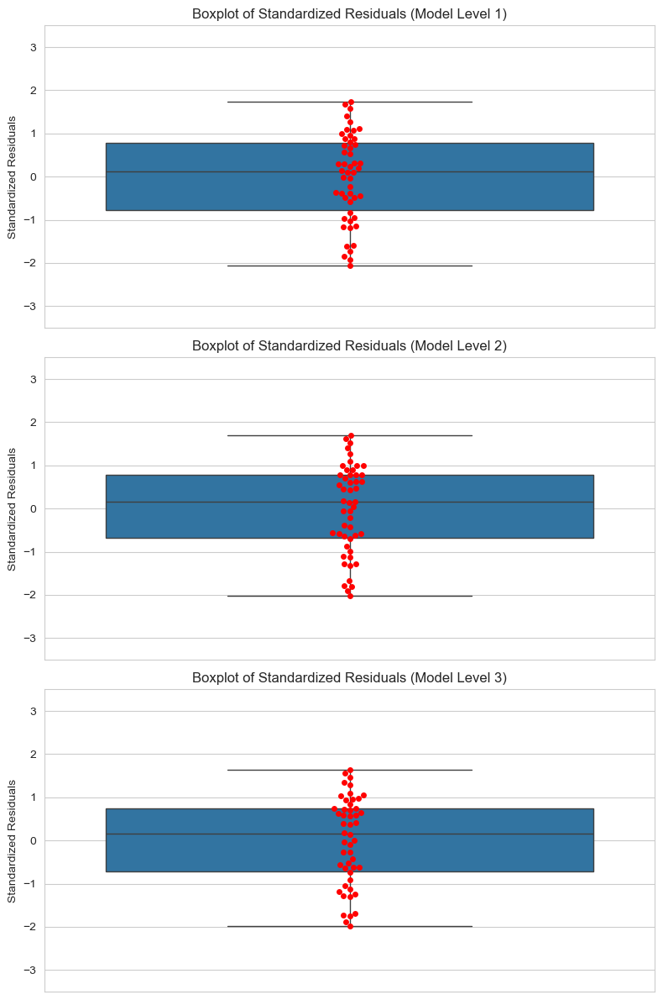

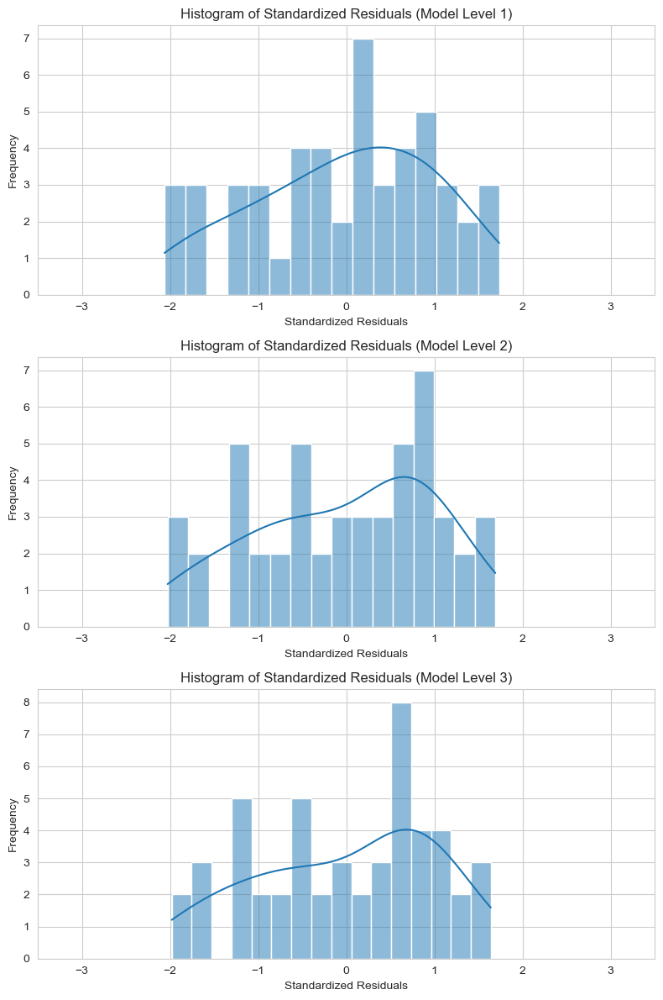

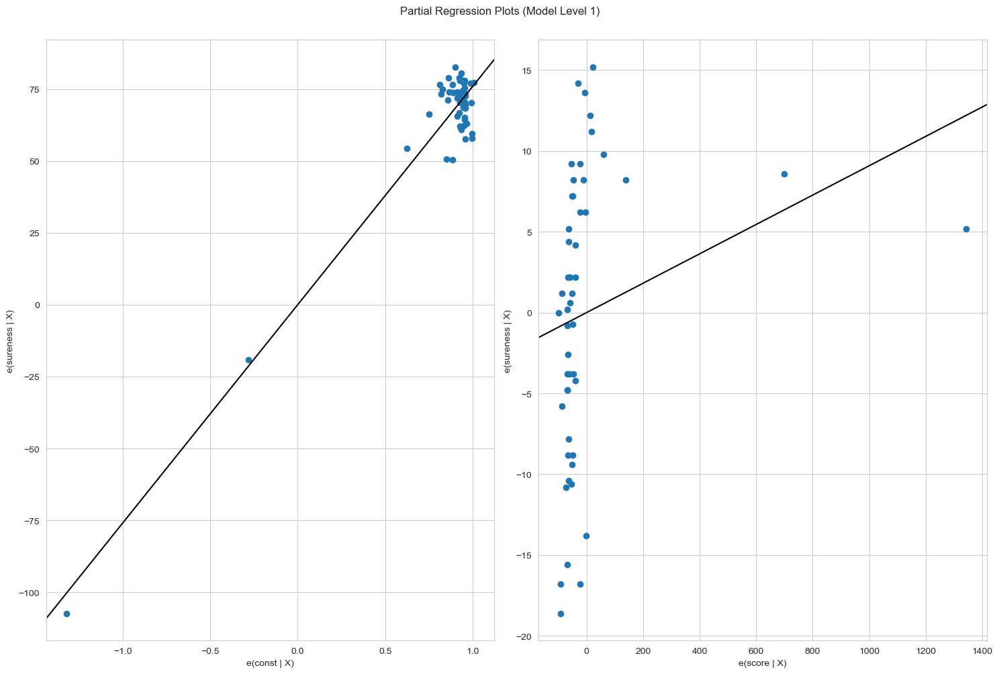

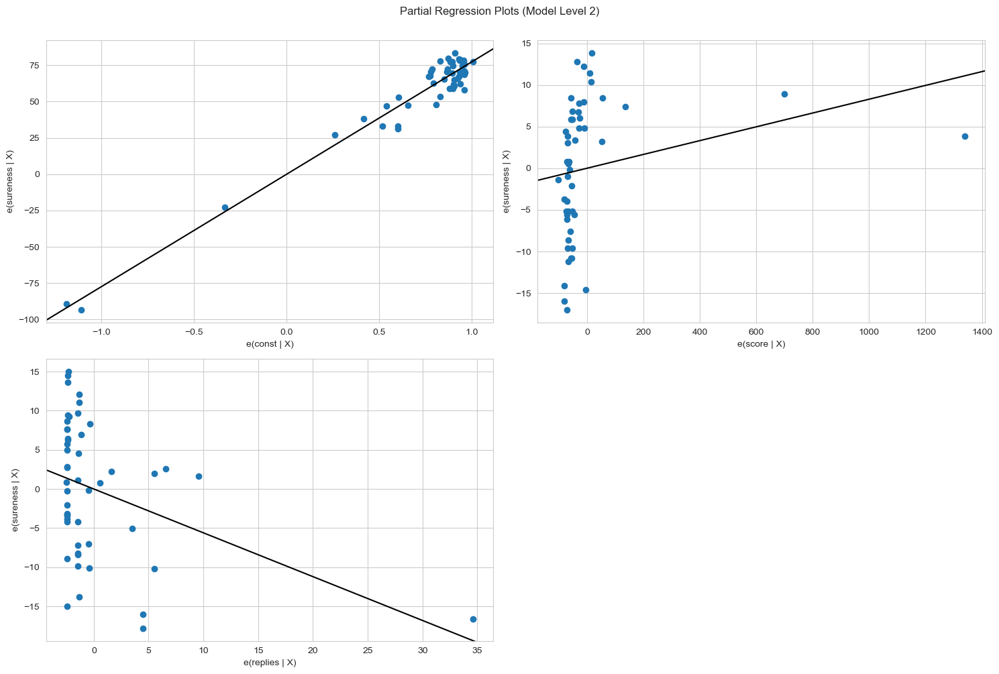

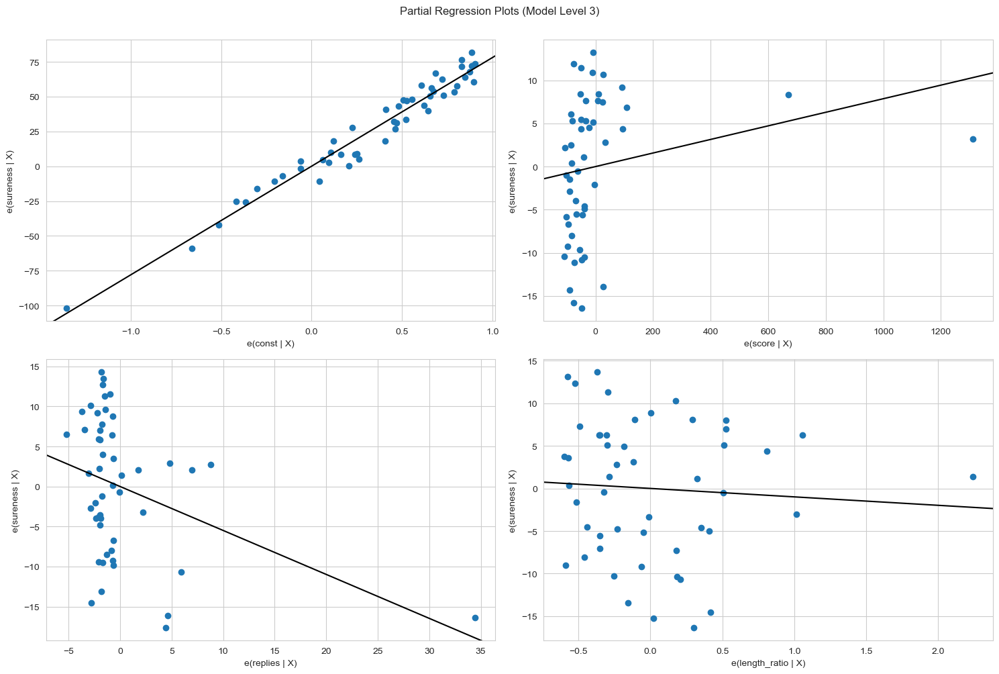

In [27]:
make_plots(full_hreg, 'full_data/hierarchy2')

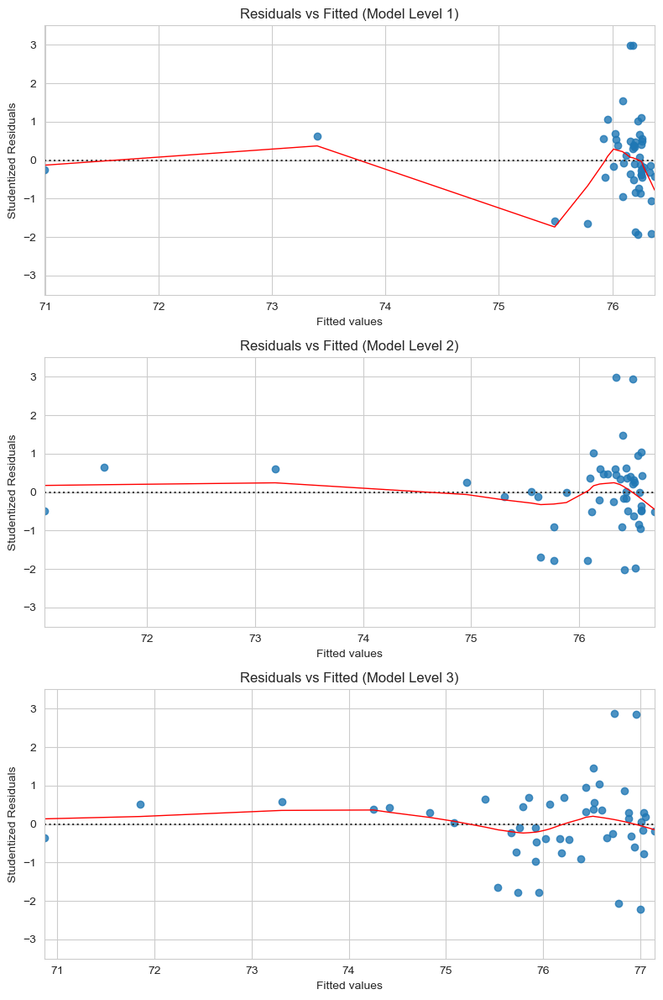

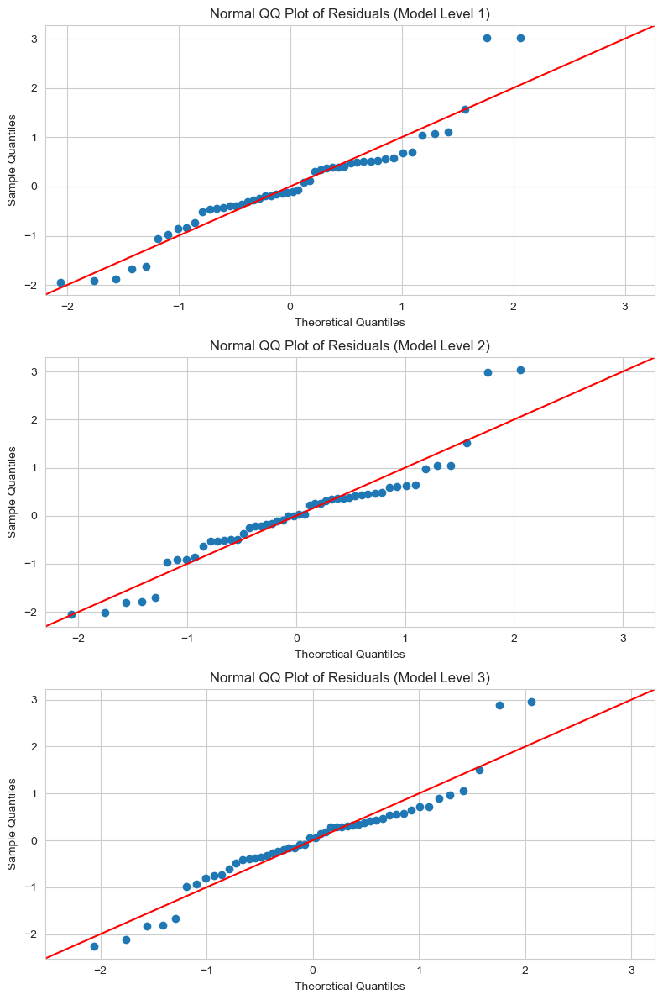

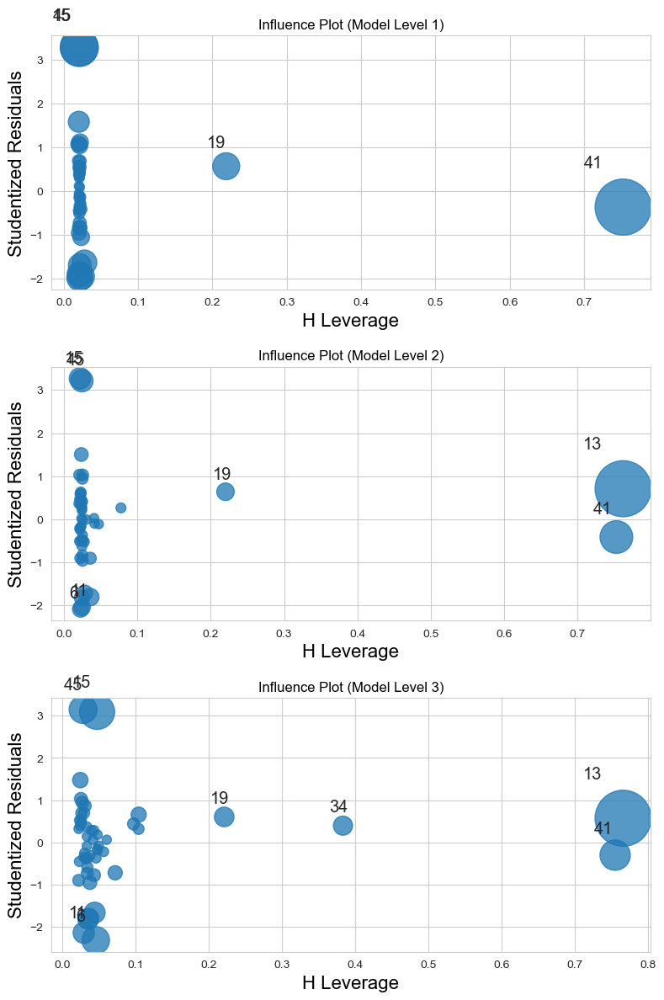

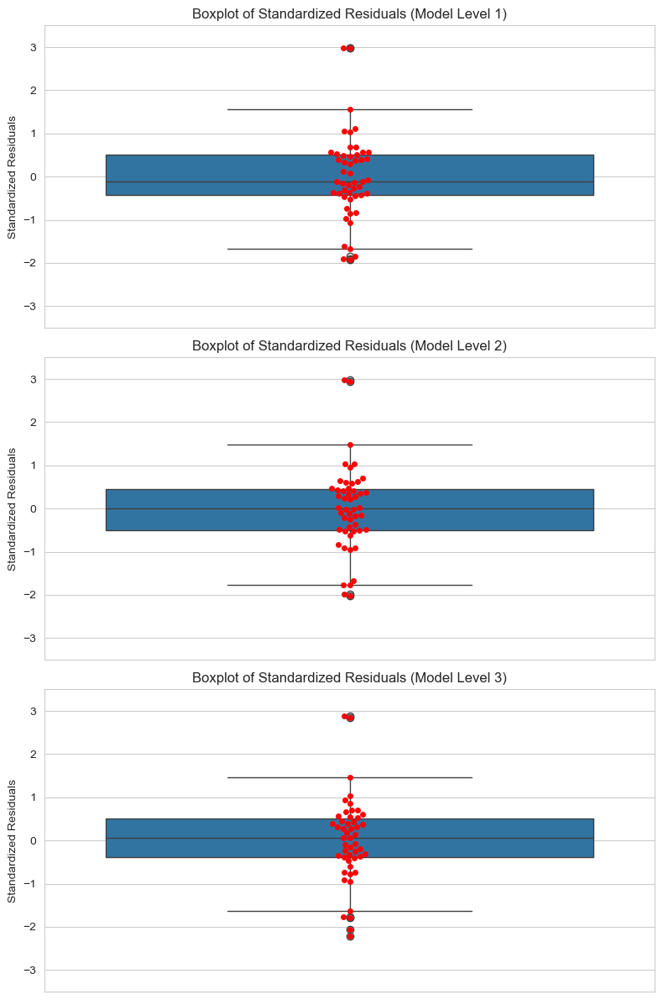

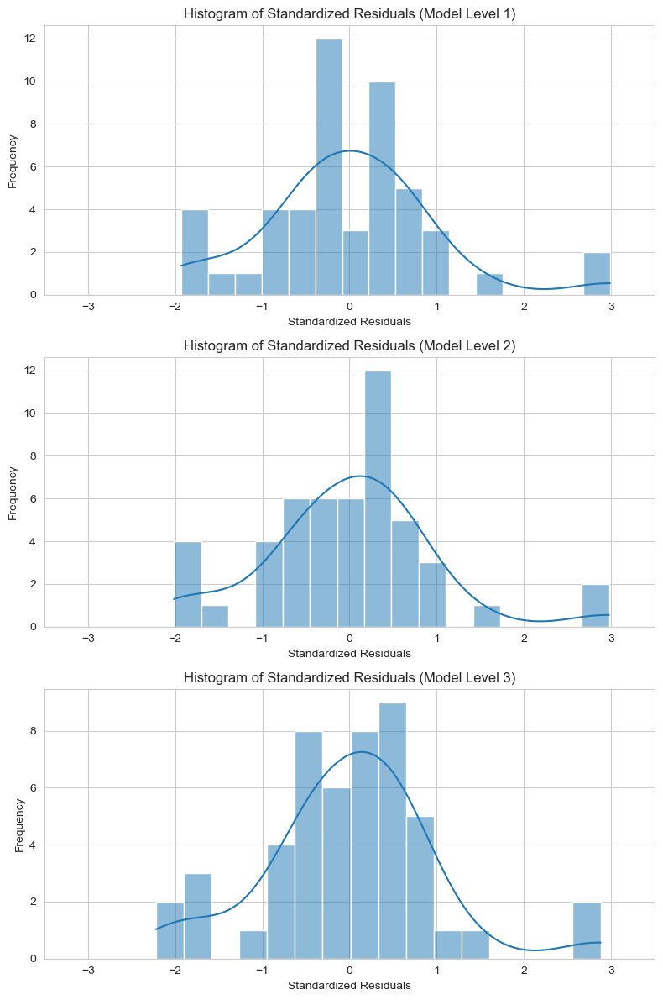

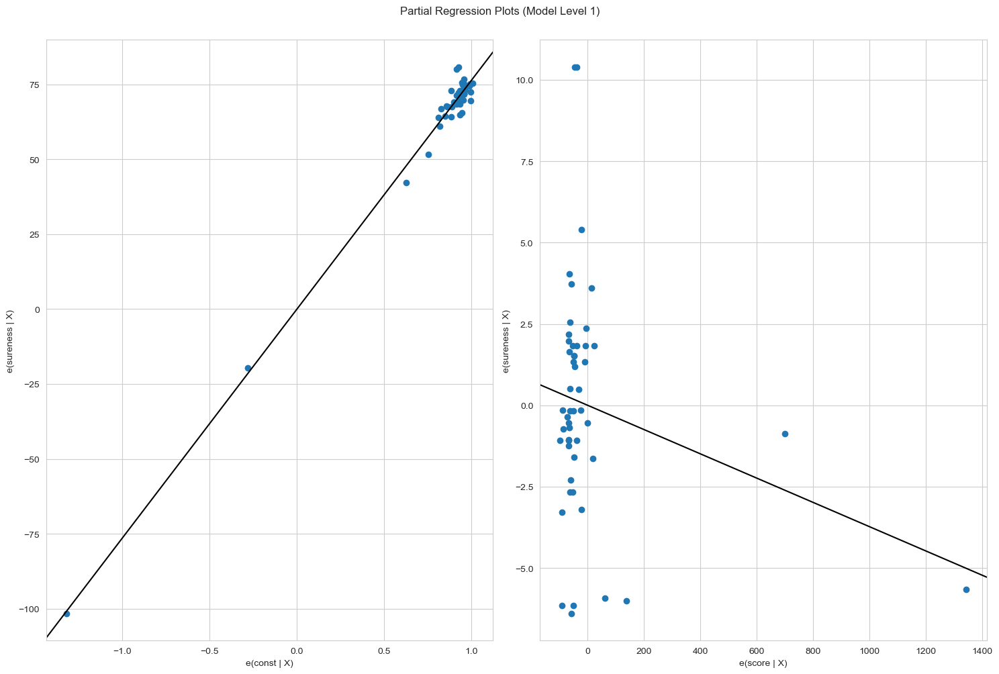

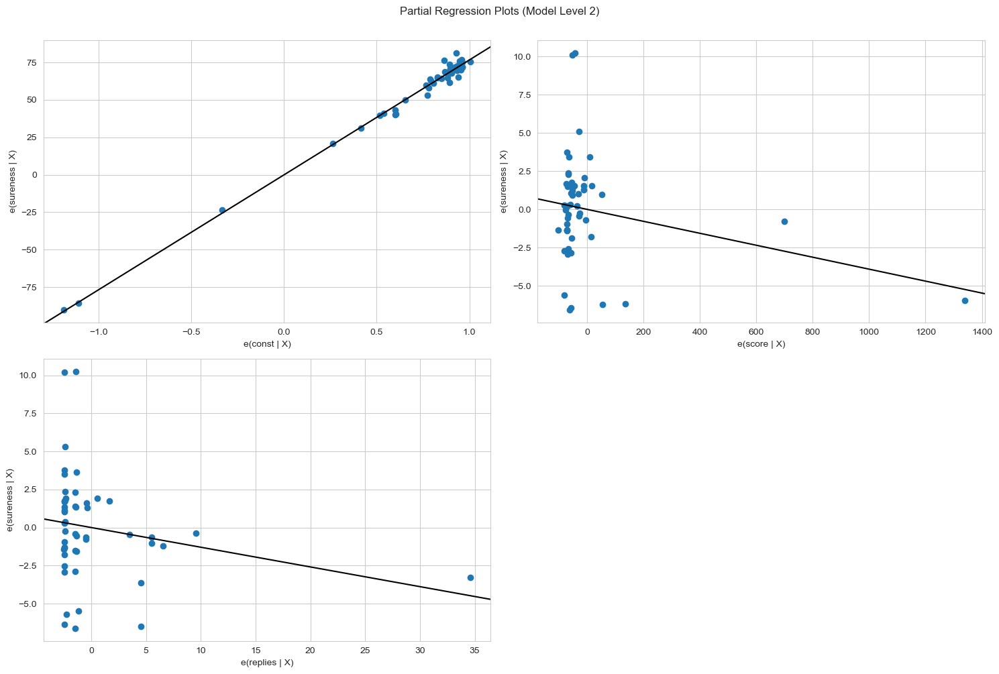

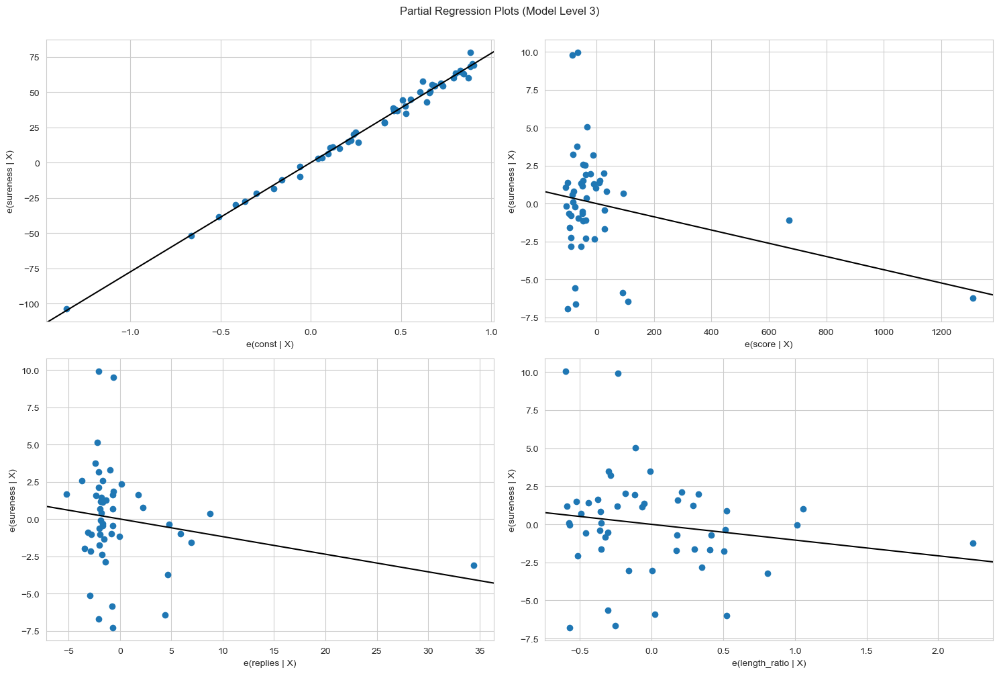

In [28]:
make_plots(fnn_hreg, 'fnn_data/hierarchy2')

# Hierarchy 3

In [29]:
hie3 = {
    1: ['score'],
    2: ['score', 'length'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie3, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie3, dep_var)

In [30]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.052724,2.671587,0.108697,3653.103040,3856.427643,...,78.702605,"{'const': 75.94995596787473, 'score': 0.009086...","{'const': 1.2084343324020237e-45, 'score': 0.1...",{'score': 0.22961611958534275},{'score': 0.22961611958534356},{'score': 0.22961611958534348},{'score': 5.272356237343075},NaN,NaN,NaN
1,2,"[score, length]",50.0,47.0,2.0,0.052810,1.310238,0.279427,3652.768278,3856.427643,...,78.702605,"{'const': 75.87045067229788, 'score': 0.009142...","{'const': 8.153536729695308e-39, 'score': 0.11...","{'score': 0.23101754545830652, 'length': 0.009...","{'score': 0.22851876393371365, 'length': 0.009...","{'score': 0.22844768059194526, 'length': 0.009...","{'score': 5.218834276783944, 'length': 0.00868...",0.000087,0.004307,0.94795


In [31]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1849543367384463
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(0.22961611958534342), 'p-value': np.float64(0.10869660919186991), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.5146742223968265
    p-value: 0.9460127851964387
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.19259758893648282
    p-value: 0.6607634033828238
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.7862675357765974
    p-value: 0.7155559154872408
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [41]
    Passed: False
  Normality (mean of residuals):
    Mean: 3.012

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1849543367384463),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(0.22961611958534342),
    'p-value': np.float64(0.10869660919186991),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.5146742223968265),
   'p-value': np.float64(0.9460127851964387),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.19259758893648282),
   'p-value': np.float64(0.6607634033828238),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.7862675357765974),
   'p-value': np.float64(0.7155559154872408),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype

In [32]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.056199,2.858190,0.097395,575.730574,610.012807,...,12.449241,"{'const': 76.35763933568613, 'score': -0.00373...","{'const': 6.911821380945499e-65, 'score': 0.09...",{'score': -0.23706370590385575},{'score': -0.23706370700083093},{'score': -0.23706370700083088},{'score': 5.619920117697579},NaN,NaN,NaN
1,2,"[score, length]",50.0,47.0,2.0,0.082322,2.108114,0.132807,559.795261,610.012807,...,12.449241,"{'const': 76.90617940243122, 'score': -0.00411...","{'const': 5.2157317660135884e-58, 'score': 0.0...","{'score': -0.26137485824840173, 'length': -0.1...","{'score': -0.26049622846197373, 'length': -0.1...","{'score': -0.25846729645462496, 'length': -0.1...","{'score': 6.680534333656299, 'length': 2.61229...",0.026123,1.337917,0.253247


In [33]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1175364144057585
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(-0.2370637070008309), 'p-value': np.float64(0.09739451040215853), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.1291261916864321
    p-value: 0.3866381842905979
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.21511408762094897
    p-value: 0.6427882257697356
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.5697891169311007
    p-value: 0.907526892015278
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: 1.6484591

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1175364144057585),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(-0.2370637070008309),
    'p-value': np.float64(0.09739451040215853),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.1291261916864321),
   'p-value': np.float64(0.3866381842905979),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.21511408762094897),
   'p-value': np.float64(0.6427882257697356),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.5697891169311007),
   'p-value': np.float64(0.907526892015278),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype=

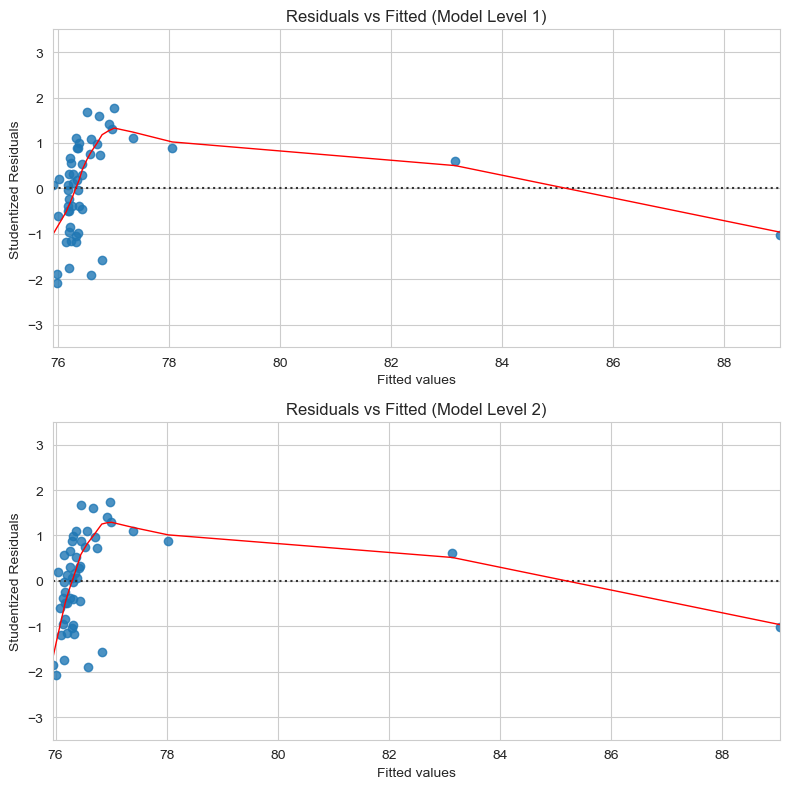

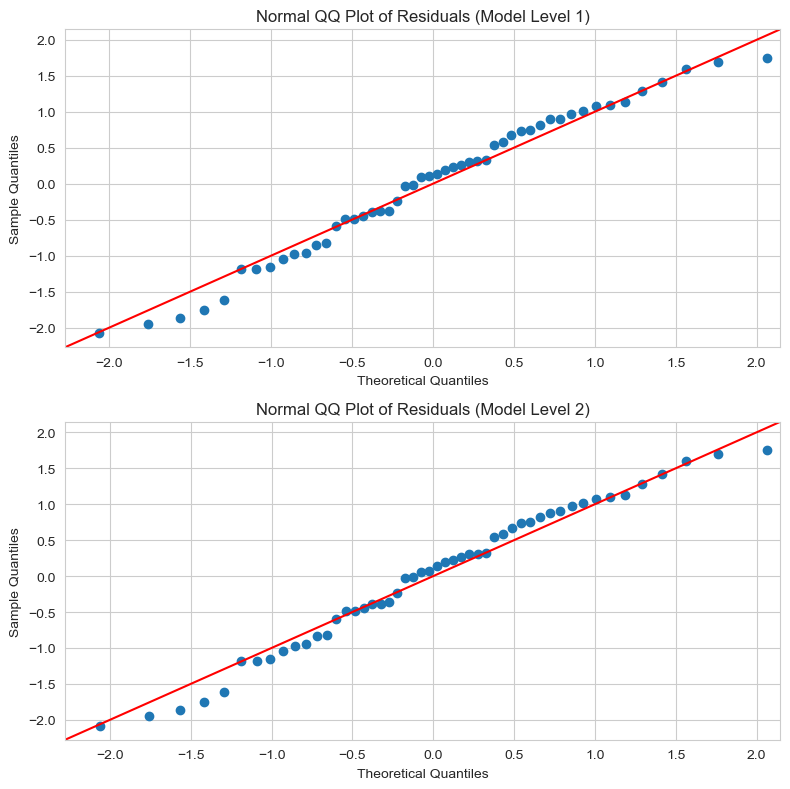

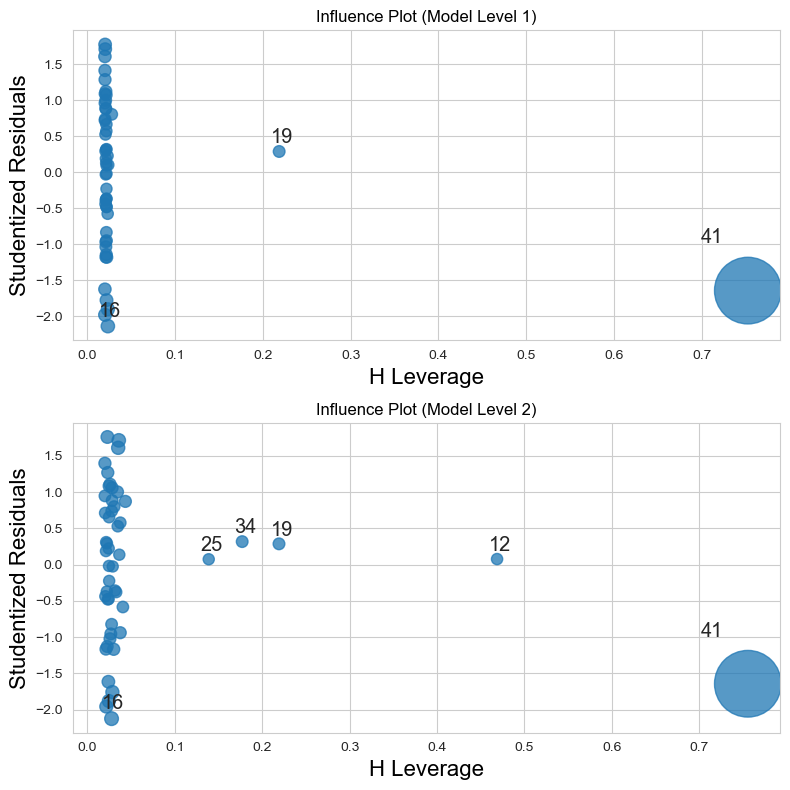

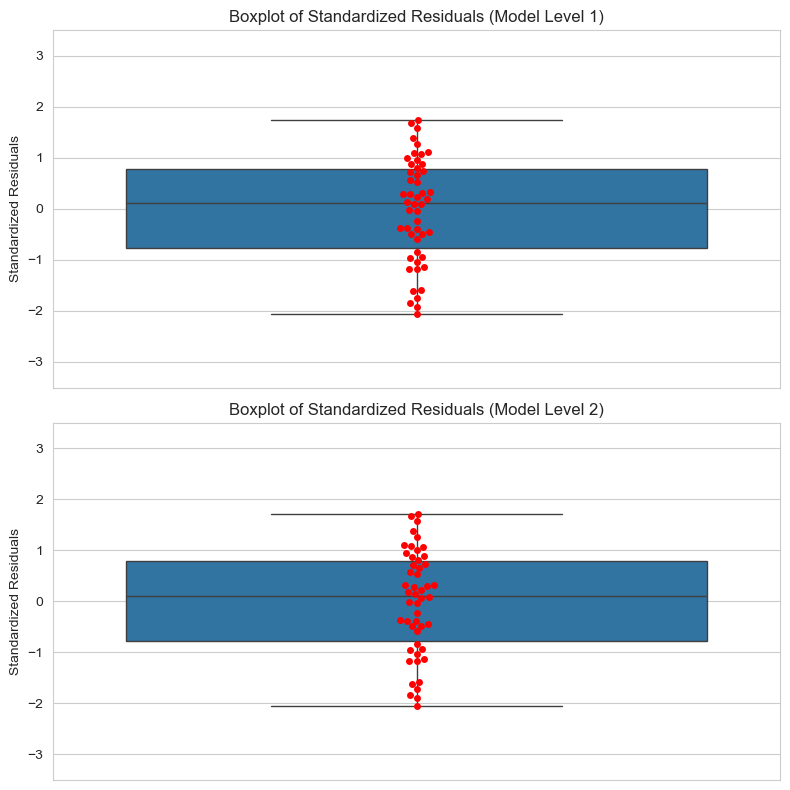

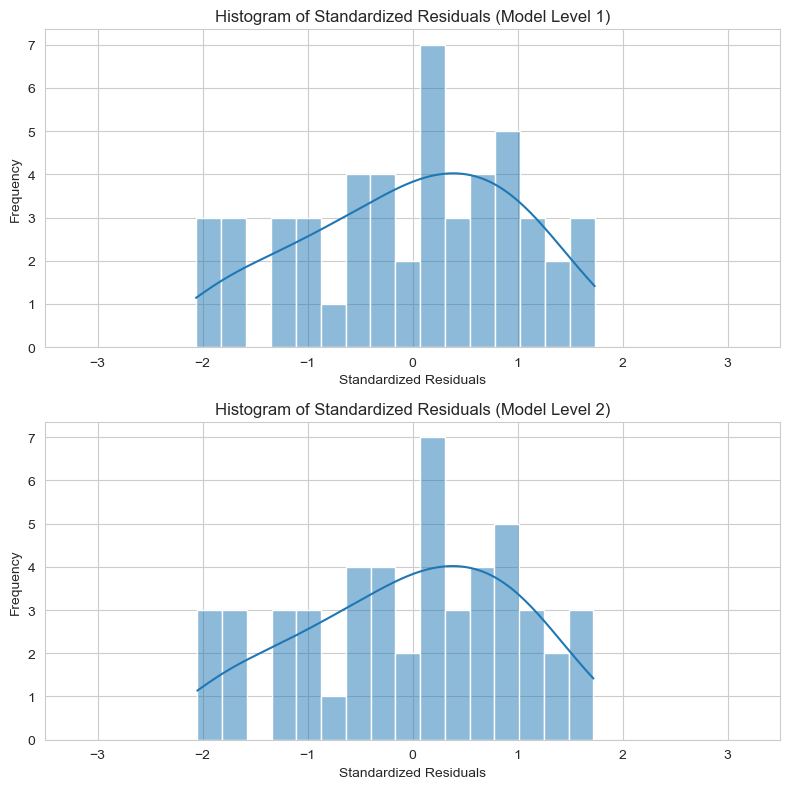

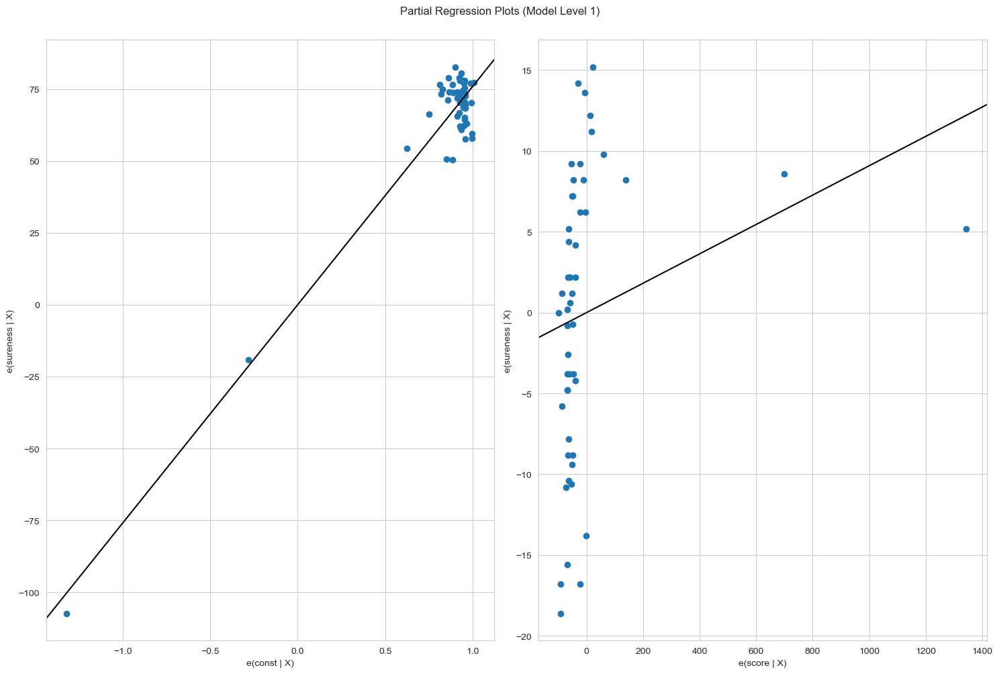

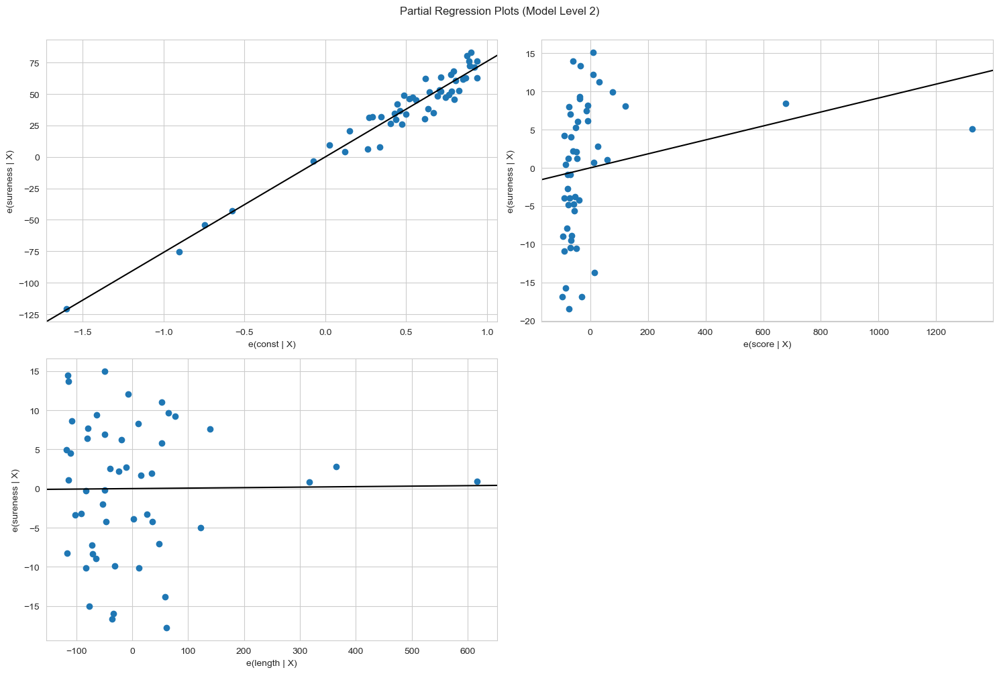

In [34]:
make_plots(full_hreg, 'full_data/hierarchy3')

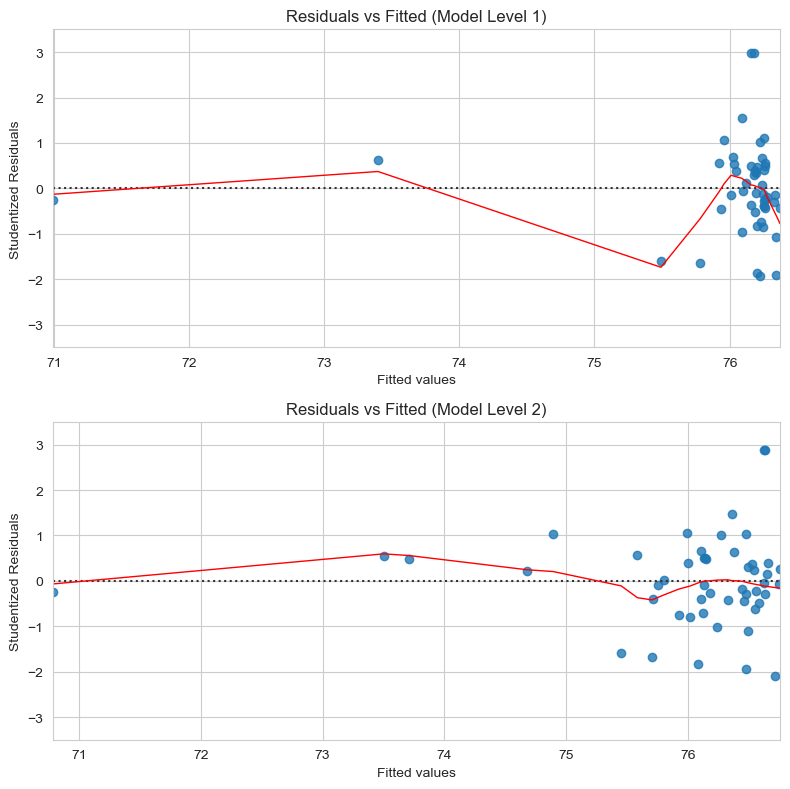

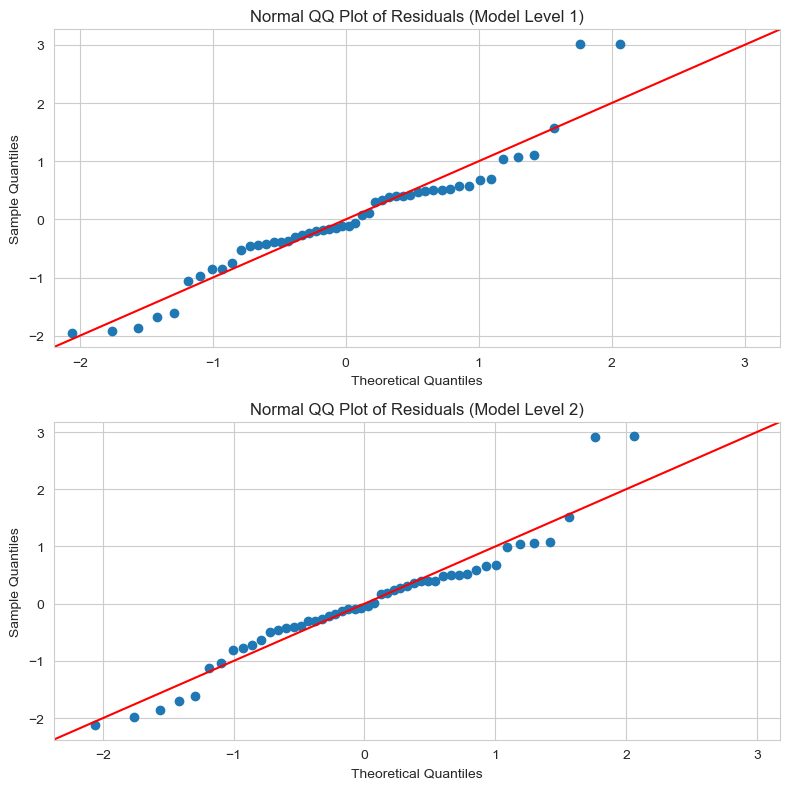

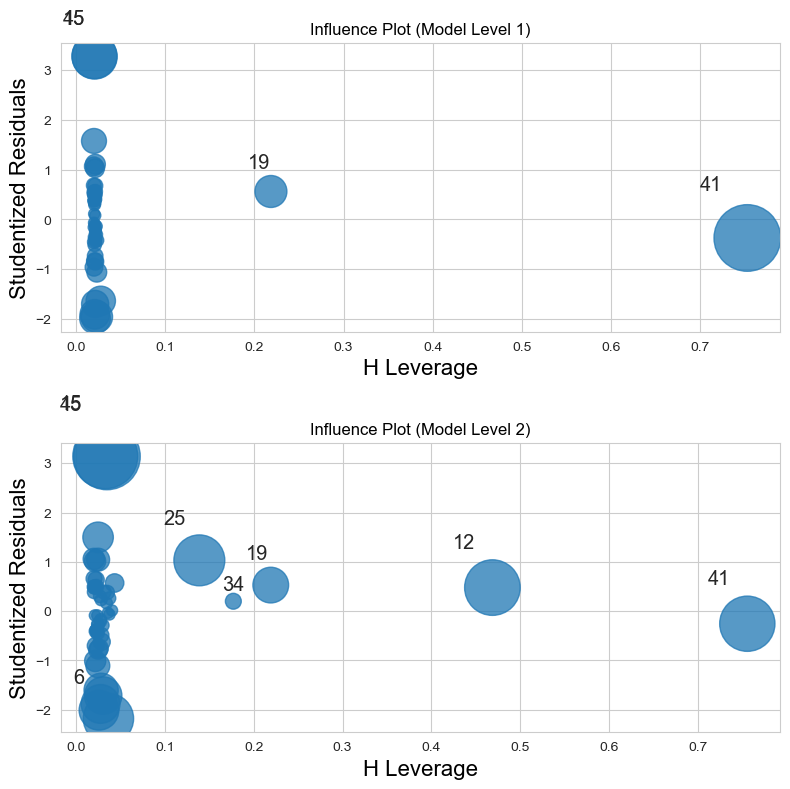

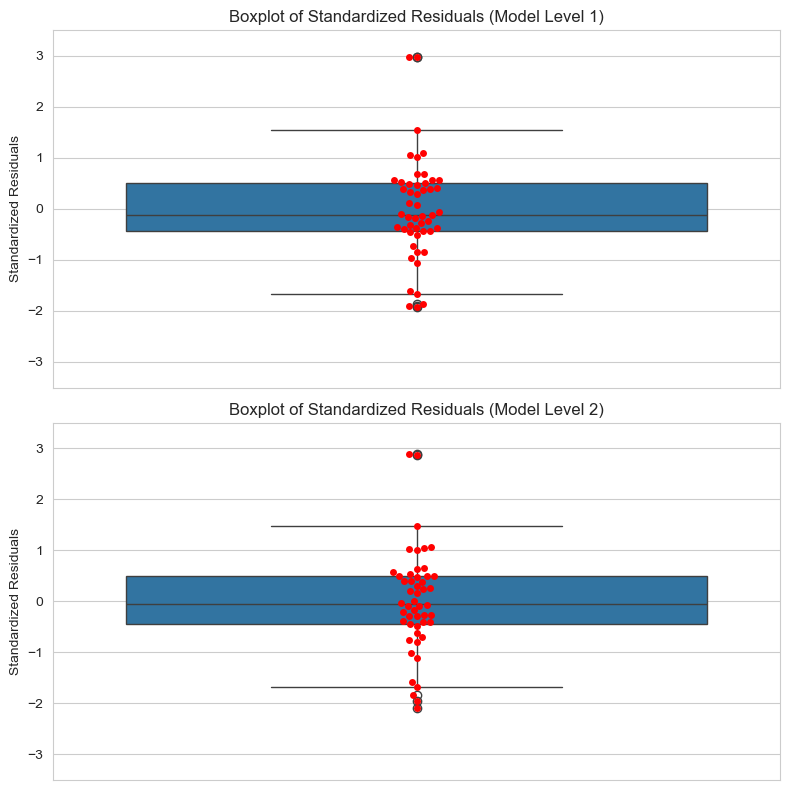

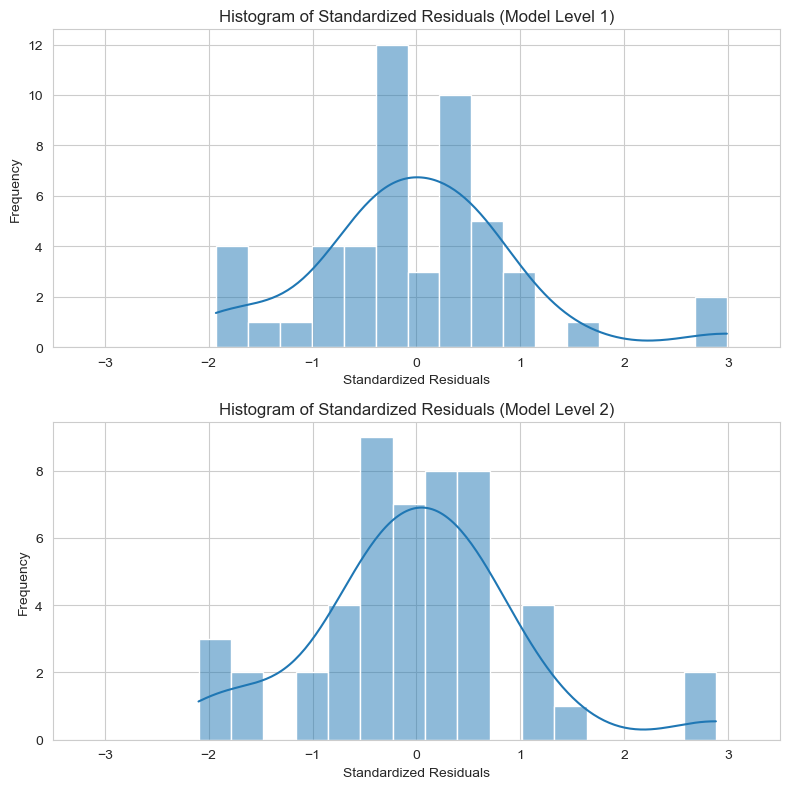

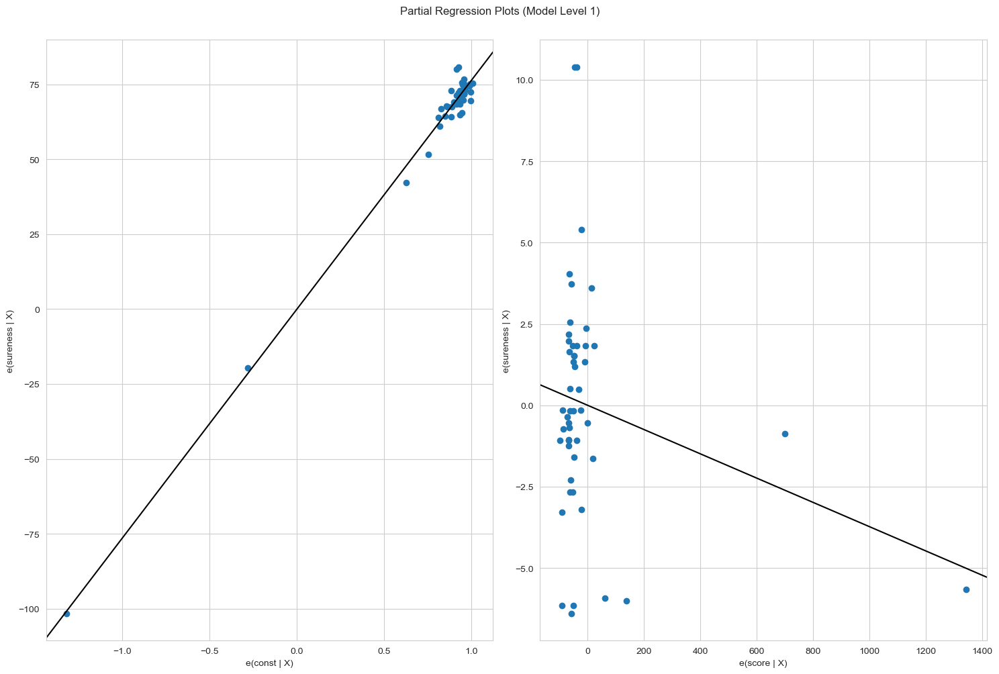

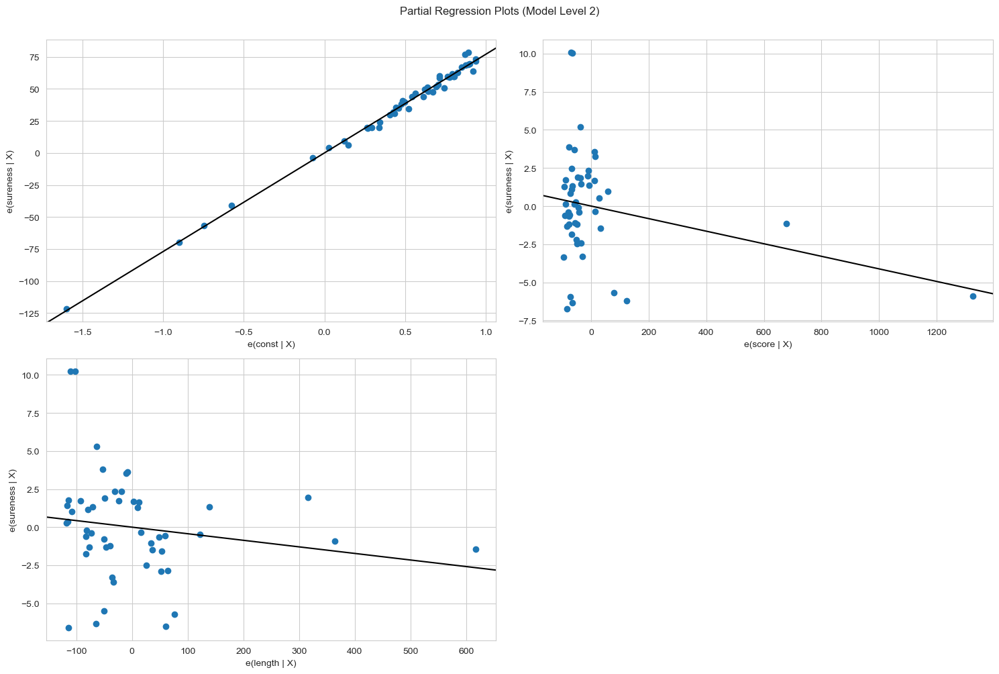

In [35]:
make_plots(fnn_hreg, 'fnn_data/hierarchy3')

# Hierarchy 4

In [36]:
hie4 = {
    1: ['score'],
    2: ['score', 'length_ratio'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie4, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie4, dep_var)

In [37]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.052724,2.671587,0.108697,3653.10304,3856.427643,...,78.702605,"{'const': 75.94995596787473, 'score': 0.009086...","{'const': 1.2084343324020237e-45, 'score': 0.1...",{'score': 0.22961611958534275},{'score': 0.22961611958534356},{'score': 0.22961611958534348},{'score': 5.272356237343075},NaN,NaN,NaN
1,2,"[score, length_ratio]",50.0,47.0,2.0,0.063057,1.581577,0.216399,3613.25167,3856.427643,...,78.702605,"{'const': 77.10483996233658, 'score': 0.008347...","{'const': 2.572074299282582e-36, 'score': 0.14...","{'score': 0.21093986919730234, 'length_ratio':...","{'score': 0.20957540729559296, 'length_ratio':...","{'score': 0.20746752932128854, 'length_ratio':...","{'score': 4.304277572267972, 'length_ratio': 1...",0.010334,0.518374,0.475102


In [38]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1849543367384463
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(0.22961611958534342), 'p-value': np.float64(0.10869660919186991), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.5146742223968265
    p-value: 0.9460127851964387
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.19259758893648282
    p-value: 0.6607634033828238
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.7862675357765974
    p-value: 0.7155559154872408
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [41]
    Passed: False
  Normality (mean of residuals):
    Mean: 3.012

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1849543367384463),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(0.22961611958534342),
    'p-value': np.float64(0.10869660919186991),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.5146742223968265),
   'p-value': np.float64(0.9460127851964387),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.19259758893648282),
   'p-value': np.float64(0.6607634033828238),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.7862675357765974),
   'p-value': np.float64(0.7155559154872408),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype

In [39]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[score],50.0,48.0,1.0,0.056199,2.858190,0.097395,575.730574,610.012807,...,12.449241,"{'const': 76.35763933568613, 'score': -0.00373...","{'const': 6.911821380945499e-65, 'score': 0.09...",{'score': -0.23706370590385575},{'score': -0.23706370700083093},{'score': -0.23706370700083088},{'score': 5.619920117697579},NaN,NaN,NaN
1,2,"[score, length_ratio]",50.0,47.0,2.0,0.088705,2.287483,0.112716,555.901514,610.012807,...,12.449241,"{'const': 77.1722832266727, 'score': -0.004252...","{'const': 3.774794516275212e-55, 'score': 0.06...","{'score': -0.27018766544634026, 'length_ratio'...","{'score': -0.26817640790163916, 'length_ratio'...","{'score': -0.2657400323408676, 'length_ratio':...","{'score': 7.061776478852537, 'length_ratio': 3...",0.032506,1.676495,0.201716


In [40]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1175364144057585
    Passed: True
  Linearity (Pearson r):
    score: {'Pearson r': np.float64(-0.2370637070008309), 'p-value': np.float64(0.09739451040215853), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.1291261916864321
    p-value: 0.3866381842905979
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.21511408762094897
    p-value: 0.6427882257697356
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.5697891169311007
    p-value: 0.907526892015278
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: 1.6484591

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1175364144057585),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'score': {'Pearson r': np.float64(-0.2370637070008309),
    'p-value': np.float64(0.09739451040215853),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.1291261916864321),
   'p-value': np.float64(0.3866381842905979),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.21511408762094897),
   'p-value': np.float64(0.6427882257697356),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.5697891169311007),
   'p-value': np.float64(0.907526892015278),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype=

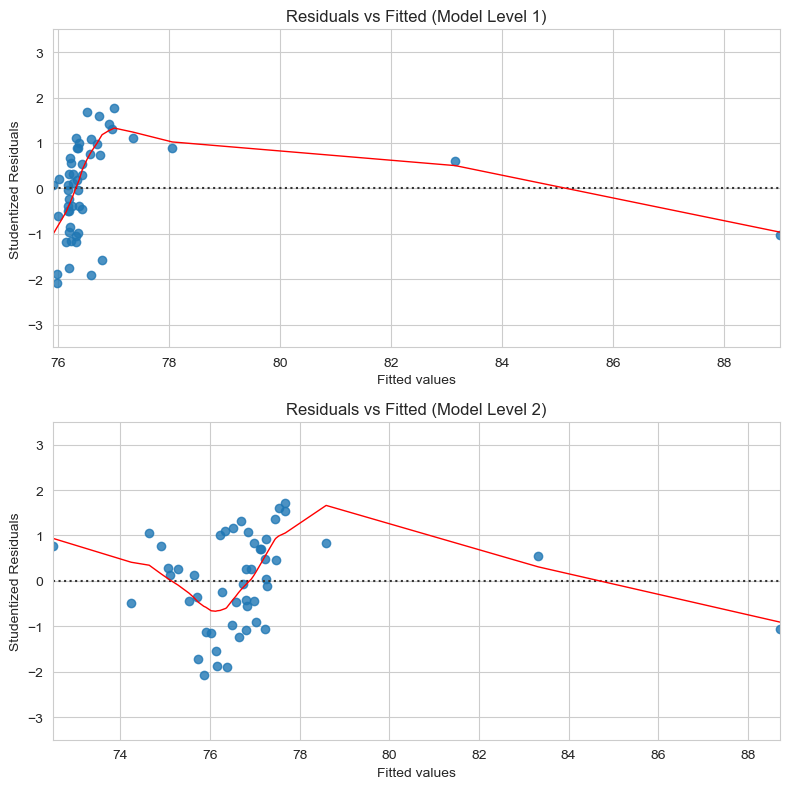

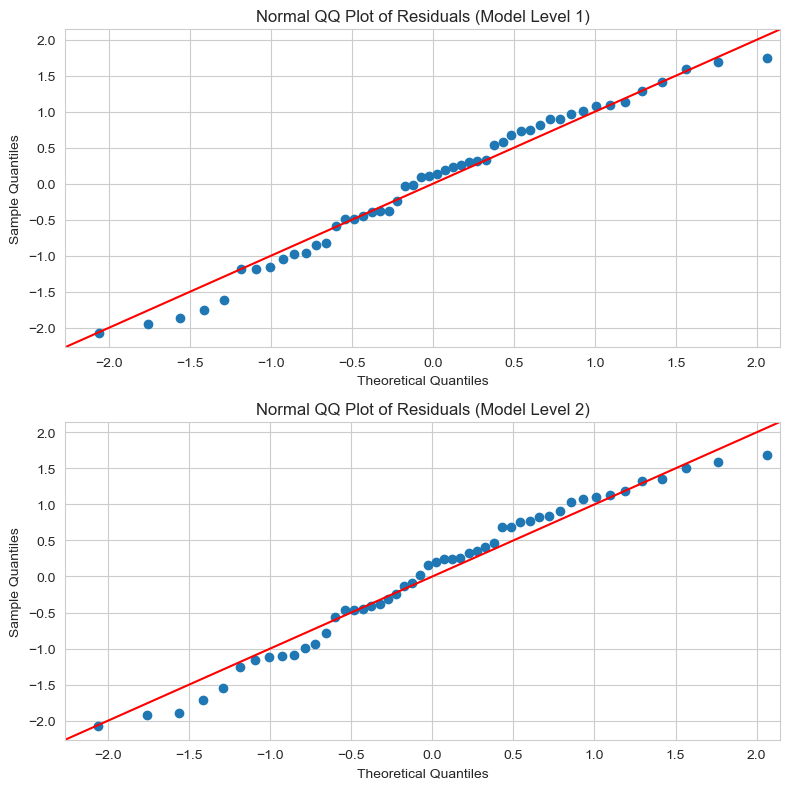

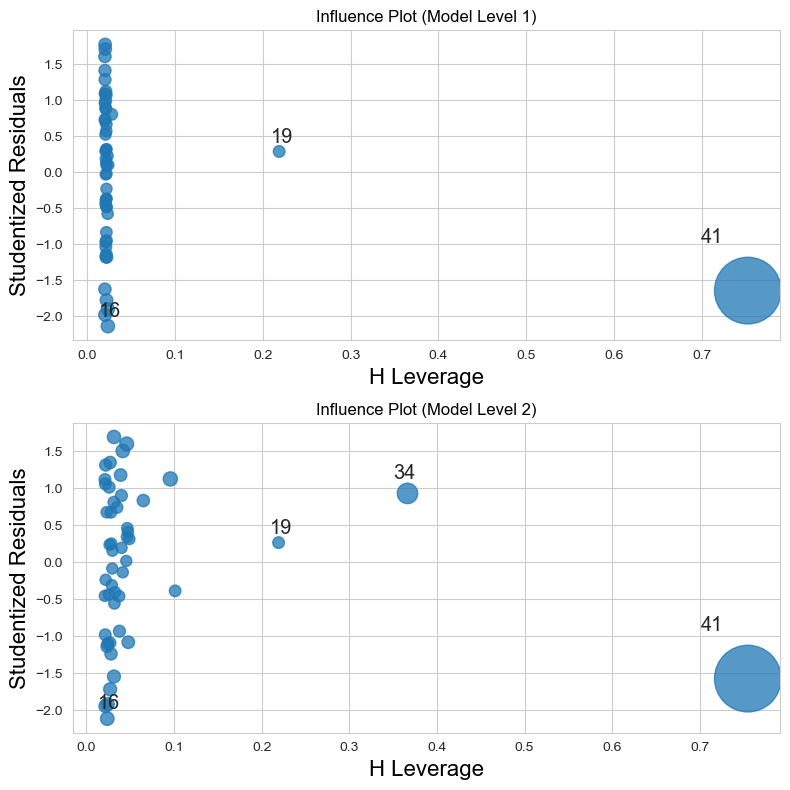

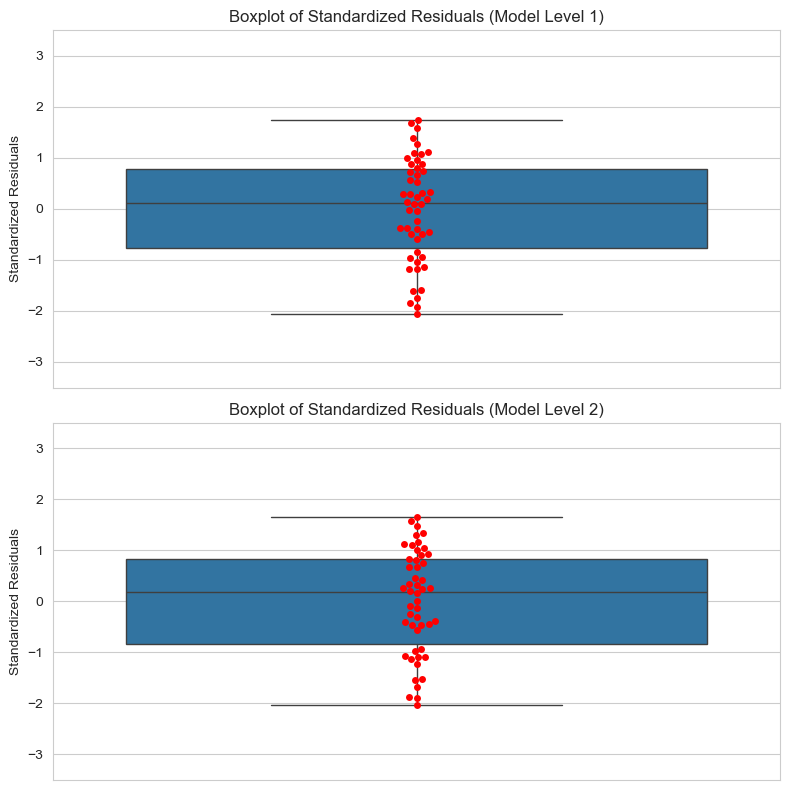

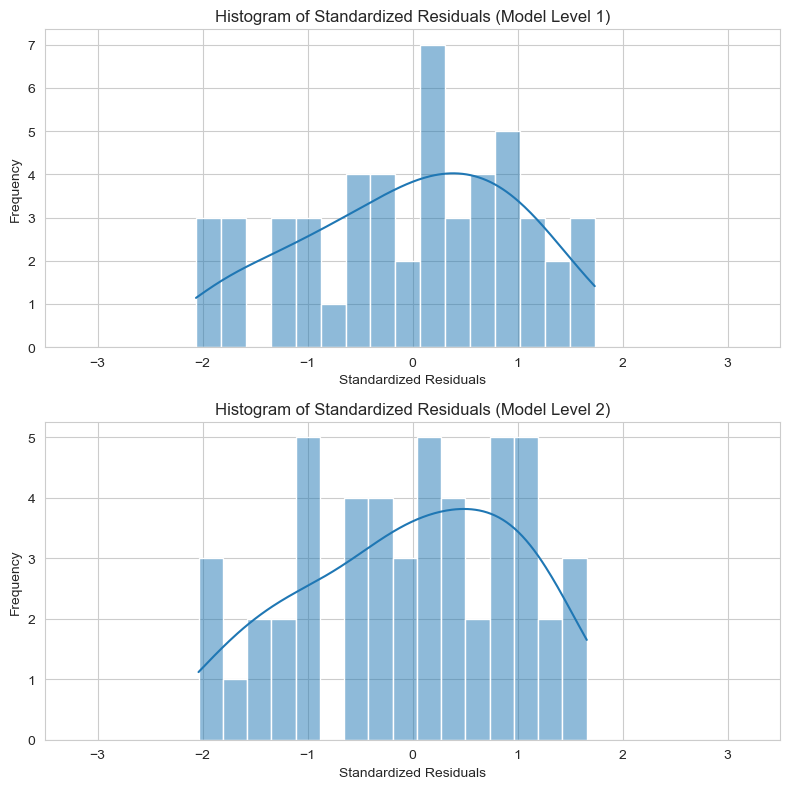

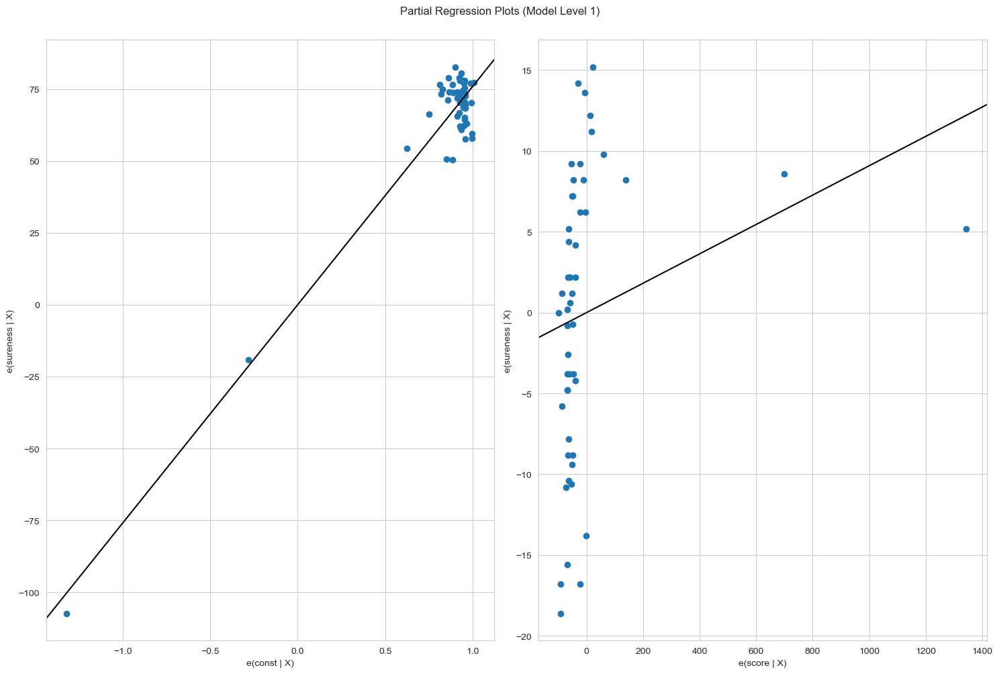

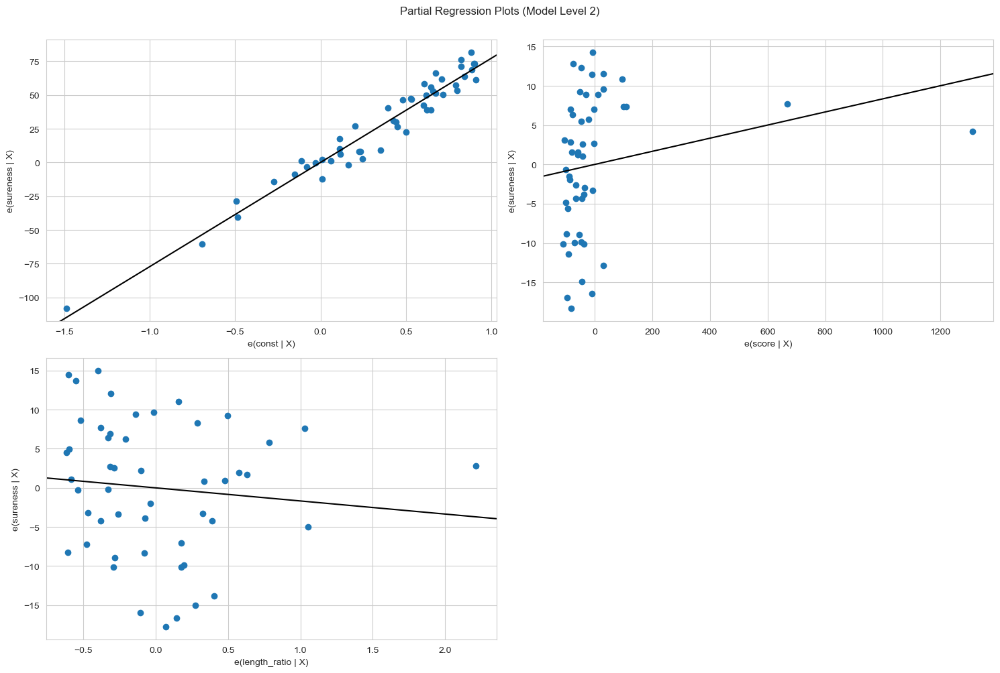

In [41]:
make_plots(full_hreg, 'full_data/hierarchy4')

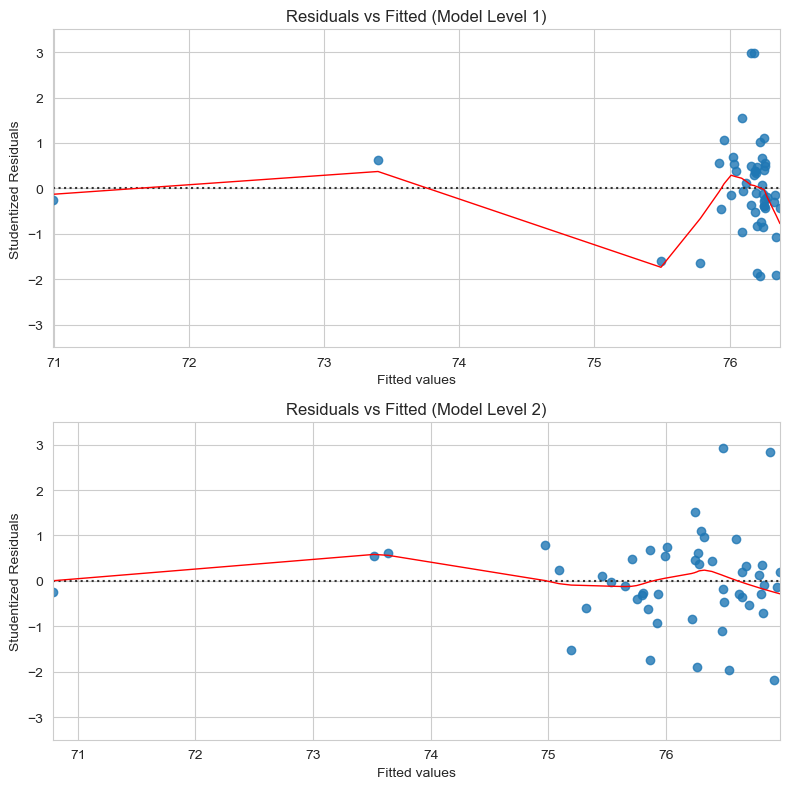

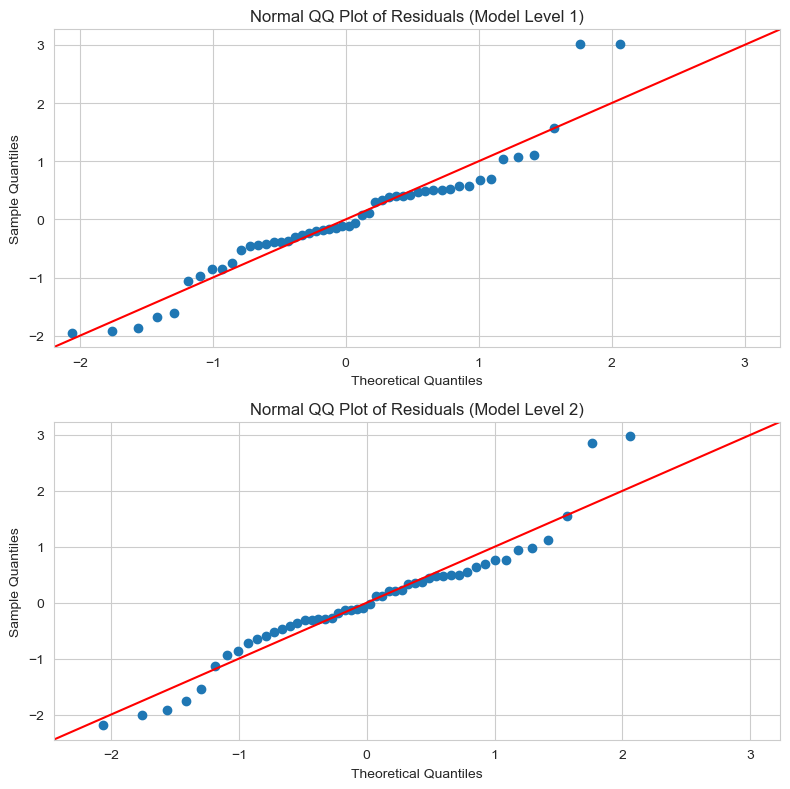

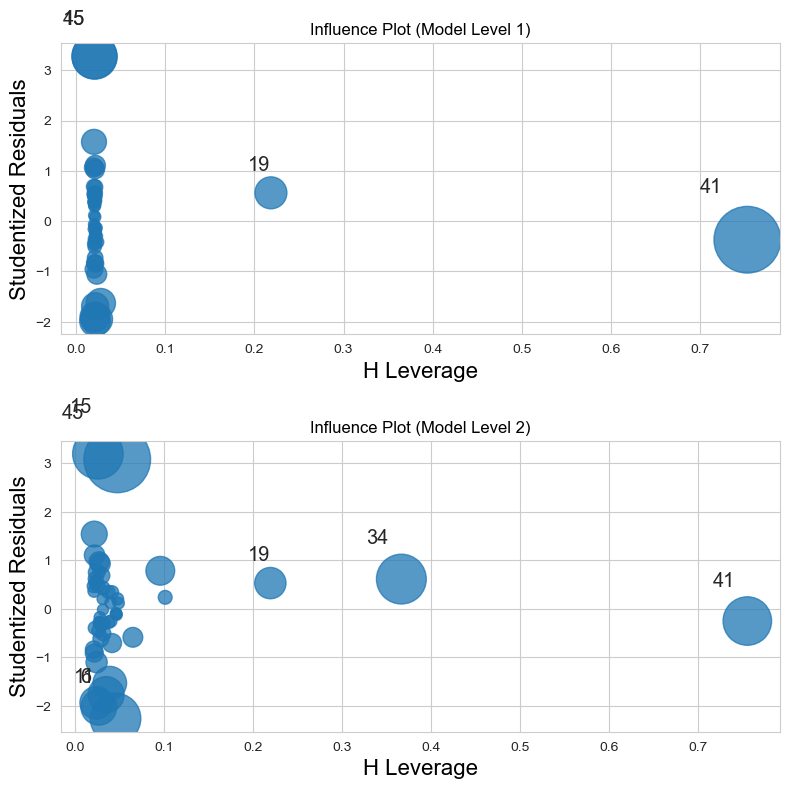

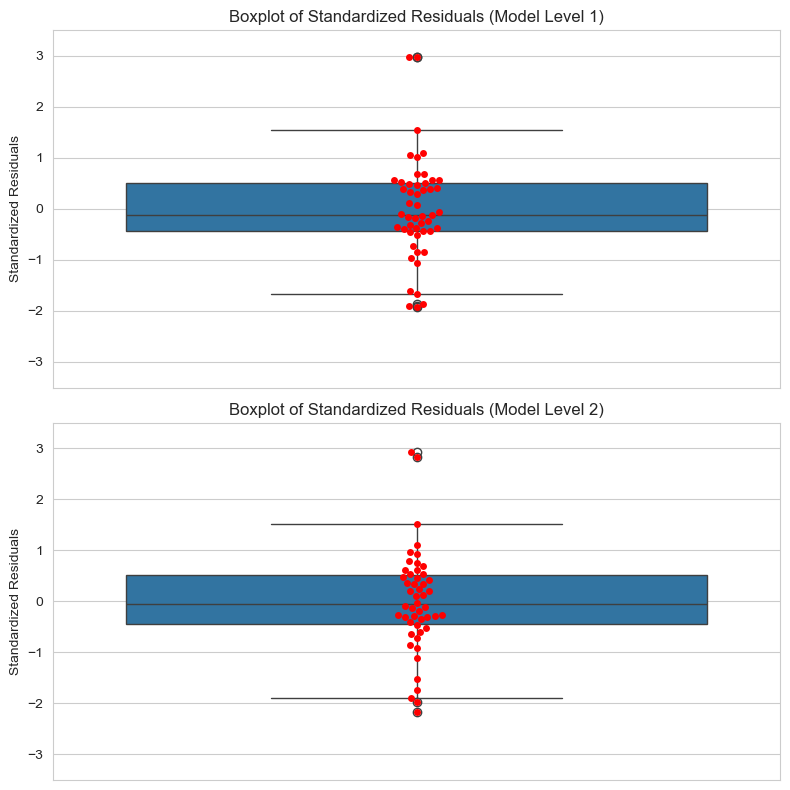

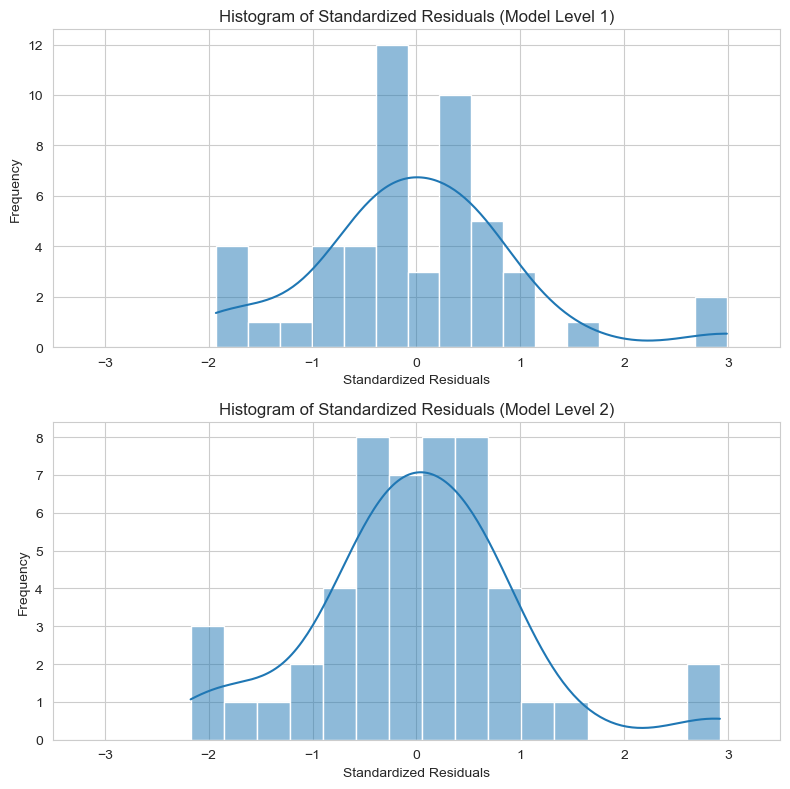

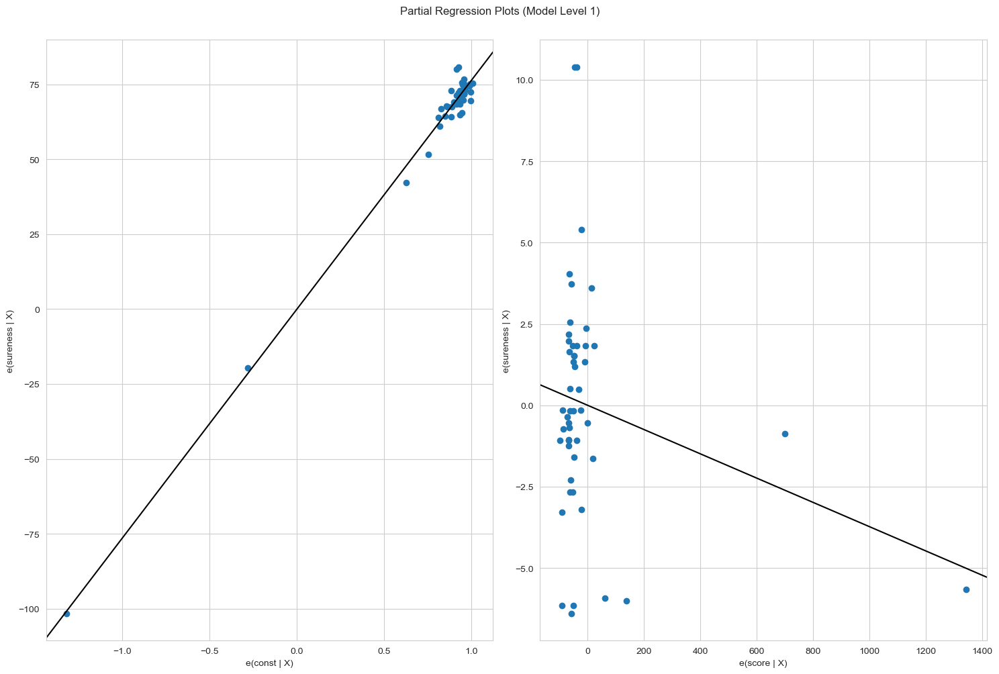

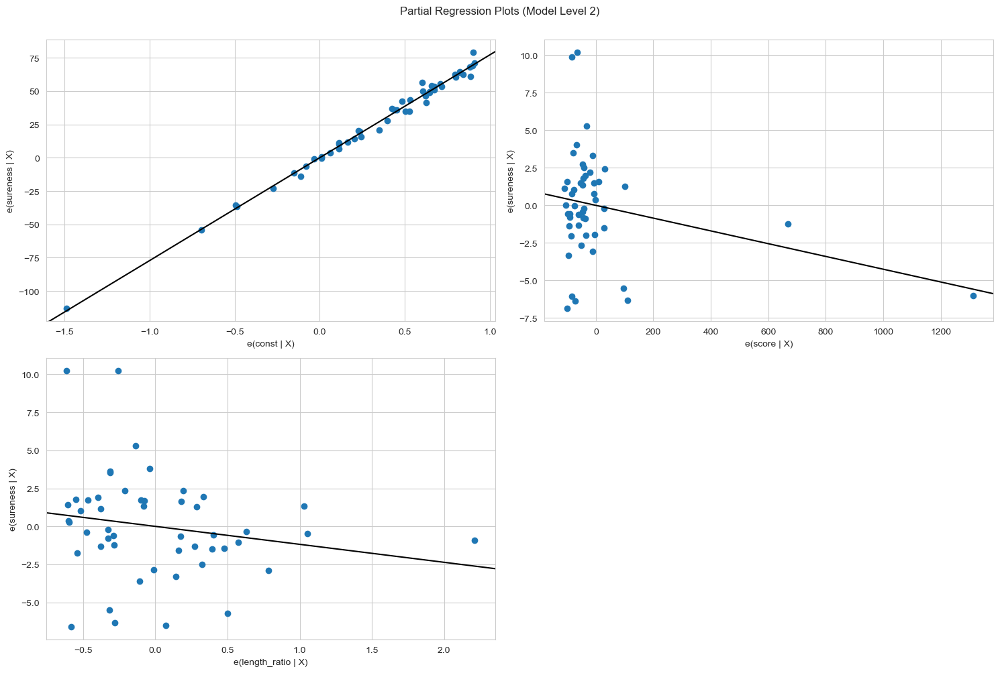

In [42]:
make_plots(fnn_hreg, 'fnn_data/hierarchy4')

# Hierarchy 5

In [43]:
hie5 = {
    1: ['replies'],
    2: ['replies', 'length'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie5, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie5, dep_var)

In [44]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[replies],50.0,48.0,1.0,0.140217,7.828035,0.007383,3315.691269,3856.427643,...,78.702605,"{'const': 78.16542542229799, 'replies': -0.577...","{'const': 2.738907480072571e-47, 'replies': 0....",{'replies': -0.3744554868652137},{'replies': -0.37445548686521446},{'replies': -0.3744554868652144},{'replies': 14.021691164346475},NaN,NaN,NaN
1,2,"[replies, length]",50.0,47.0,2.0,0.140927,3.855065,0.028165,3312.953231,3856.427643,...,78.702605,"{'const': 78.3760150855861, 'replies': -0.5780...","{'const': 4.033563292140247e-41, 'replies': 0....","{'replies': -0.3745768118296888, 'length': -0....","{'replies': -0.3746894803766612, 'length': -0....","{'replies': -0.37457292898310507, 'length': -0...","{'replies': 14.030487912698227, 'length': 0.07...",0.00071,0.038844,0.844608


In [45]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 1.9695082841465266
    Passed: True
  Linearity (Pearson r):
    replies: {'Pearson r': np.float64(-0.37445548686521446), 'p-value': np.float64(0.007382690860991534), 'Passed': np.True_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.7303666922672848
    p-value: 0.7784072337380437
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.15362222825992533
    p-value: 0.6950975844812206
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6431708578417119
    p-value: 0.8514597581242098
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [13]
    Passed: False
  Normality (mean of residuals):
    Mean: -2

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(1.9695082841465266),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'replies': {'Pearson r': np.float64(-0.37445548686521446),
    'p-value': np.float64(0.007382690860991534),
    'Passed': np.True_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.7303666922672848),
   'p-value': np.float64(0.7784072337380437),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.15362222825992533),
   'p-value': np.float64(0.6950975844812206),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6431708578417119),
   'p-value': np.float64(0.8514597581242098),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dt

In [46]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[replies],50.0,48.0,1.0,0.038906,1.943094,0.169753,586.279553,610.012807,...,12.449241,"{'const': 76.29356850524404, 'replies': -0.121...","{'const': 9.74140416497124e-65, 'replies': 0.1...",{'replies': -0.19724643730937957},{'replies': -0.1972464382221101},{'replies': -0.1972464382221102},{'replies': 3.8906157391308733},NaN,NaN,NaN
1,2,"[replies, length]",50.0,47.0,2.0,0.054648,1.358460,0.266963,576.676941,610.012807,...,12.449241,"{'const': 76.6879458890027, 'replies': -0.1214...","{'const': 2.3969796715742614e-58, 'replies': 0...","{'replies': -0.19781771628248832, 'length': -0...","{'replies': -0.19936849185243685, 'length': -0...","{'replies': -0.19781566662819777, 'length': -0...","{'replies': 3.9131037963558275, 'length': 1.57...",0.015742,0.782627,0.380843


In [47]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.0220669591336065
    Passed: True
  Linearity (Pearson r):
    replies: {'Pearson r': np.float64(-0.19724643822211005), 'p-value': np.float64(0.16975301110039703), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.5326445277000438
    p-value: 0.15347880533882796
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.8238272779189815
    p-value: 0.36406353088741716
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6393245538769332
    p-value: 0.8546921309236483
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: -2.2

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.0220669591336065),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'replies': {'Pearson r': np.float64(-0.19724643822211005),
    'p-value': np.float64(0.16975301110039703),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.5326445277000438),
   'p-value': np.float64(0.15347880533882796),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.8238272779189815),
   'p-value': np.float64(0.36406353088741716),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6393245538769332),
   'p-value': np.float64(0.8546921309236483),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], d

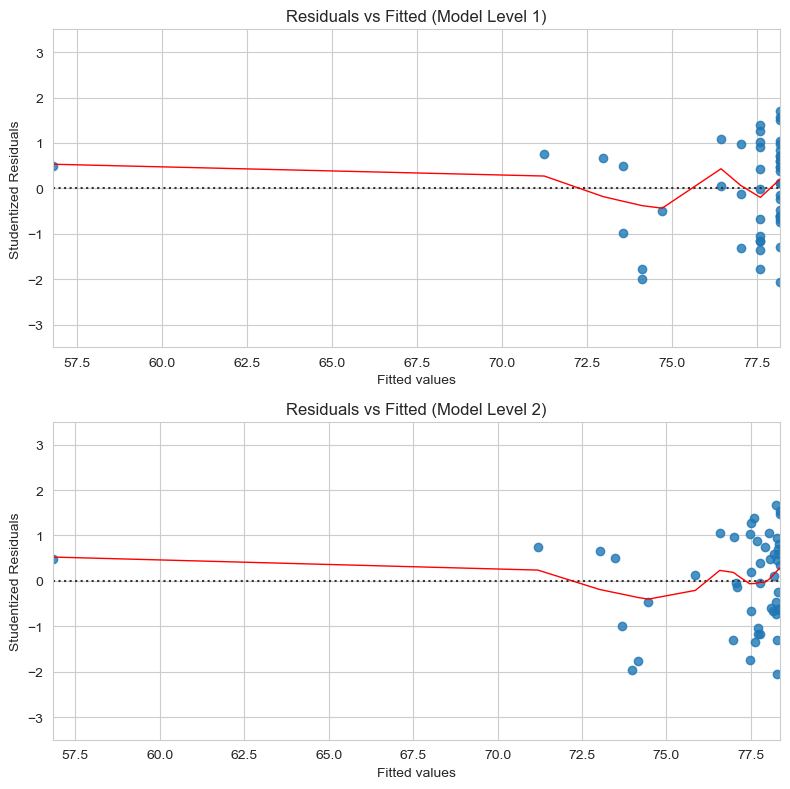

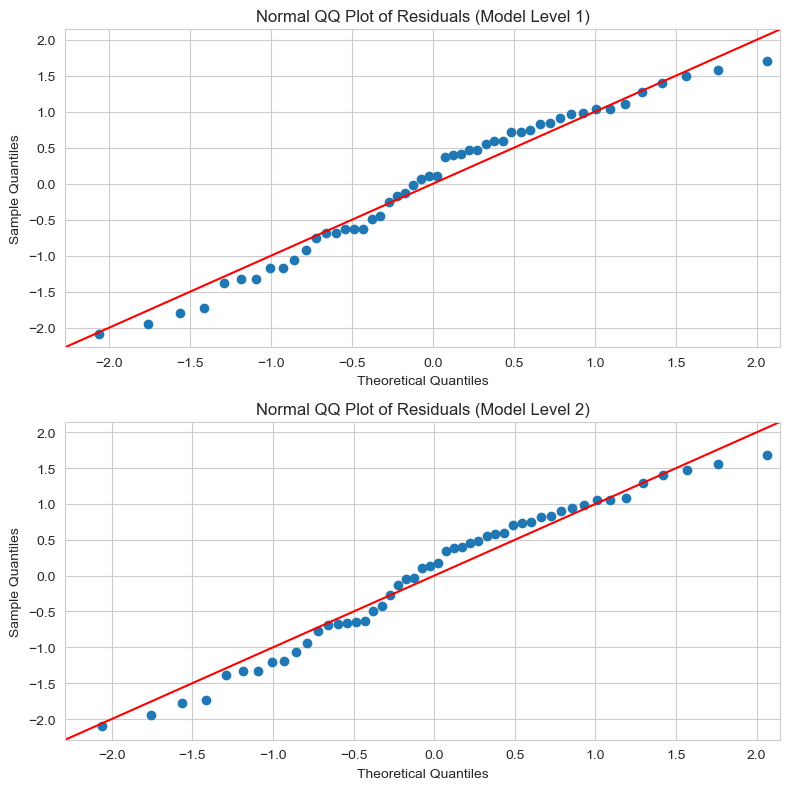

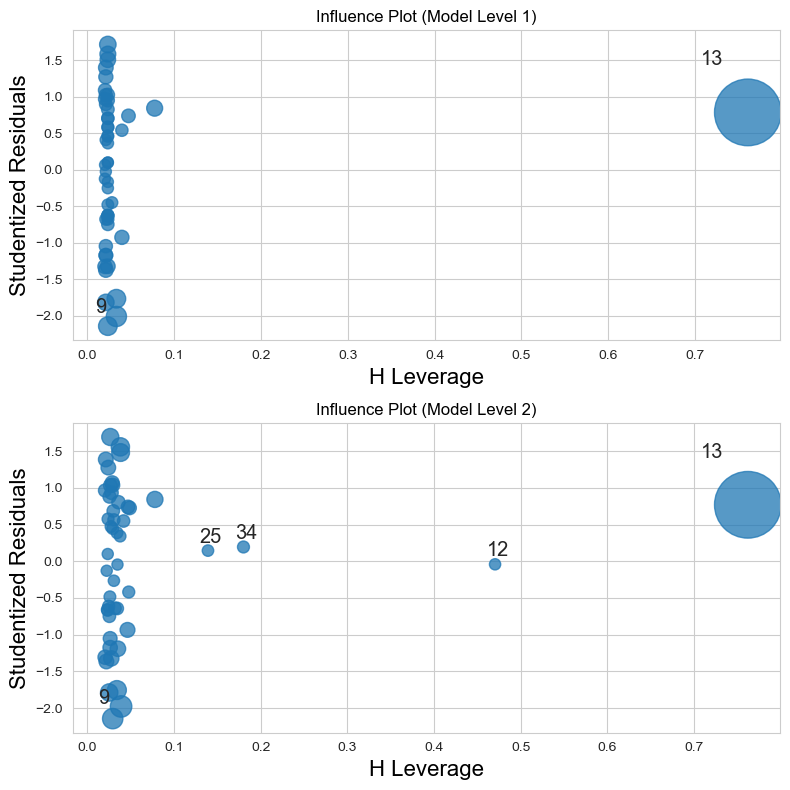

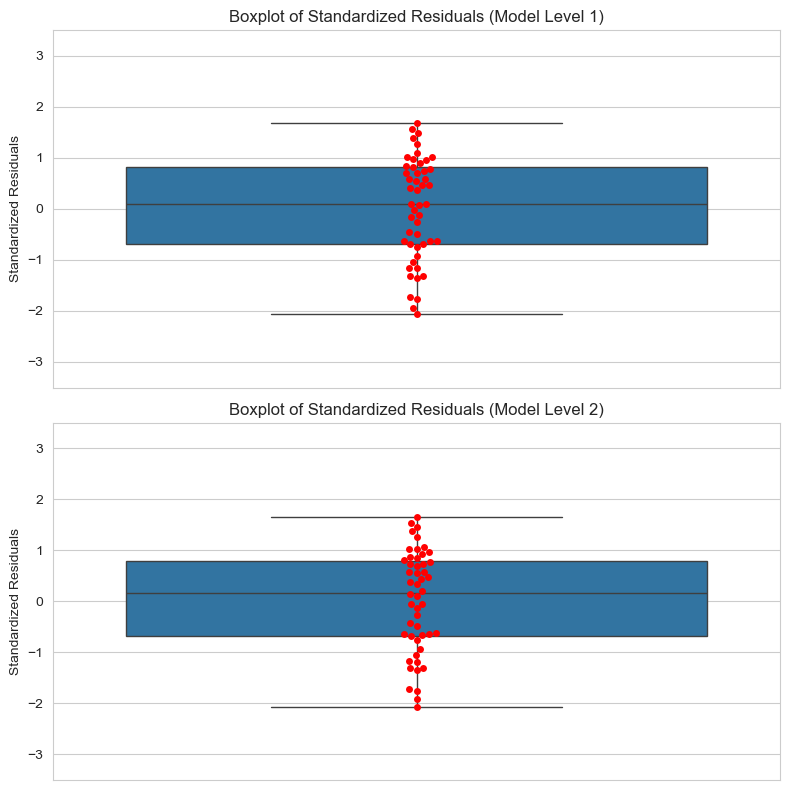

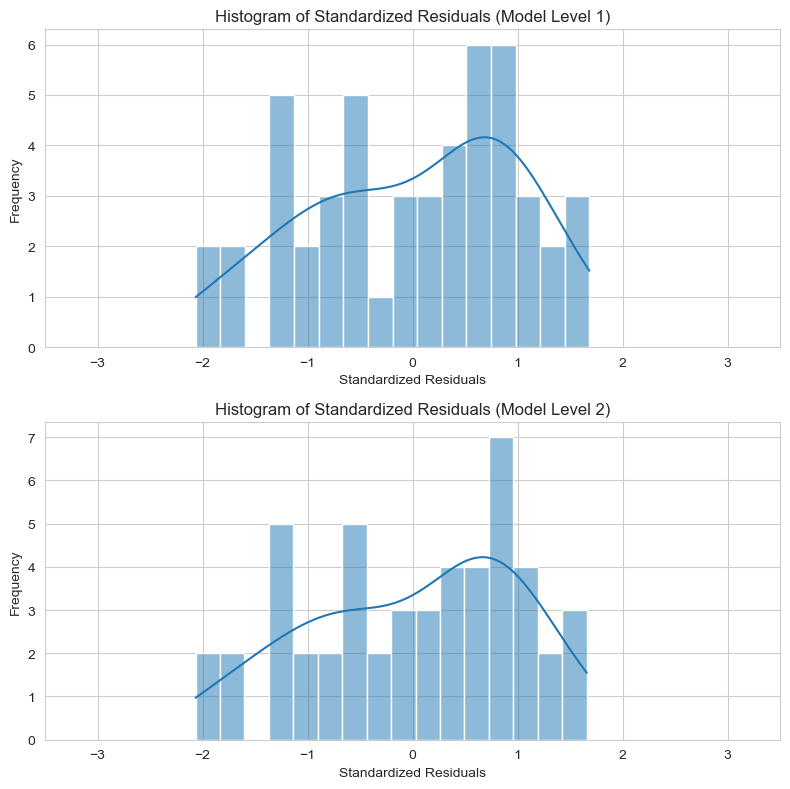

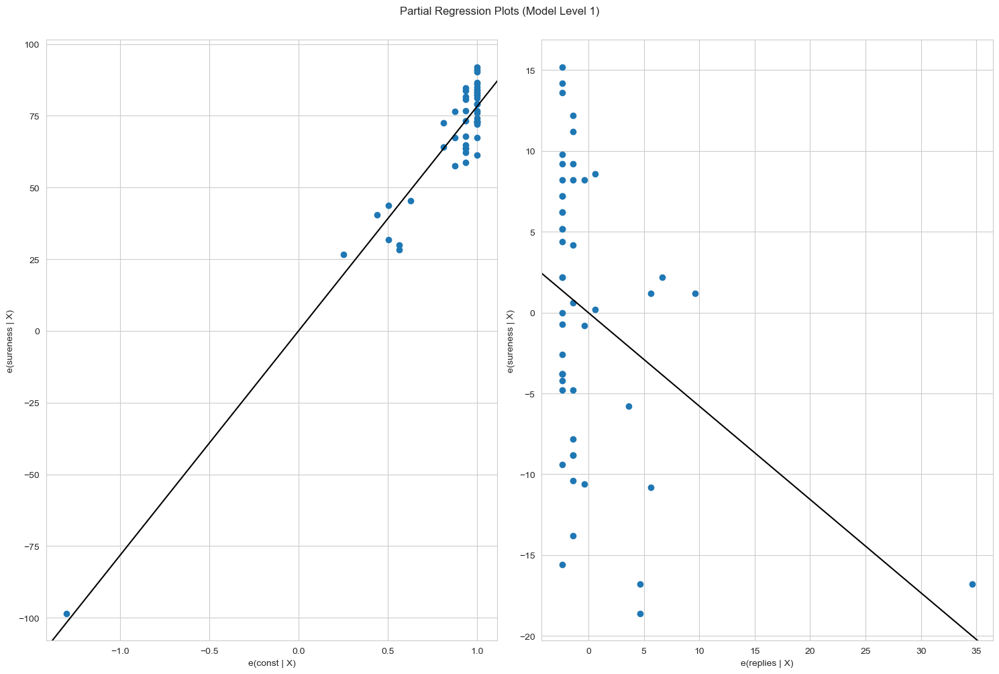

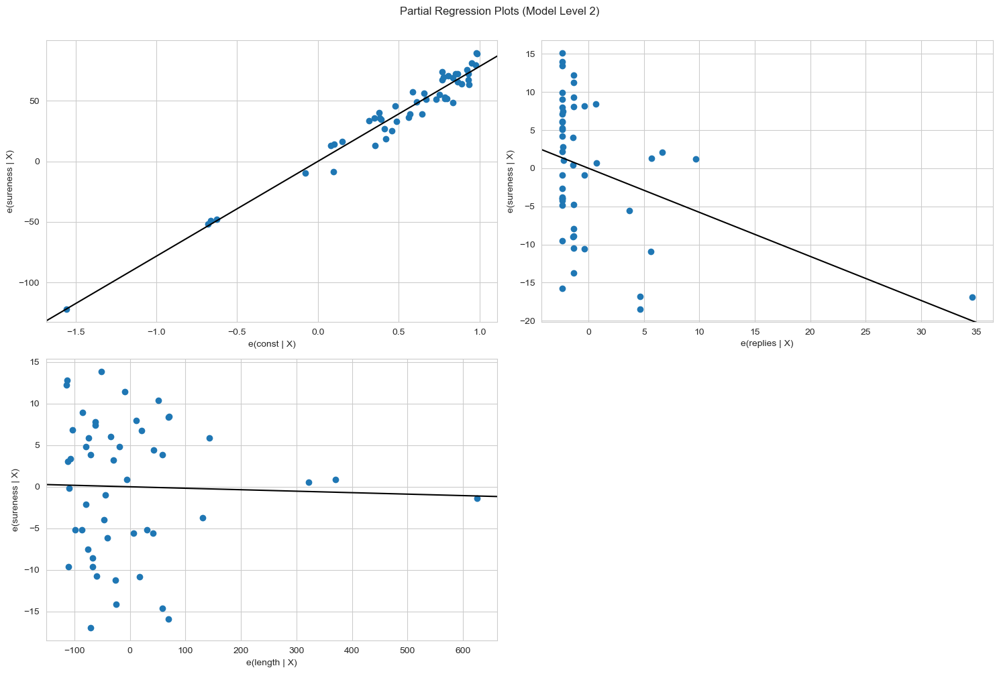

In [48]:
make_plots(full_hreg, 'full_data/hierarchy5')

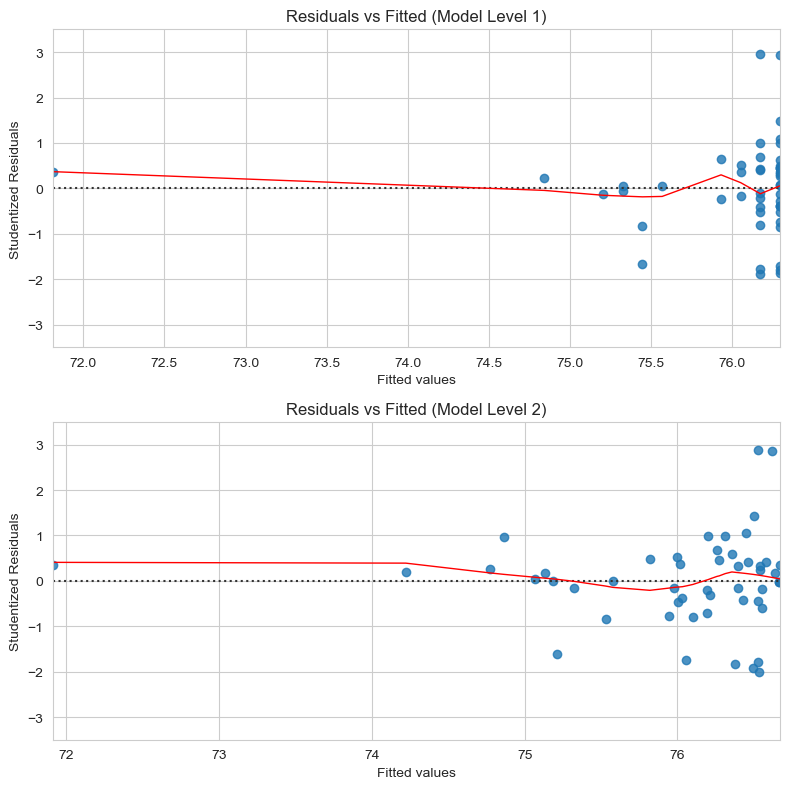

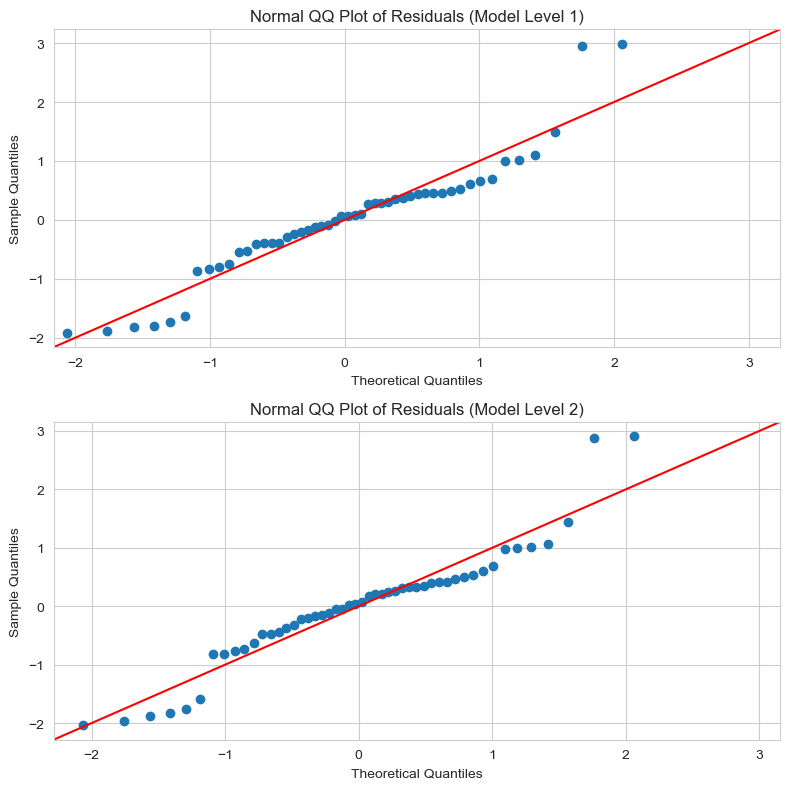

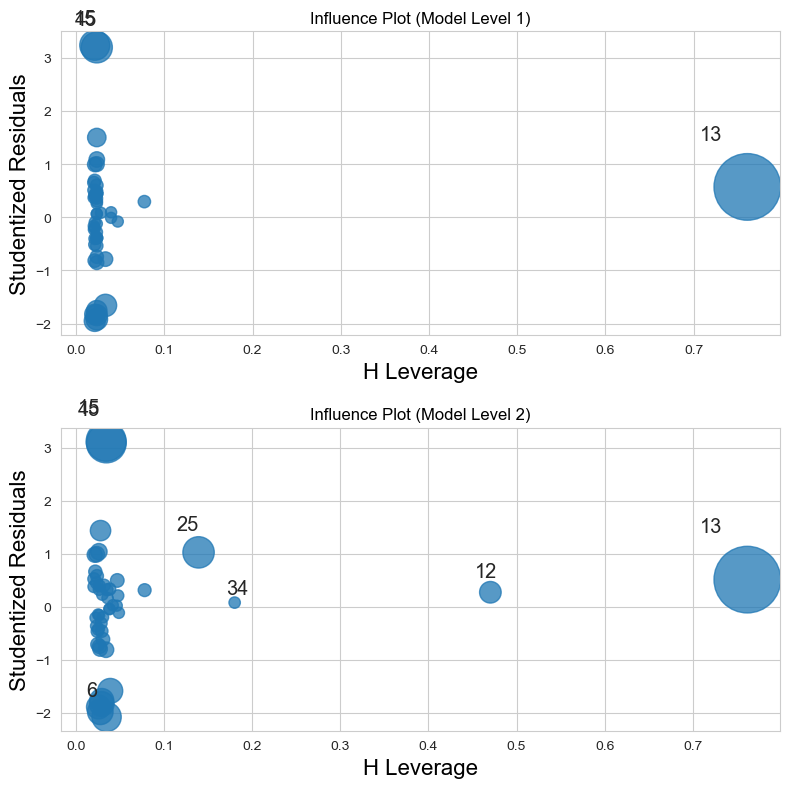

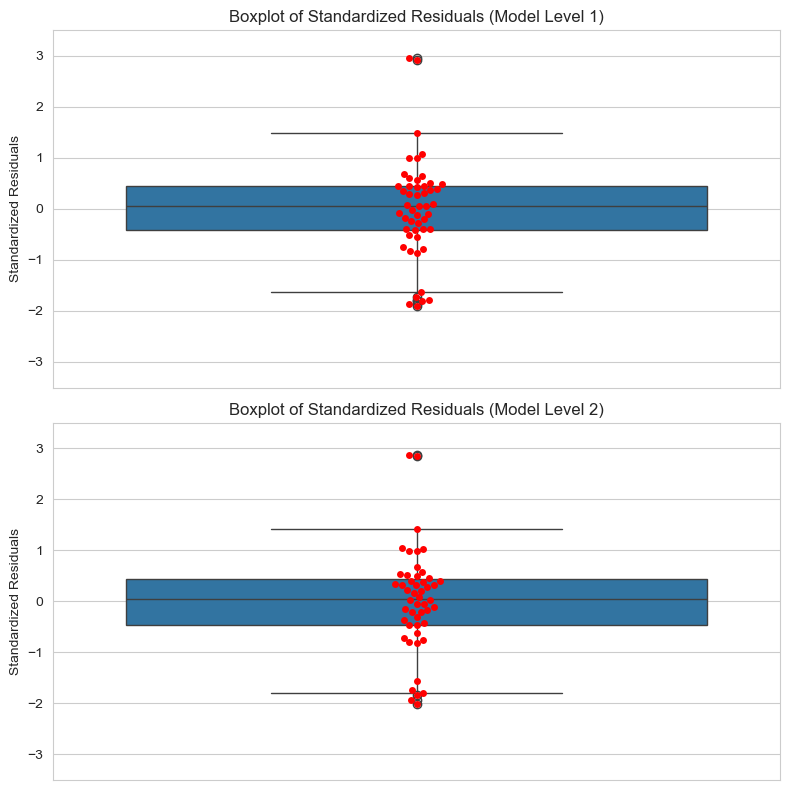

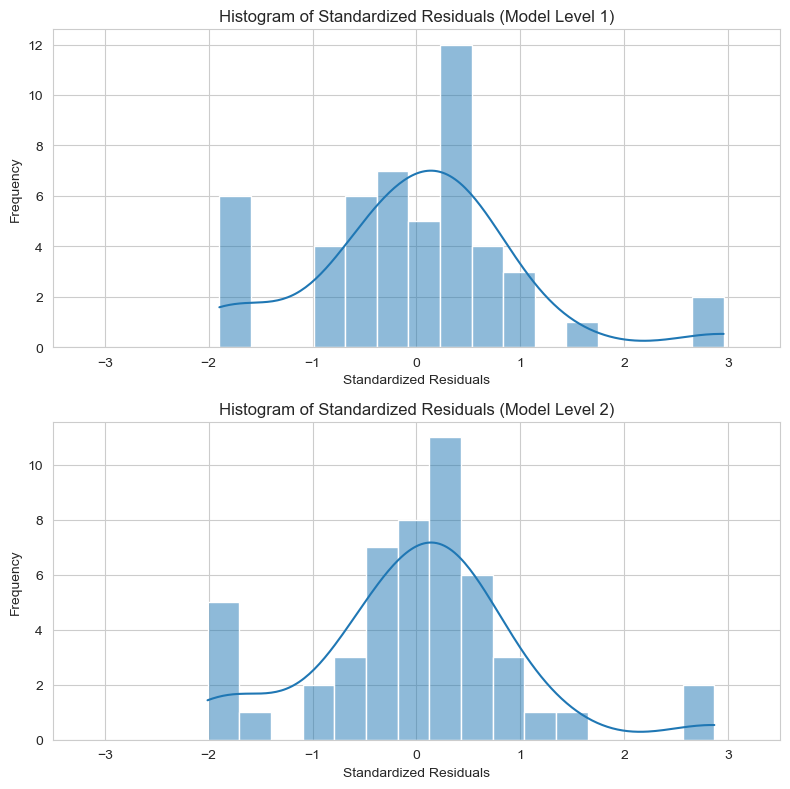

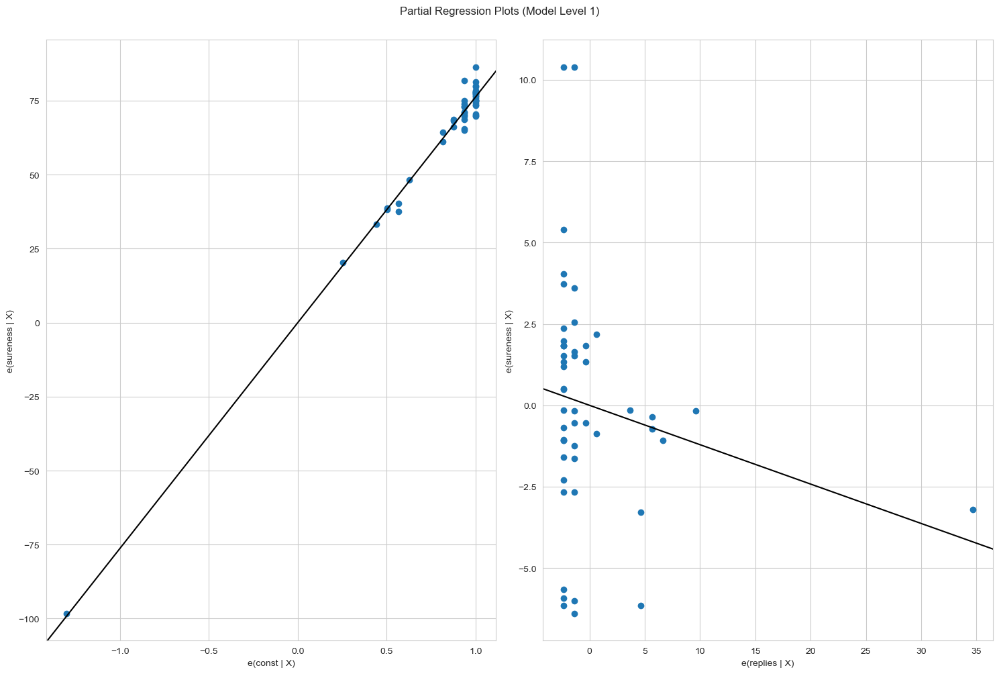

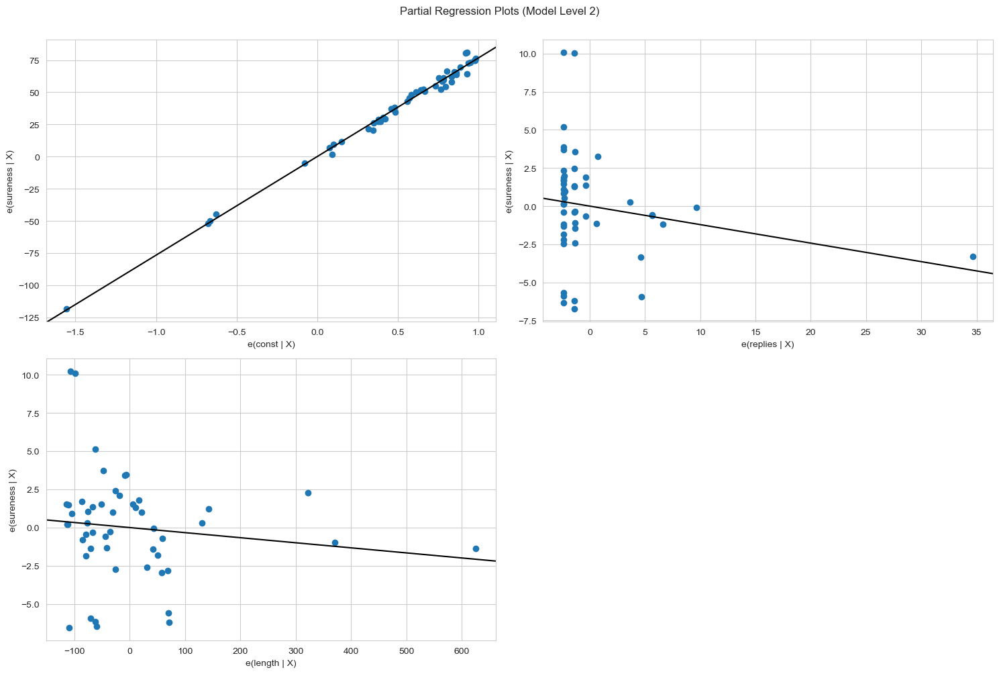

In [49]:
make_plots(fnn_hreg, 'fnn_data/hierarchy5')

# Hierarchy 6

In [50]:
hie6 = {
    1: ['replies'],
    2: ['replies', 'length_ratio'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie6, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie6, dep_var)

In [51]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[replies],50.0,48.0,1.0,0.140217,7.828035,0.007383,3315.691269,3856.427643,...,78.702605,"{'const': 78.16542542229799, 'replies': -0.577...","{'const': 2.738907480072571e-47, 'replies': 0....",{'replies': -0.3744554868652137},{'replies': -0.37445548686521446},{'replies': -0.3744554868652144},{'replies': 14.021691164346475},NaN,NaN,NaN
1,2,"[replies, length_ratio]",50.0,47.0,2.0,0.149342,4.125660,0.022348,3280.502587,3856.427643,...,78.702605,"{'const': 79.13292286355338, 'replies': -0.559...","{'const': 4.371499394987271e-39, 'replies': 0....","{'replies': -0.36244988564690045, 'length_rati...","{'replies': -0.3632744711369187, 'length_ratio...","{'replies': -0.3596207110597326, 'length_ratio...","{'replies': 12.932705582310767, 'length_ratio'...",0.009125,0.504151,0.48119


In [52]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 1.9695082841465266
    Passed: True
  Linearity (Pearson r):
    replies: {'Pearson r': np.float64(-0.37445548686521446), 'p-value': np.float64(0.007382690860991534), 'Passed': np.True_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.7303666922672848
    p-value: 0.7784072337380437
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.15362222825992533
    p-value: 0.6950975844812206
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6431708578417119
    p-value: 0.8514597581242098
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [13]
    Passed: False
  Normality (mean of residuals):
    Mean: -2

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(1.9695082841465266),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'replies': {'Pearson r': np.float64(-0.37445548686521446),
    'p-value': np.float64(0.007382690860991534),
    'Passed': np.True_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.7303666922672848),
   'p-value': np.float64(0.7784072337380437),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.15362222825992533),
   'p-value': np.float64(0.6950975844812206),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6431708578417119),
   'p-value': np.float64(0.8514597581242098),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dt

In [53]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[replies],50.0,48.0,1.0,0.038906,1.943094,0.169753,586.279553,610.012807,...,12.449241,"{'const': 76.29356850524404, 'replies': -0.121...","{'const': 9.74140416497124e-65, 'replies': 0.1...",{'replies': -0.19724643730937957},{'replies': -0.1972464382221101},{'replies': -0.1972464382221102},{'replies': 3.8906157391308733},NaN,NaN,NaN
1,2,"[replies, length_ratio]",50.0,47.0,2.0,0.051173,1.267431,0.291000,578.796450,610.012807,...,12.449241,"{'const': 76.73972701344844, 'replies': -0.112...","{'const': 5.914074187274022e-56, 'replies': 0....","{'replies': -0.18332620820853232, 'length_rati...","{'replies': -0.18356288384872355, 'length_rati...","{'replies': -0.18189521991223812, 'length_rati...","{'replies': 3.308587102692147, 'length_ratio':...",0.012267,0.60765,0.439582


In [54]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.0220669591336065
    Passed: True
  Linearity (Pearson r):
    replies: {'Pearson r': np.float64(-0.19724643822211005), 'p-value': np.float64(0.16975301110039703), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.5326445277000438
    p-value: 0.15347880533882796
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.8238272779189815
    p-value: 0.36406353088741716
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6393245538769332
    p-value: 0.8546921309236483
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: -2.2

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.0220669591336065),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'replies': {'Pearson r': np.float64(-0.19724643822211005),
    'p-value': np.float64(0.16975301110039703),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.5326445277000438),
   'p-value': np.float64(0.15347880533882796),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.8238272779189815),
   'p-value': np.float64(0.36406353088741716),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6393245538769332),
   'p-value': np.float64(0.8546921309236483),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], d

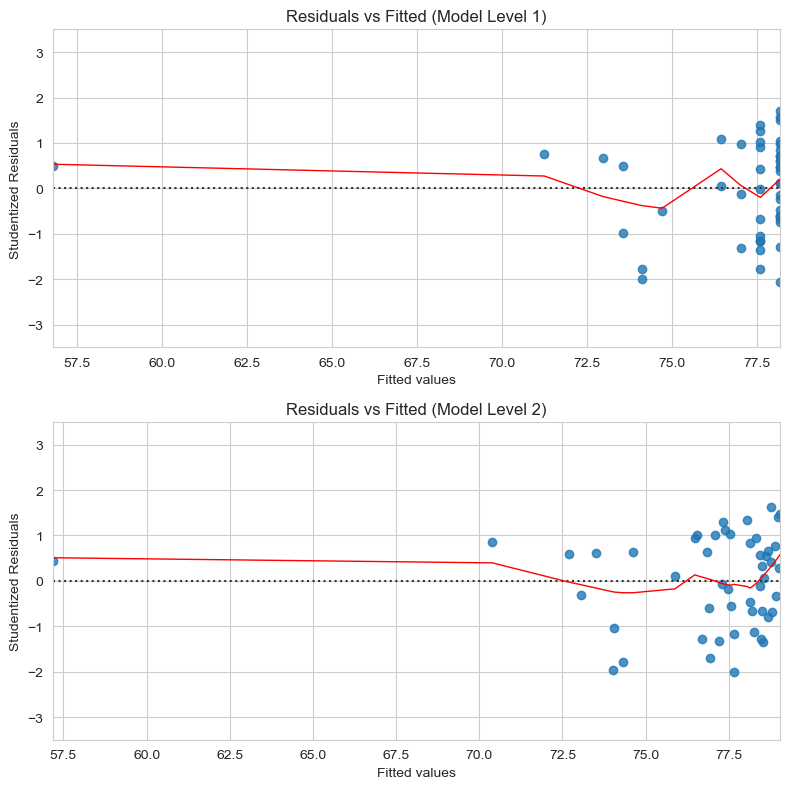

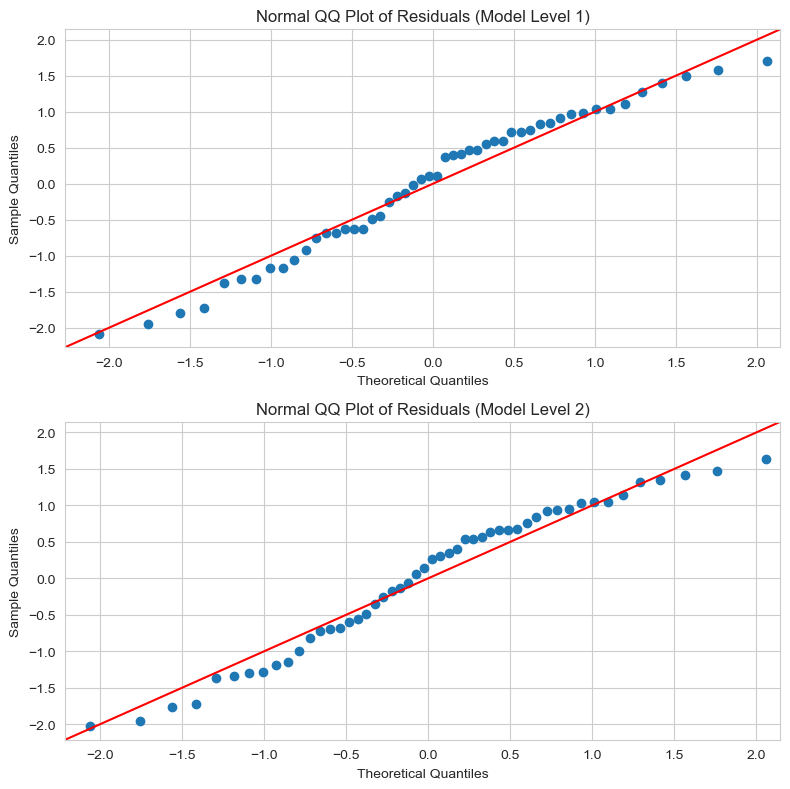

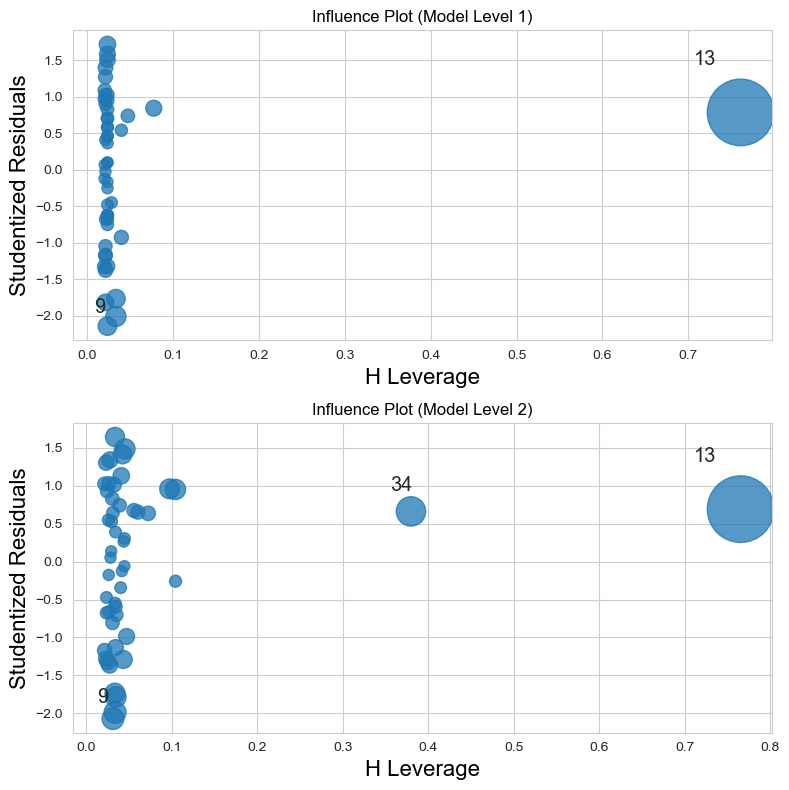

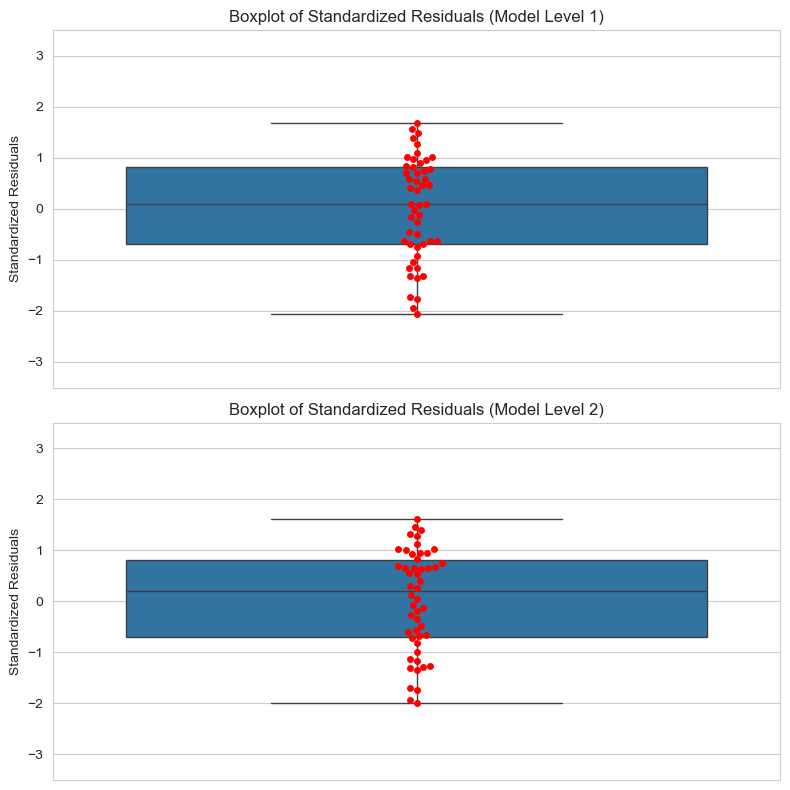

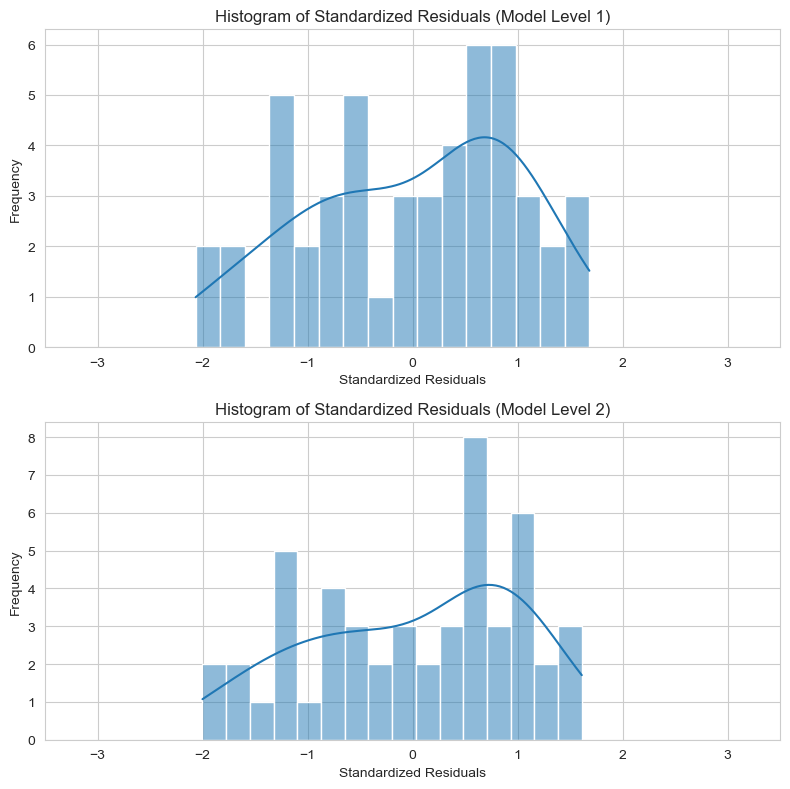

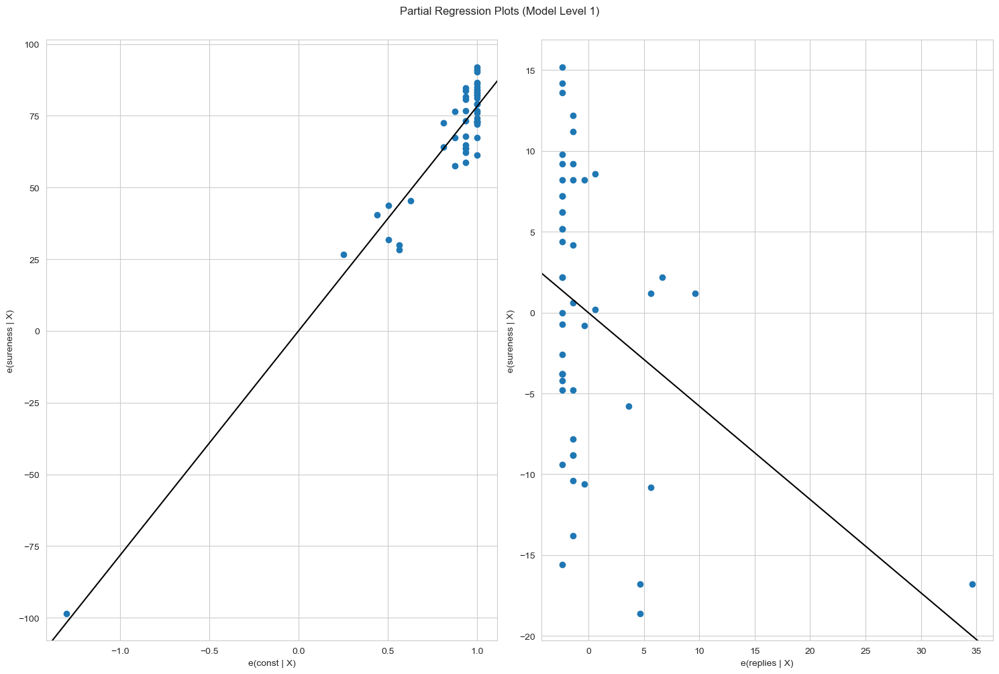

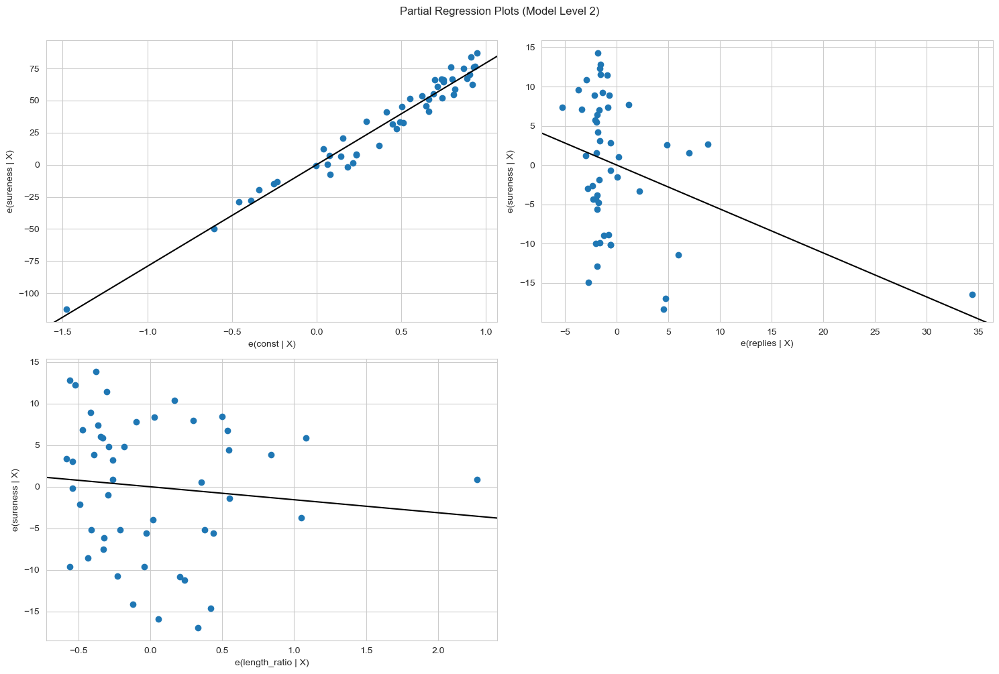

In [55]:
make_plots(full_hreg, 'full_data/hierarchy6')

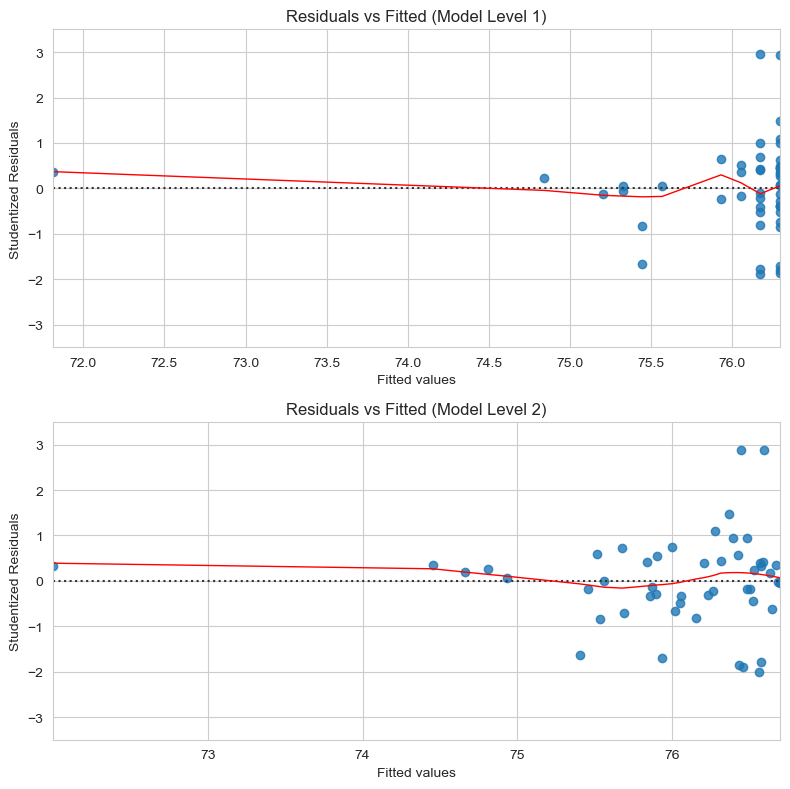

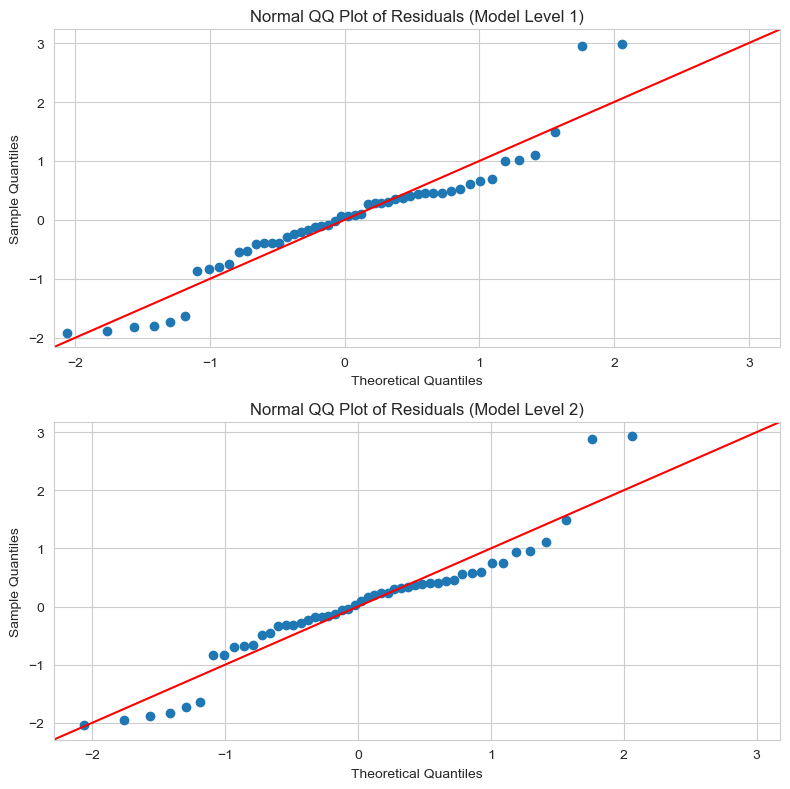

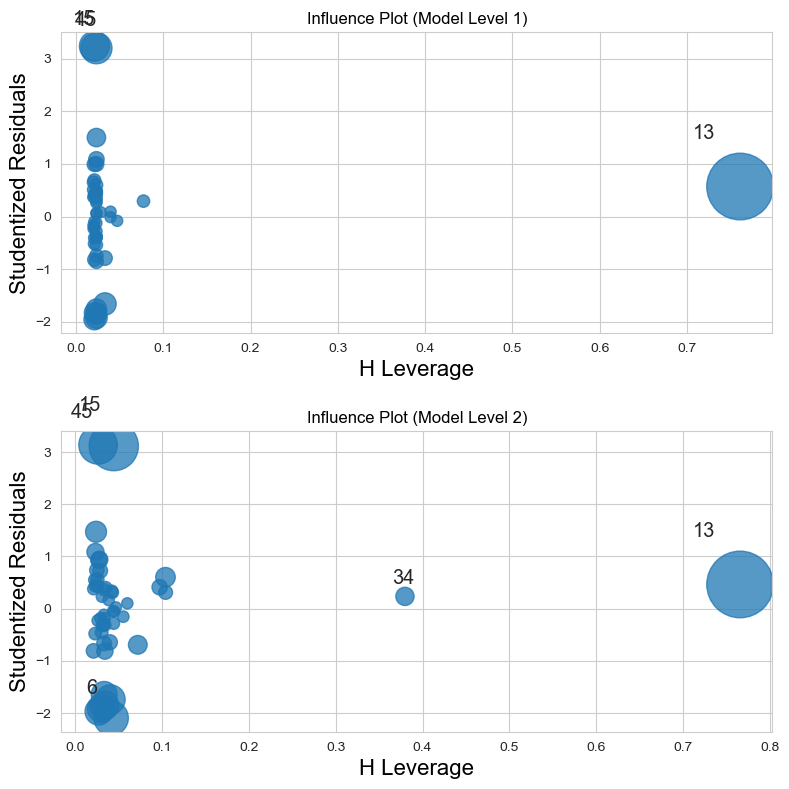

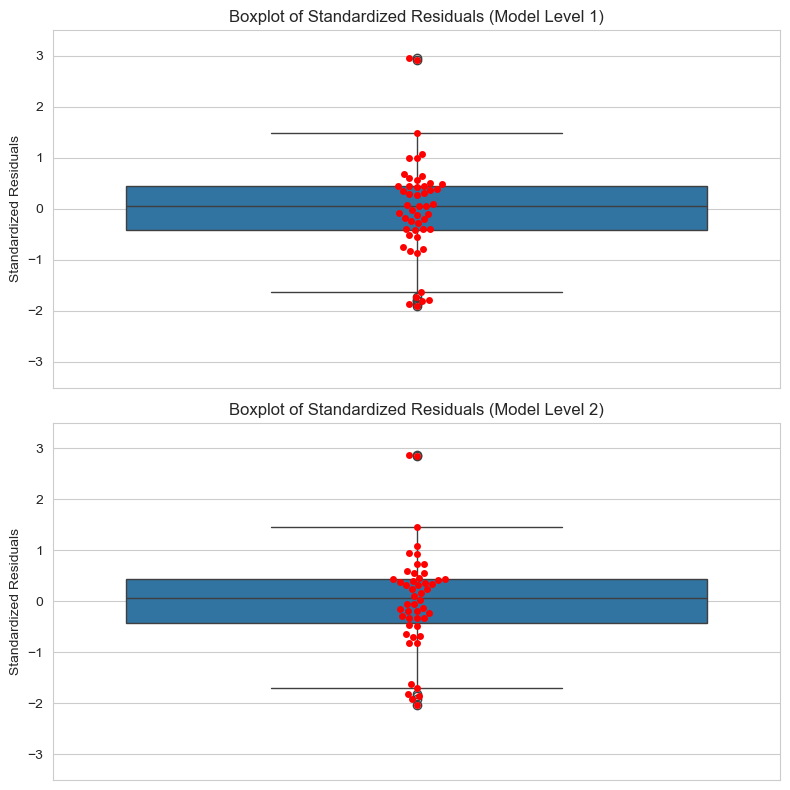

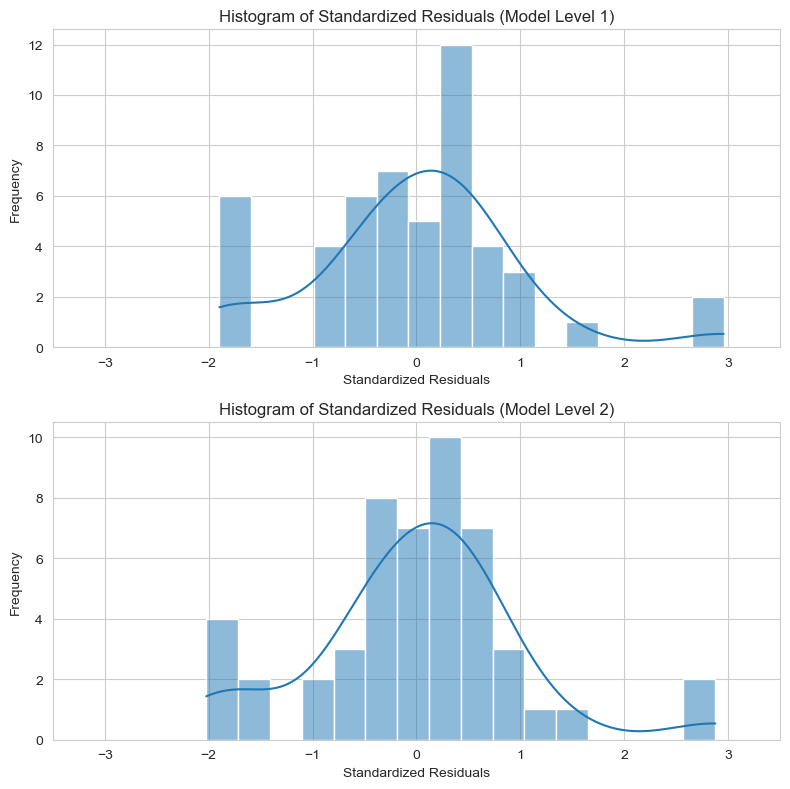

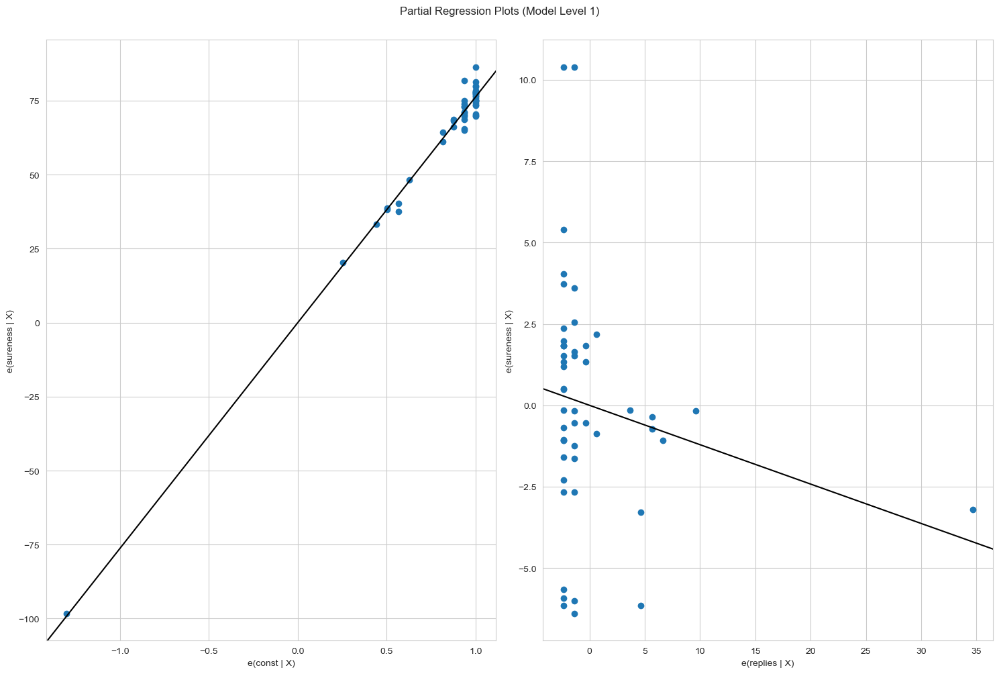

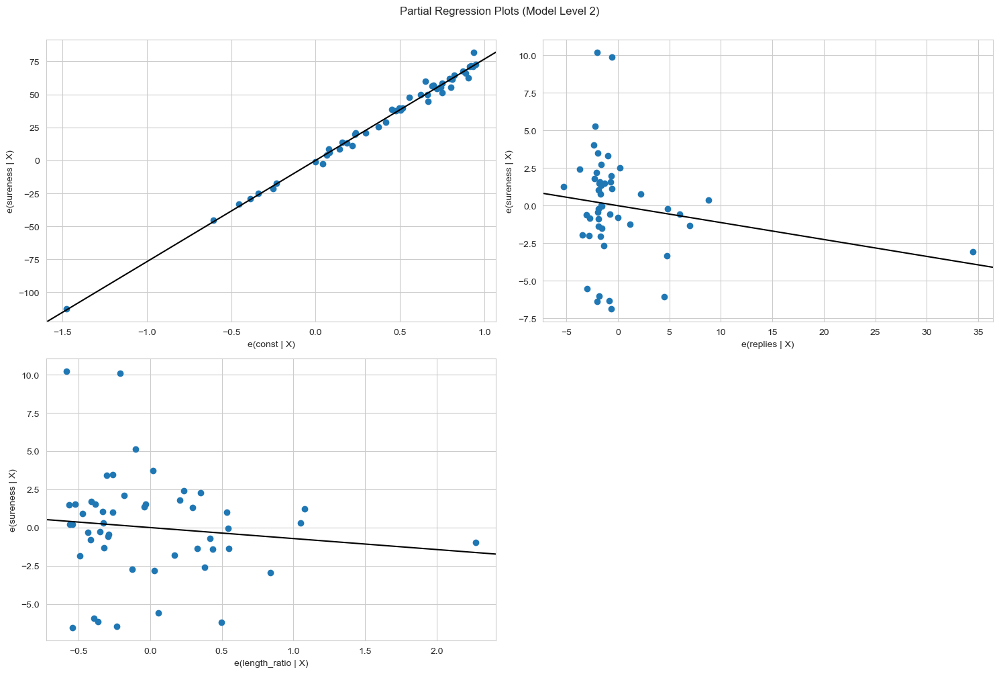

In [56]:
make_plots(fnn_hreg, 'fnn_data/hierarchy6')

# Hierarchy 7

In [57]:
hie7 = {
    1: ['length'],
    2: ['length', 'length_ratio'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie7, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie7, dep_var)

In [58]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[length],50.0,48.0,1.0,0.000622,0.029876,0.863499,3854.028846,3856.427643,...,78.702605,"{'const': 76.99844492456654, 'length': -0.0016...","{'const': 5.263011922722104e-41, 'length': 0.8...",{'length': -0.024940445529868727},{'length': -0.024940445529867548},{'length': -0.02494044552986754},{'length': 0.06220258232282898},NaN,NaN,NaN
1,2,"[length, length_ratio]",50.0,47.0,2.0,0.031590,0.766589,0.470316,3734.601898,3856.427643,...,78.702605,"{'const': 78.22370462398588, 'length': 0.01016...","{'const': 7.7334755320864e-38, 'length': 0.457...","{'length': 0.15301241928307735, 'length_ratio'...","{'length': 0.10868388178168482, 'length_ratio'...","{'length': 0.10759075561995733, 'length_ratio'...","{'length': 1.157577069487338, 'length_ratio': ...",0.030968,1.502989,0.226319


In [59]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.161584707891944
    Passed: True
  Linearity (Pearson r):
    length: {'Pearson r': np.float64(-0.02494044552986753), 'p-value': np.float64(0.8634990821495262), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.5300045927847817
    p-value: 0.9379089977591554
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 1.2643463591968274
    p-value: 0.26082998470230845
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.7064269320472142
    p-value: 0.7945517448359447
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: 1.790567

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.161584707891944),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'length': {'Pearson r': np.float64(-0.02494044552986753),
    'p-value': np.float64(0.8634990821495262),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.5300045927847817),
   'p-value': np.float64(0.9379089977591554),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(1.2643463591968274),
   'p-value': np.float64(0.26082998470230845),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.7064269320472142),
   'p-value': np.float64(0.7945517448359447),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype

In [60]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[length],50.0,48.0,1.0,0.015517,0.756544,0.388741,600.547376,610.012807,...,12.449241,"{'const': 76.39860160524938, 'length': -0.0032...","{'const': 5.089433125469073e-60, 'length': 0.3...",{'length': -0.12456634516334003},{'length': -0.12456634573974891},{'length': -0.12456634573974883},{'length': 1.5516774490954641},NaN,NaN,NaN
1,2,"[length, length_ratio]",50.0,47.0,2.0,0.019781,0.474240,0.625304,597.946008,610.012807,...,12.449241,"{'const': 76.57943468725863, 'length': -0.0015...","{'const': 7.3983185660698135e-56, 'length': 0....","{'length': -0.058530789869201426, 'length_rati...","{'length': -0.04153328177604402, 'length_ratio...","{'length': -0.04115595301148356, 'length_ratio...","{'length': 0.16938124682834427, 'length_ratio'...",0.004264,0.204474,0.653214


In [61]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.1671434866548487
    Passed: True
  Linearity (Pearson r):
    length: {'Pearson r': np.float64(-0.12456634573974885), 'p-value': np.float64(0.3887410631712801), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.3034527849935604
    p-value: 0.26301827810696
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 1.8132119805122304
    p-value: 0.17812340247840933
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6637724913897588
    p-value: 0.8336653490682392
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: 1.6200374

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.1671434866548487),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'length': {'Pearson r': np.float64(-0.12456634573974885),
    'p-value': np.float64(0.3887410631712801),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.3034527849935604),
   'p-value': np.float64(0.26301827810696),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(1.8132119805122304),
   'p-value': np.float64(0.17812340247840933),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6637724913897588),
   'p-value': np.float64(0.8336653490682392),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dtype=

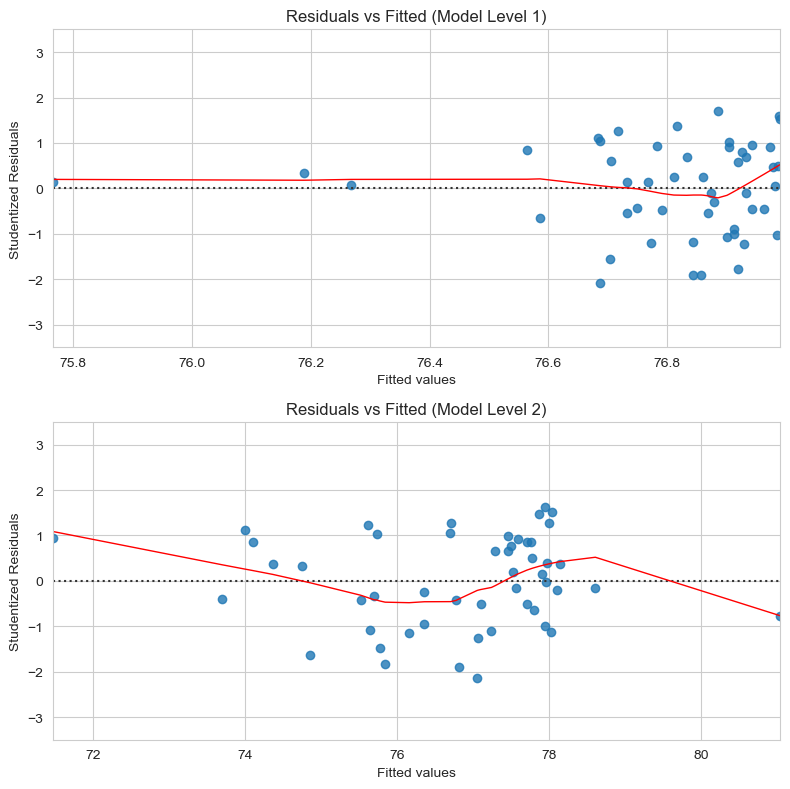

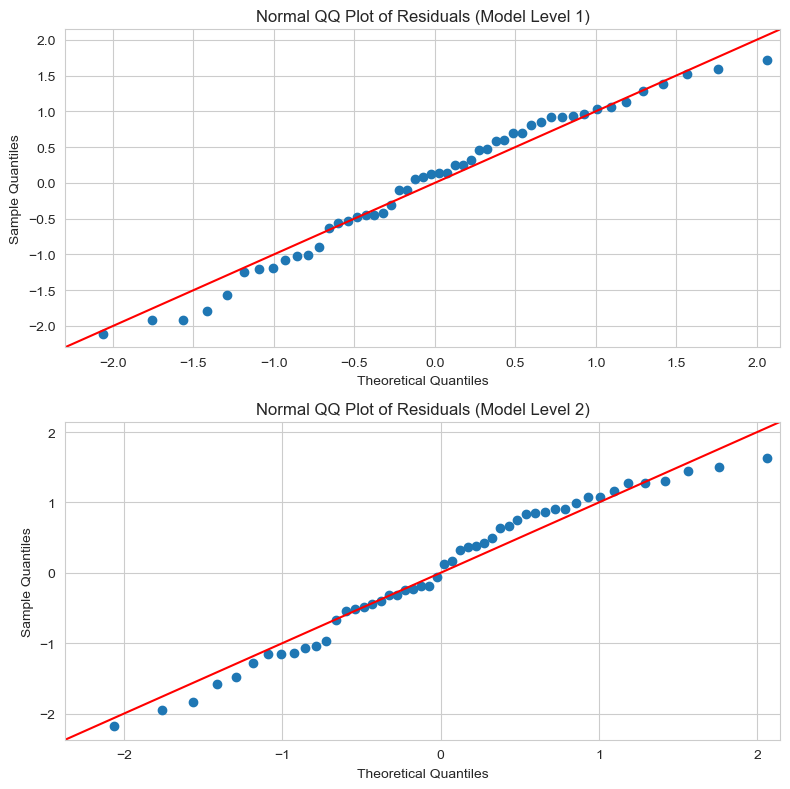

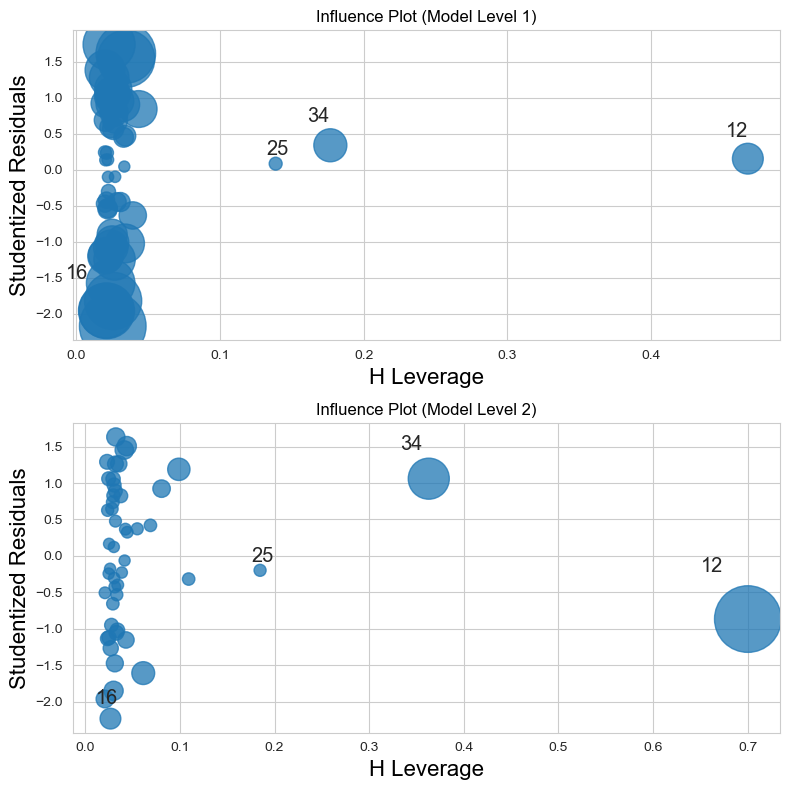

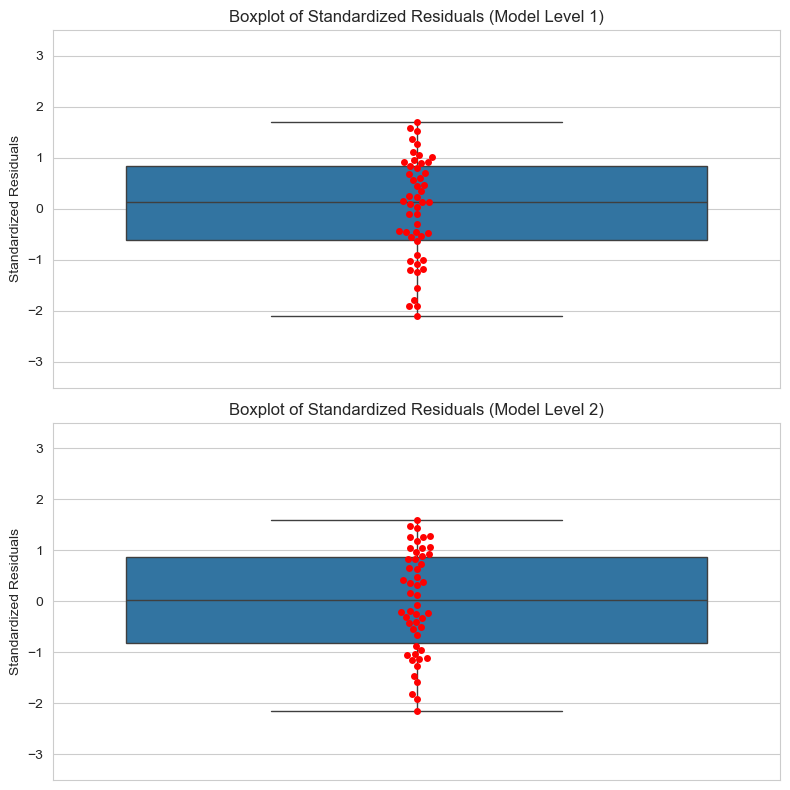

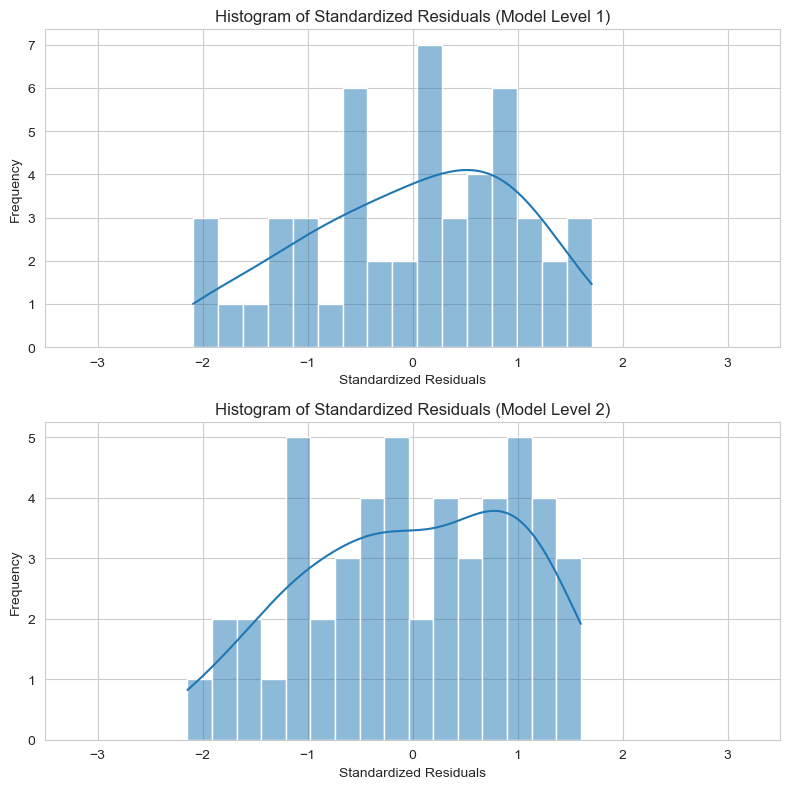

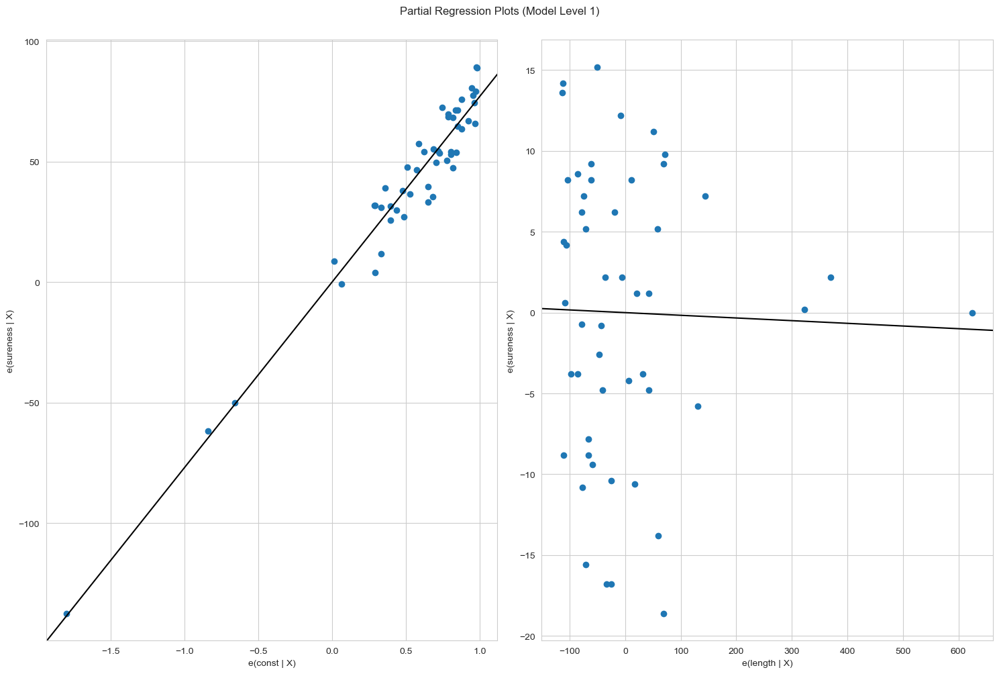

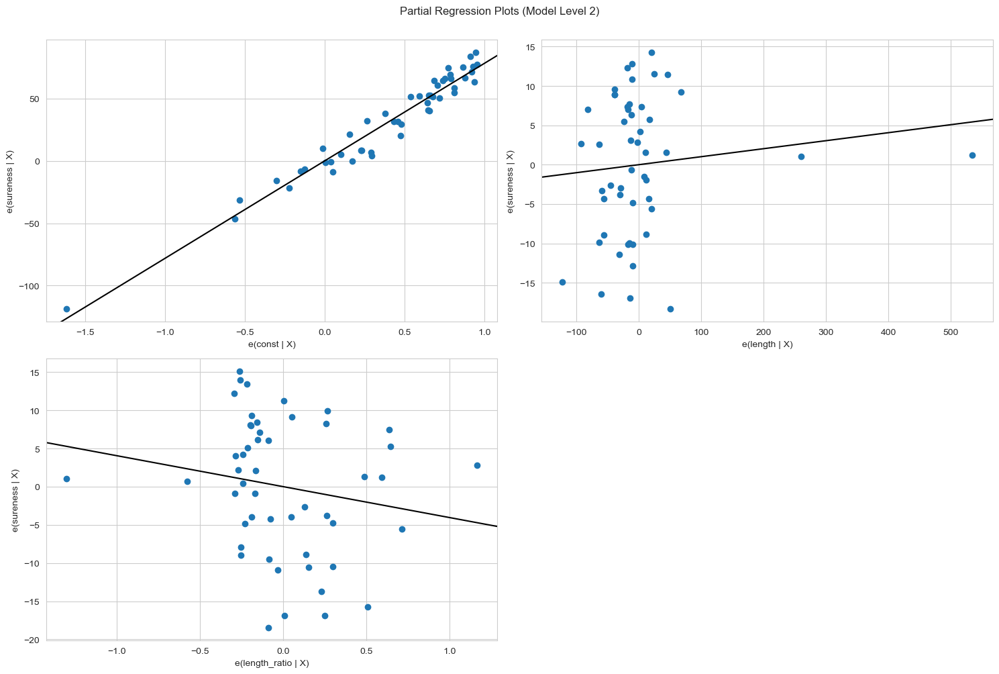

In [62]:
make_plots(full_hreg, 'full_data/hierarchy7')

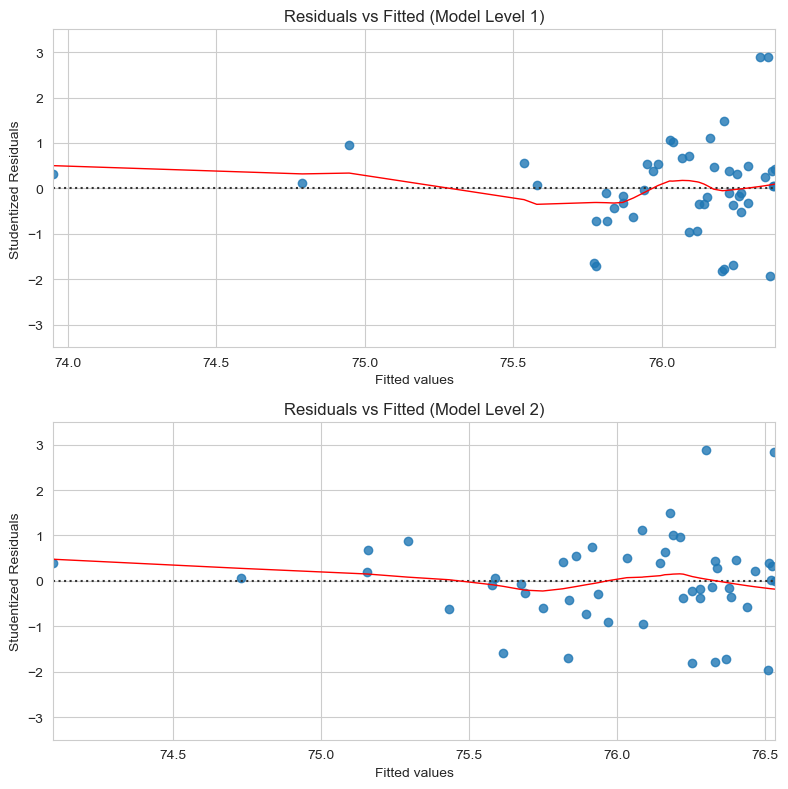

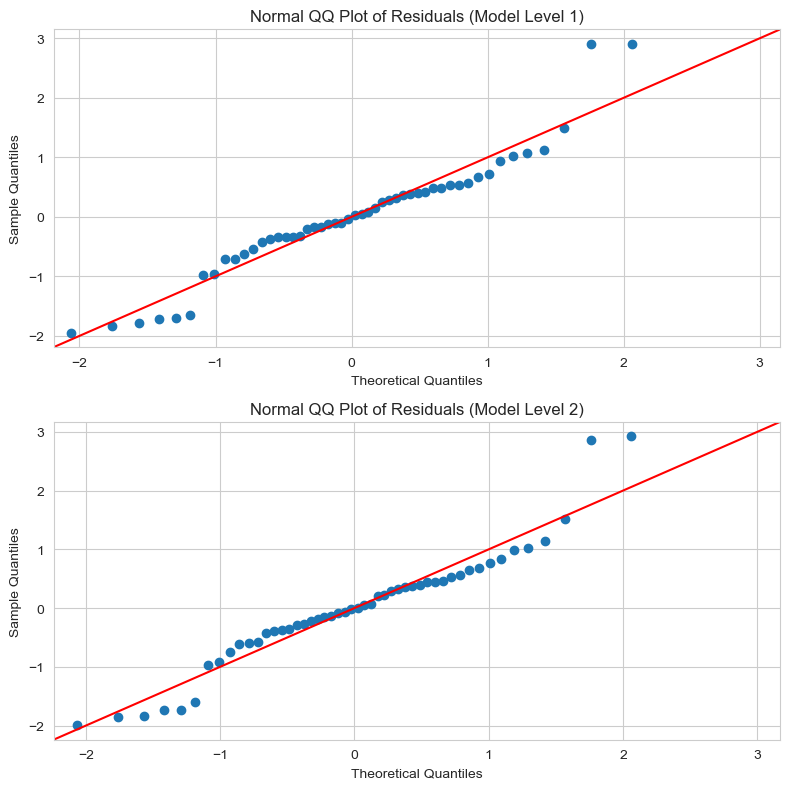

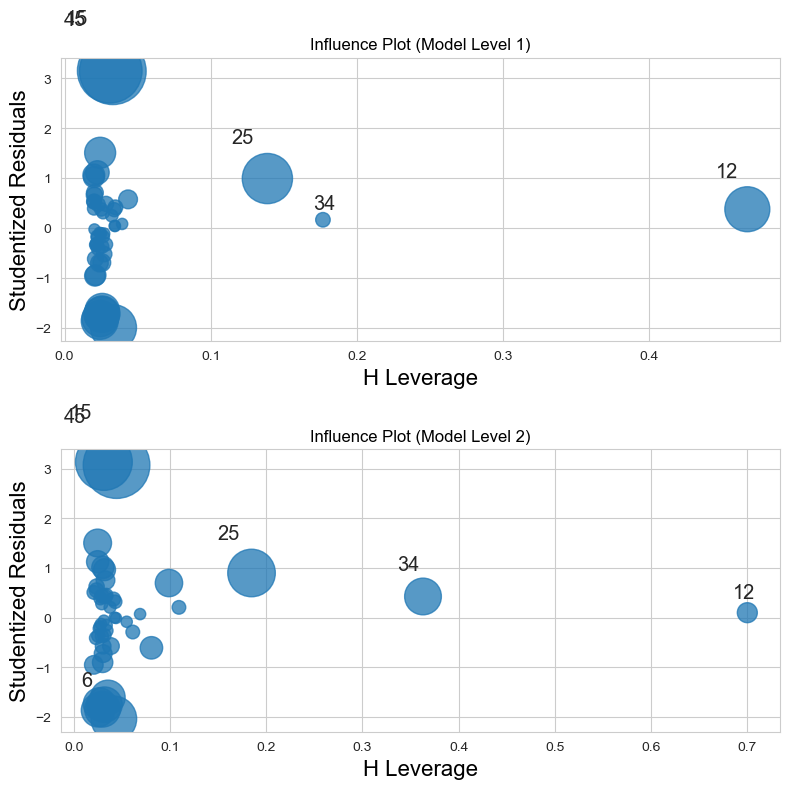

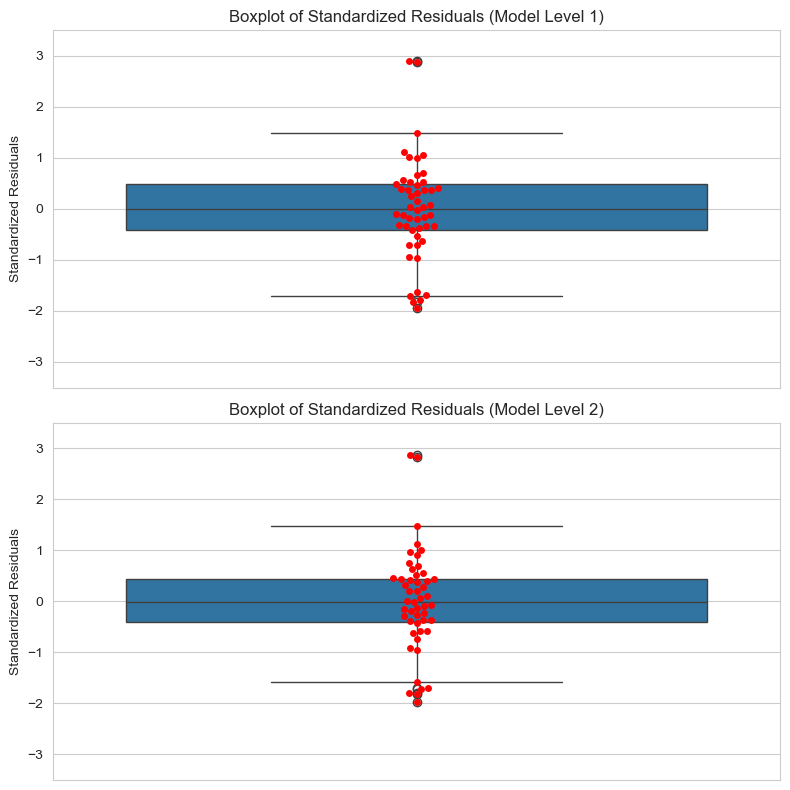

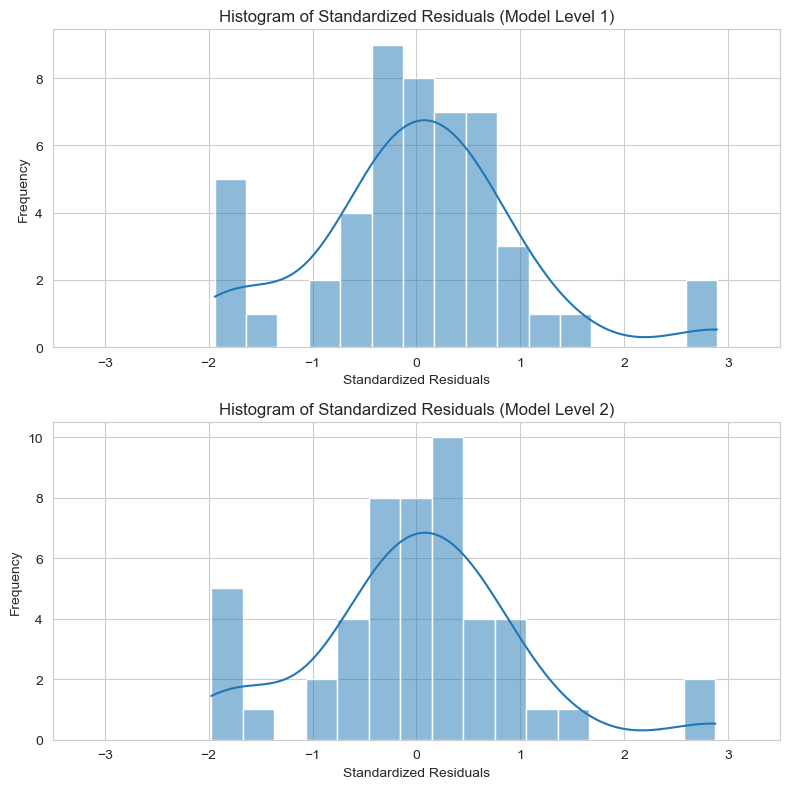

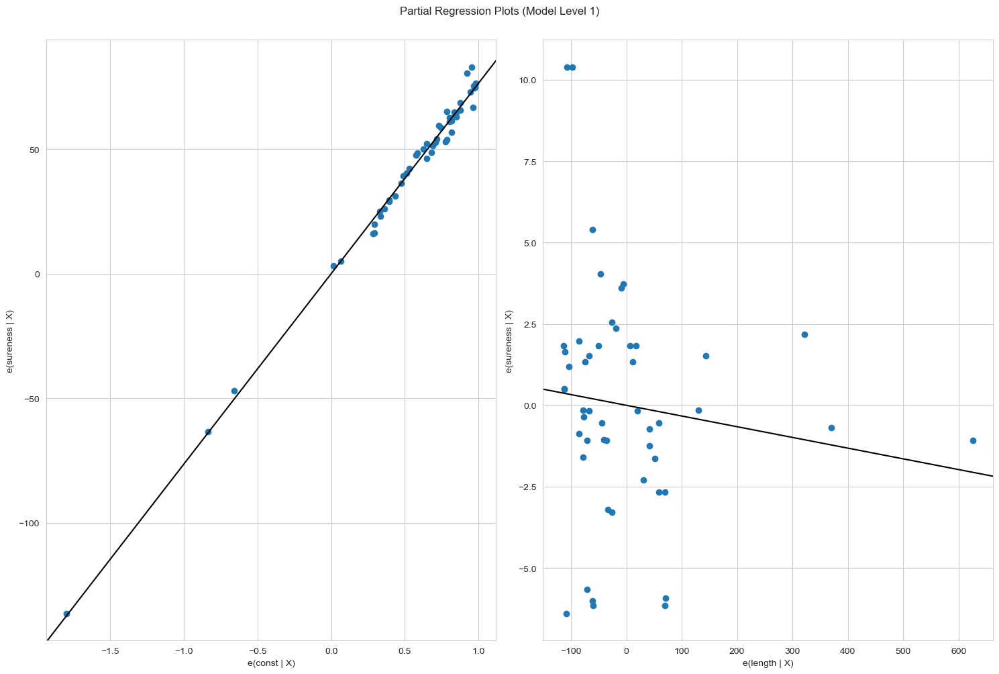

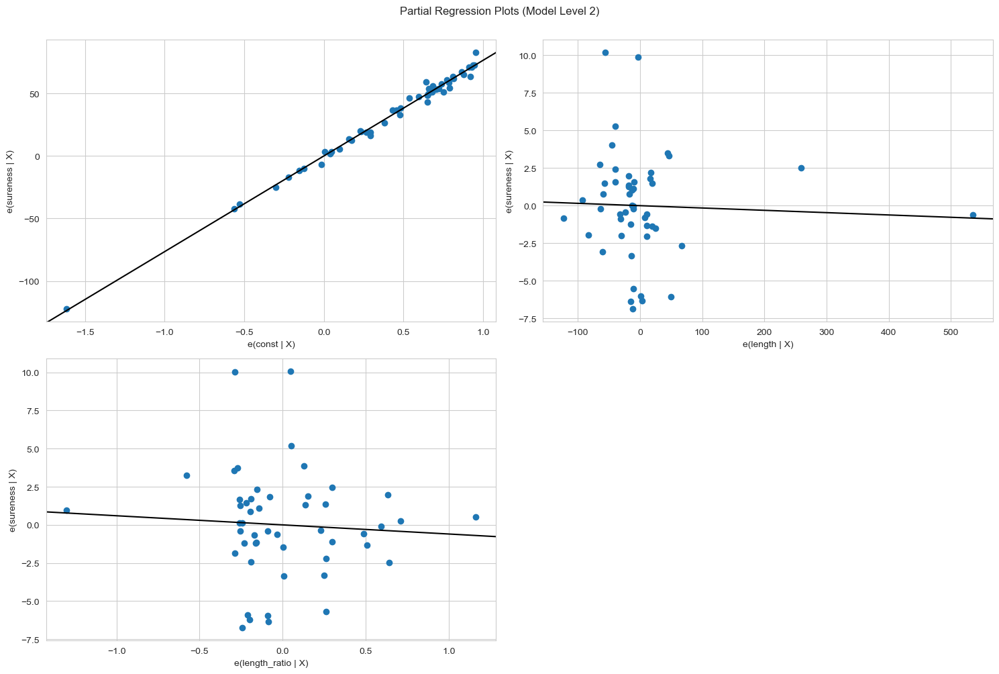

In [63]:
make_plots(fnn_hreg, 'fnn_data/hierarchy7')

# Hierarchy 8

In [39]:
hie8 = {
    1: ['replies'],
    2: ['replies', 'score'],
    3: ['replies', 'score', 'length_ratio'],
}

full_hreg = HierarchicalLinearRegression(full_data, hie8, dep_var)
fnn_hreg = HierarchicalLinearRegression(fnn_data, hie8, dep_var)

In [40]:
full_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[replies],50.0,48.0,1.0,0.140217,7.828035,0.007383,3315.691269,3856.427643,...,78.702605,"{'const': 78.16542542229799, 'replies': -0.577...","{'const': 2.738907480072571e-47, 'replies': 0....",{'replies': -0.3744554868652137},{'replies': -0.37445548686521446},{'replies': -0.3744554868652144},{'replies': 14.021691164346475},NaN,NaN,NaN
1,2,"[replies, score]",50.0,47.0,2.0,0.183989,5.298619,0.008411,3146.888749,3856.427643,...,78.702605,"{'const': 77.34589215516961, 'replies': -0.559...","{'const': 4.548528629511953e-45, 'replies': 0....","{'replies': -0.36286114964266725, 'score': 0.2...","{'replies': -0.3722513140032484, 'score': 0.22...","{'replies': -0.36230523300883755, 'score': 0.2...","{'replies': 13.126508186558809, 'score': 4.377...",0.043772,2.521131,0.119035
2,3,"[replies, score, length_ratio]",50.0,46.0,3.0,0.187558,3.539815,0.021730,3133.122839,3856.427643,...,78.702605,"{'const': 78.00226199750459, 'replies': -0.549...","{'const': 6.7373846579541635e-37, 'replies': 0...","{'replies': -0.35582382154088554, 'score': 0.1...","{'replies': -0.36452707163822584, 'score': 0.2...","{'replies': -0.3528468943049252, 'score': 0.19...","{'replies': 12.450093082063107, 'score': 3.821...",0.003570,0.202109,0.655135


In [41]:
full_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 1.9695082841465266
    Passed: True
  Linearity (Pearson r):
    replies: {'Pearson r': np.float64(-0.37445548686521446), 'p-value': np.float64(0.007382690860991534), 'Passed': np.True_}
  Linearity (Rainbow test):
    Rainbow Stat: 0.7303666922672848
    p-value: 0.7784072337380437
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.15362222825992533
    p-value: 0.6950975844812206
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6431708578417119
    p-value: 0.8514597581242098
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: [13]
    Passed: False
  Normality (mean of residuals):
    Mean: -2

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(1.9695082841465266),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'replies': {'Pearson r': np.float64(-0.37445548686521446),
    'p-value': np.float64(0.007382690860991534),
    'Passed': np.True_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(0.7303666922672848),
   'p-value': np.float64(0.7784072337380437),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.15362222825992533),
   'p-value': np.float64(0.6950975844812206),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6431708578417119),
   'p-value': np.float64(0.8514597581242098),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], dt

In [42]:
fnn_hreg.summary()

,Model Level,Predictors,N (observations),DF (residuals),DF (model),R-squared,F-value,P-value (F),SSR,SSTO,...,MSE (total),Beta coefs,P-values (beta coefs),Std Beta coefs,Partial correlations,Semi-partial correlations,Unique variance %,R-squared change,F-value change,P-value (F-value change)
0,1,[replies],50.0,48.0,1.0,0.038906,1.943094,0.169753,586.279553,610.012807,...,12.449241,"{'const': 76.29356850524404, 'replies': -0.121...","{'const': 9.74140416497124e-65, 'replies': 0.1...",{'replies': -0.19724643730937957},{'replies': -0.1972464382221101},{'replies': -0.1972464382221102},{'replies': 3.8906157391308733},NaN,NaN,NaN
1,2,"[replies, score]",50.0,47.0,2.0,0.100588,2.628183,0.082800,548.652803,610.012807,...,12.449241,"{'const': 76.68049233441609, 'replies': -0.129...","{'const': 1.3339199875345198e-62, 'replies': 0...","{'replies': -0.2110099070531256, 'score': -0.2...","{'replies': -0.2168686682624404, 'score': -0.2...","{'replies': -0.21068663308569324, 'score': -0....","{'replies': 4.438885736098553, 'score': 6.1681...",0.061682,3.223272,0.079029
2,3,"[replies, score, length_ratio]",50.0,46.0,3.0,0.125161,2.193707,0.101542,533.662811,610.012807,...,12.449241,"{'const': 77.36542337638707, 'replies': -0.118...","{'const': 3.566090074634254e-54, 'replies': 0....","{'replies': -0.19254576445381838, 'score': -0....","{'replies': -0.20001188329795838, 'score': -0....","{'replies': -0.19093487057519007, 'score': -0....","{'replies': 3.6456124801564584, 'score': 7.398...",0.024573,1.292089,0.261550


In [43]:
fnn_hreg.diagnostics(verbose=True)


Model Level 1 Diagnostics:
  Independence of residuals (Durbin-Watson test):
    DW stat: 2.0220669591336065
    Passed: True
  Linearity (Pearson r):
    replies: {'Pearson r': np.float64(-0.19724643822211005), 'p-value': np.float64(0.16975301110039703), 'Passed': np.False_}
  Linearity (Rainbow test):
    Rainbow Stat: 1.5326445277000438
    p-value: 0.15347880533882796
    Passed: True
  Homoscedasticity (Breusch-Pagan test):
    Lagrange Stat: 0.8238272779189815
    p-value: 0.36406353088741716
    Passed: True
  Homoscedasticity (Goldfeld-Quandt test):
    F-Stat: 0.6393245538769332
    p-value: 0.8546921309236483
    Passed: True
  Multicollinearity (pairwise correlations):
    Correlations: {}
    Passed: True
  Multicollinearity (Variance Inflation Factors):
    VIFs: {}
    Passed: True
  Outliers (extreme standardized residuals):
    Indices: []
    Passed: True
  Outliers (high Cooks distance):
    Indices: []
    Passed: True
  Normality (mean of residuals):
    Mean: -2.2

{1: {'Independence of residuals (Durbin-Watson test)': {'DW stat': np.float64(2.0220669591336065),
   'Passed': np.True_},
  'Linearity (Pearson r)': {'replies': {'Pearson r': np.float64(-0.19724643822211005),
    'p-value': np.float64(0.16975301110039703),
    'Passed': np.False_}},
  'Linearity (Rainbow test)': {'Rainbow Stat': np.float64(1.5326445277000438),
   'p-value': np.float64(0.15347880533882796),
   'Passed': np.True_},
  'Homoscedasticity (Breusch-Pagan test)': {'Lagrange Stat': np.float64(0.8238272779189815),
   'p-value': np.float64(0.36406353088741716),
   'Passed': np.True_},
  'Homoscedasticity (Goldfeld-Quandt test)': {'F-Stat': np.float64(0.6393245538769332),
   'p-value': np.float64(0.8546921309236483),
   'Passed': np.True_},
  'Multicollinearity (pairwise correlations)': {'Correlations': {},
   'Passed': True},
  'Multicollinearity (Variance Inflation Factors)': {'VIFs': {},
   'Passed': True},
  'Outliers (extreme standardized residuals)': {'Indices': array([], d

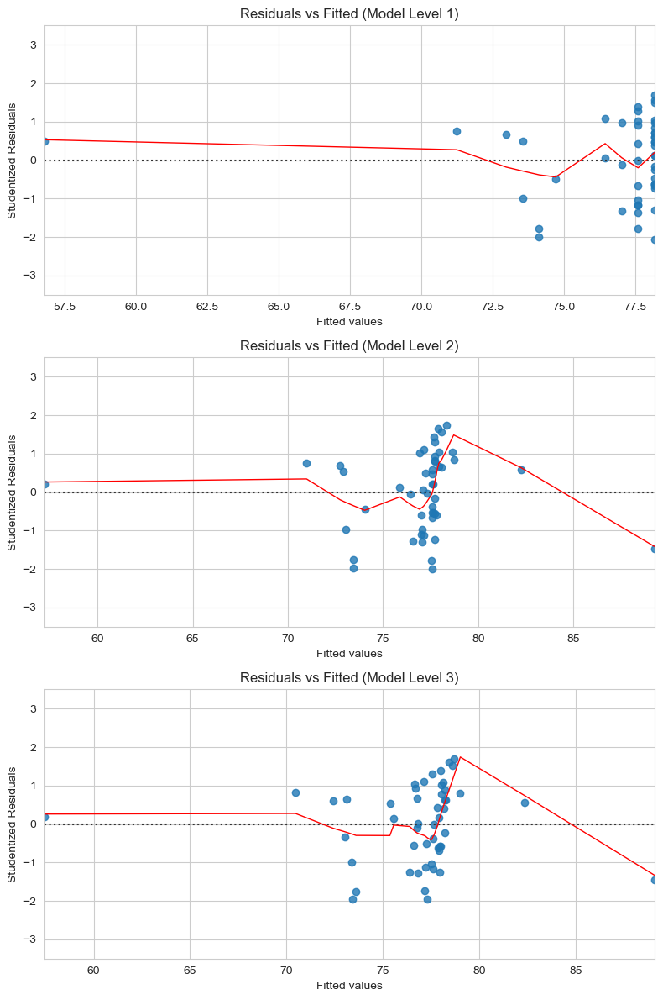

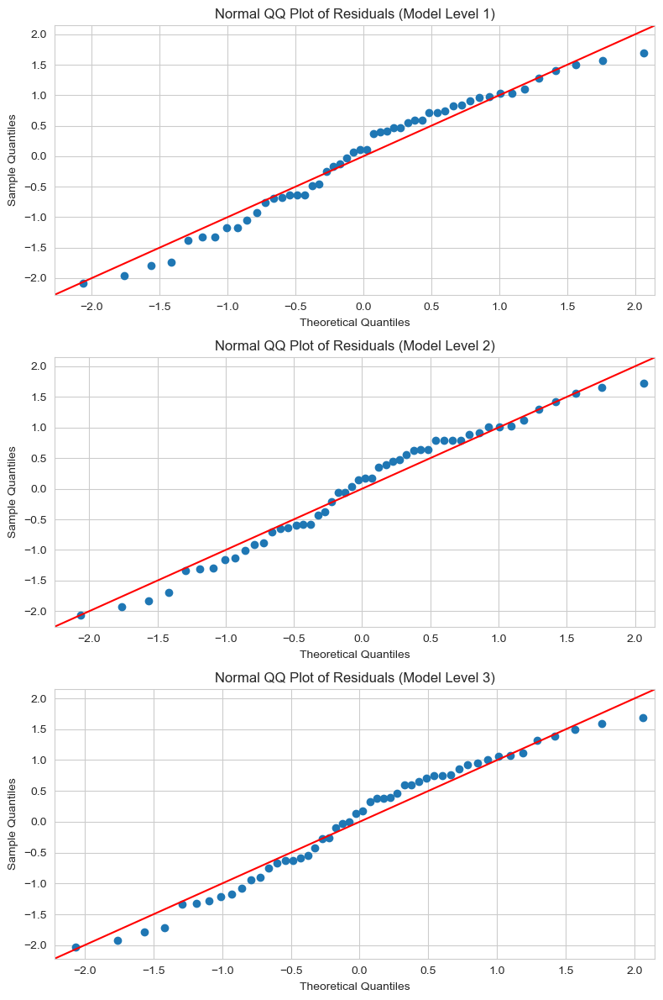

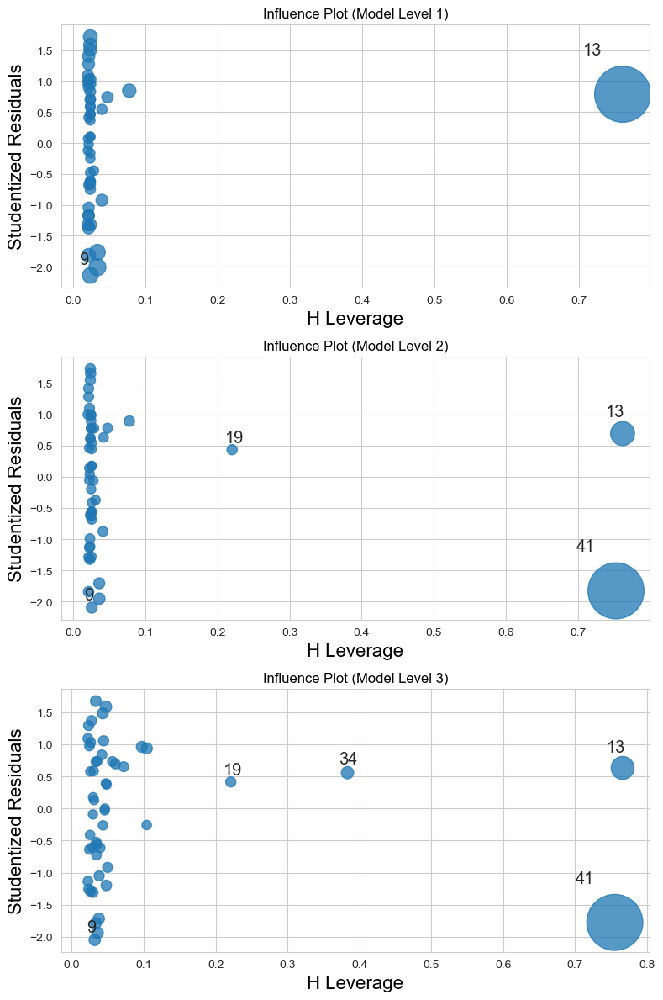

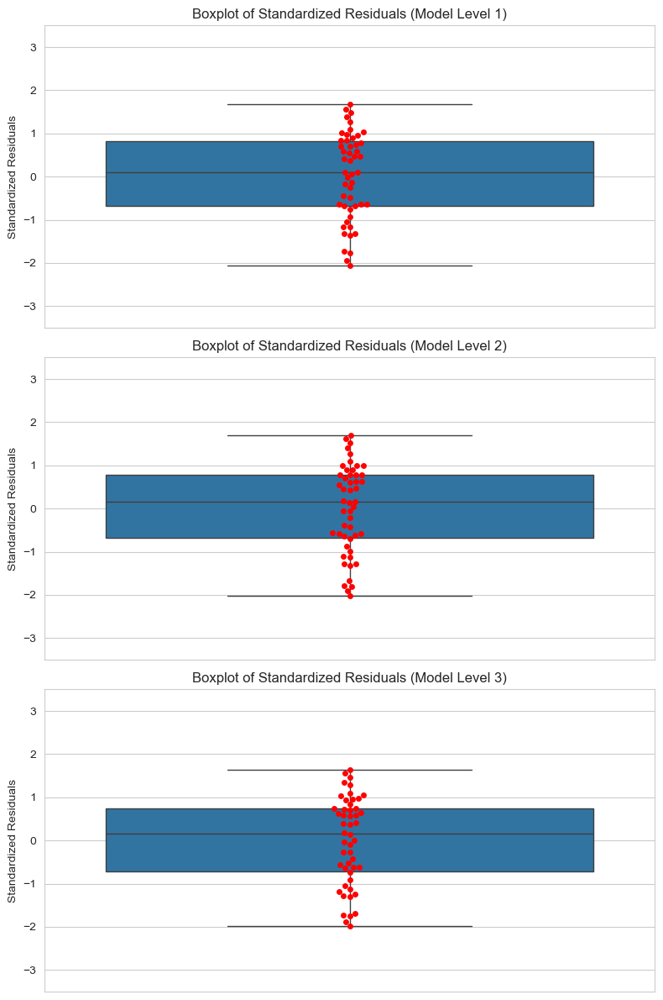

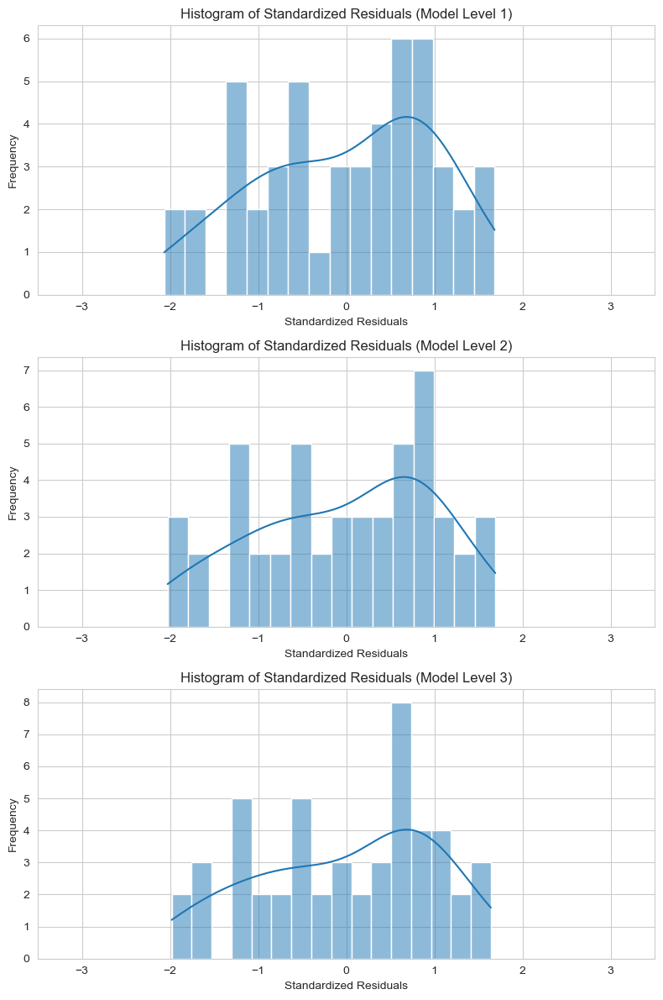

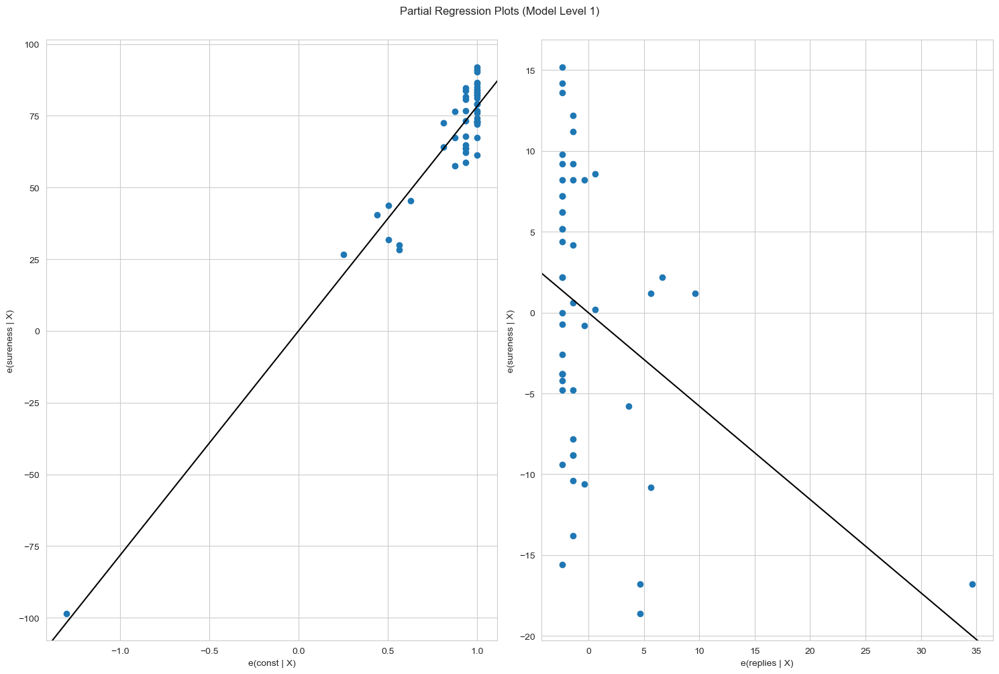

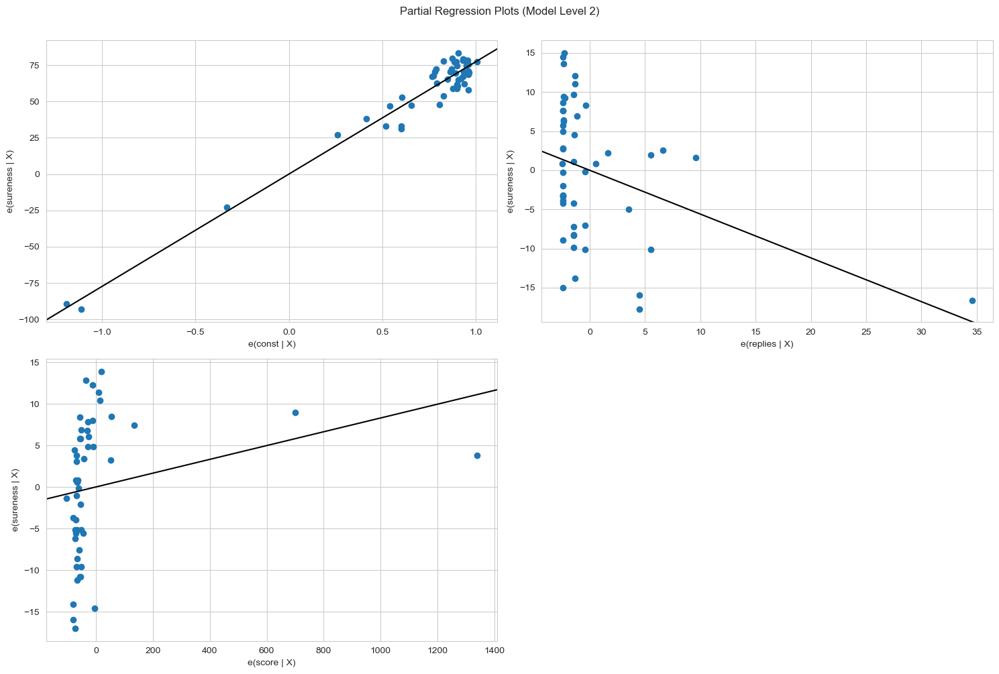

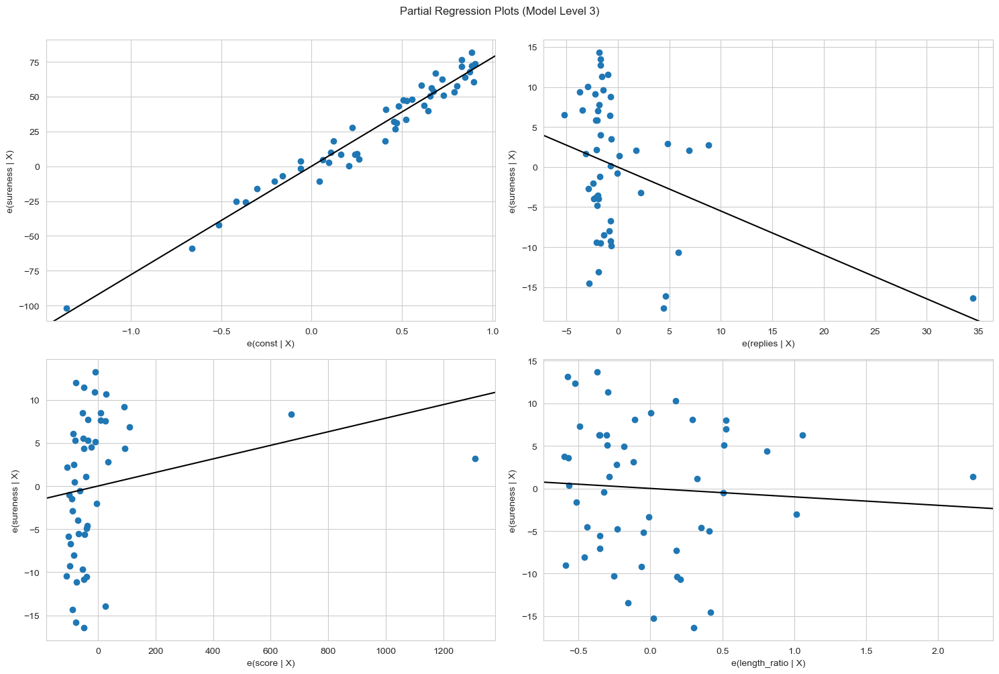

In [44]:
make_plots(full_hreg, 'full_data/hierarchy8')

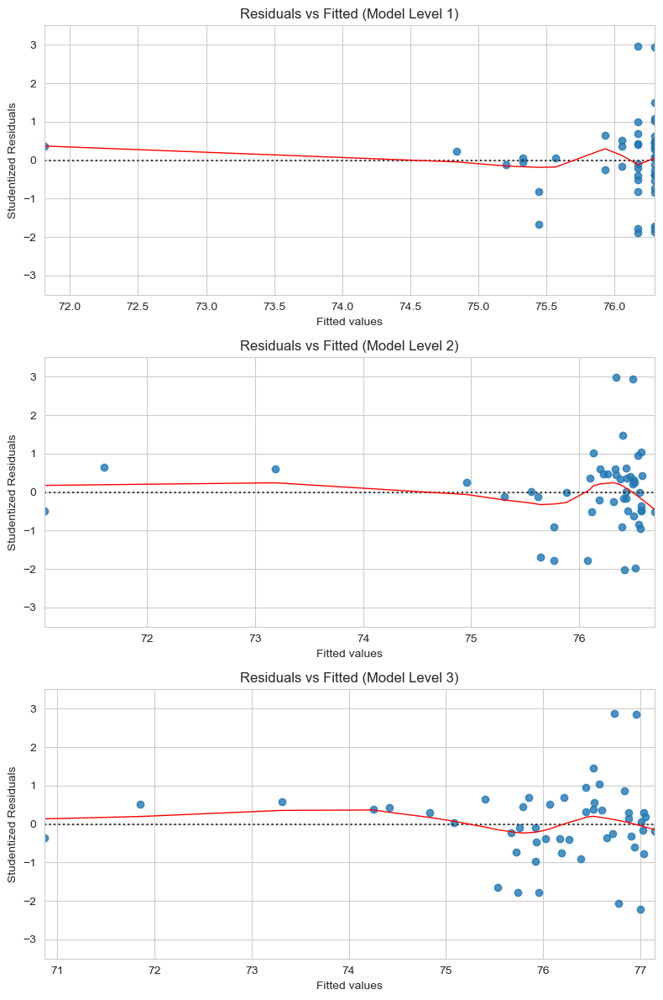

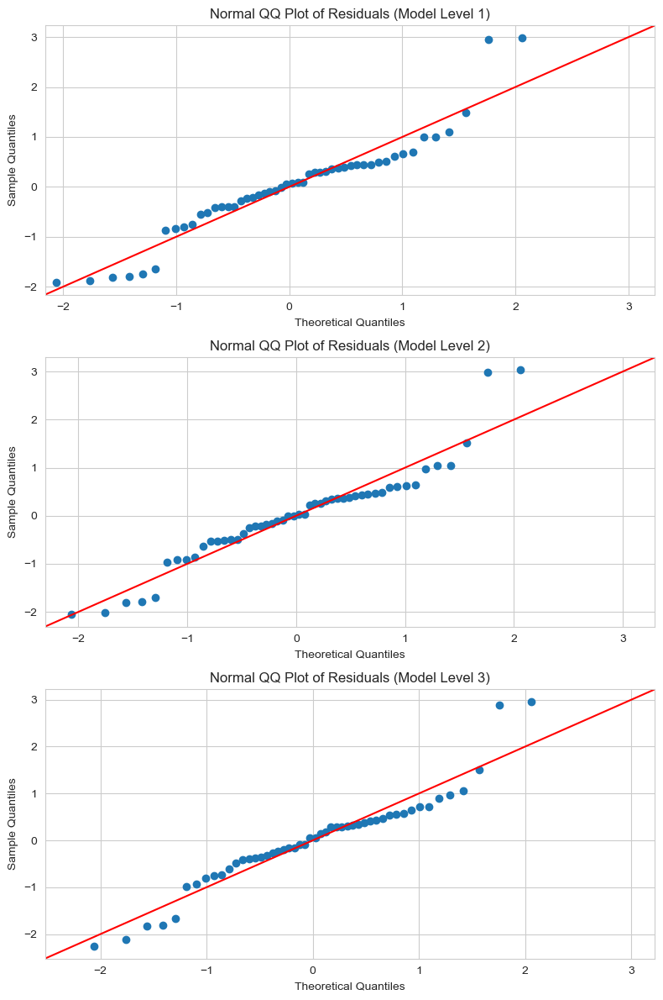

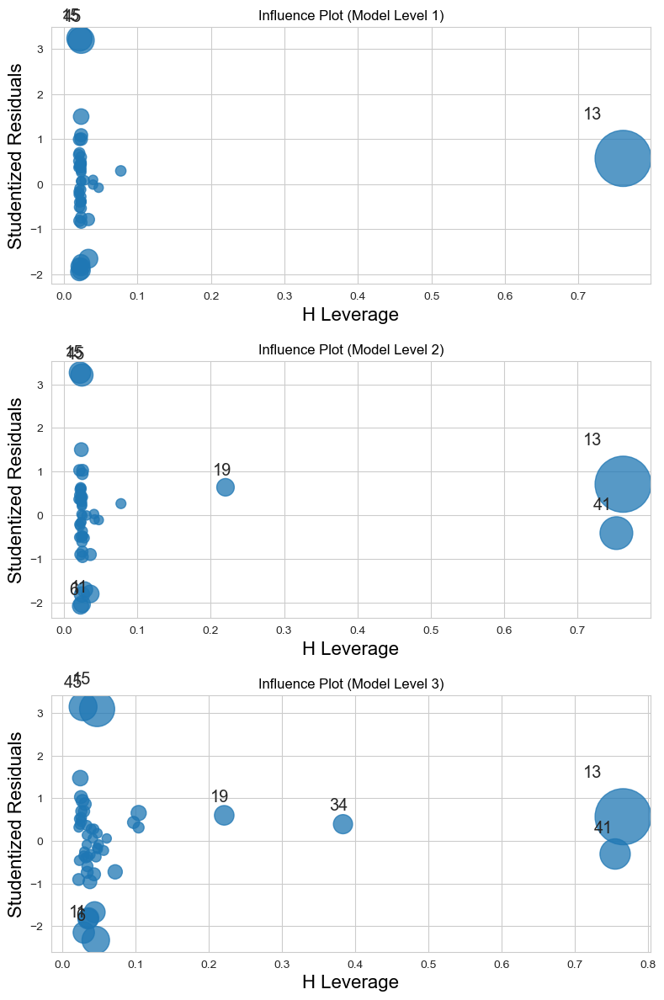

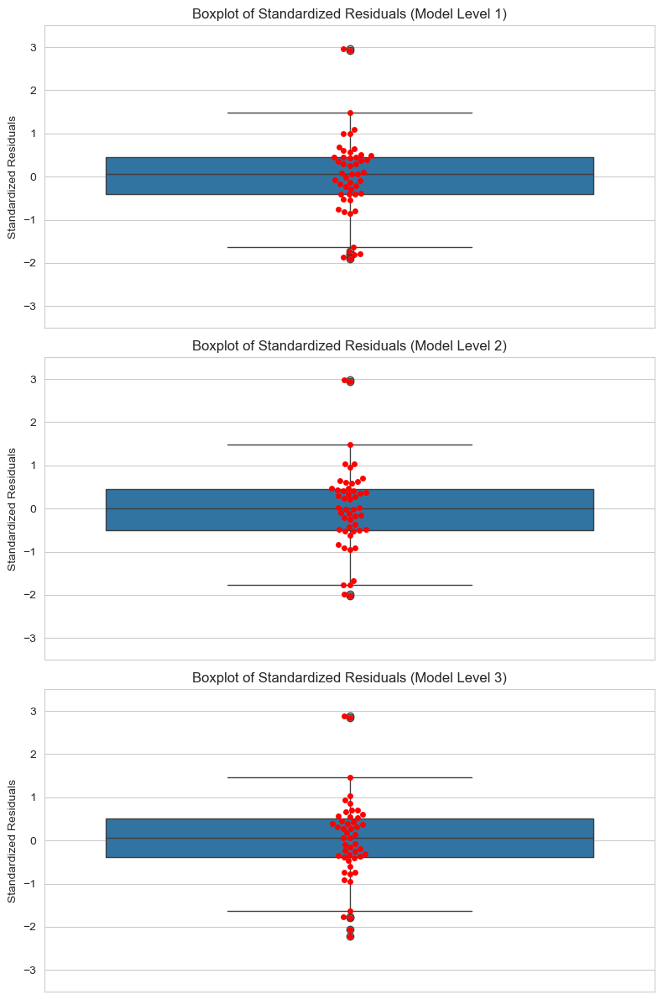

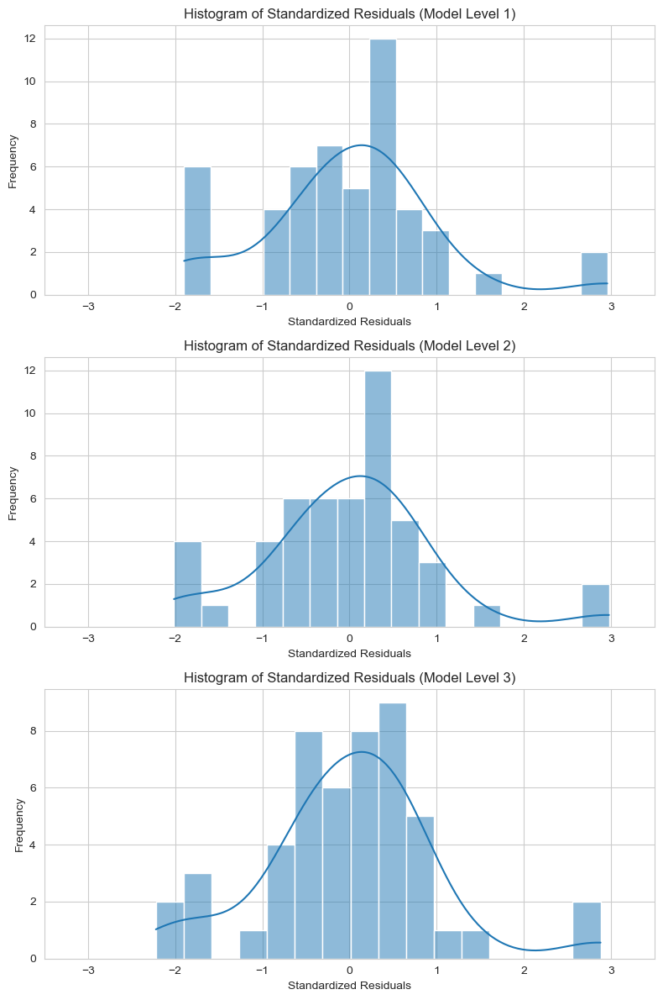

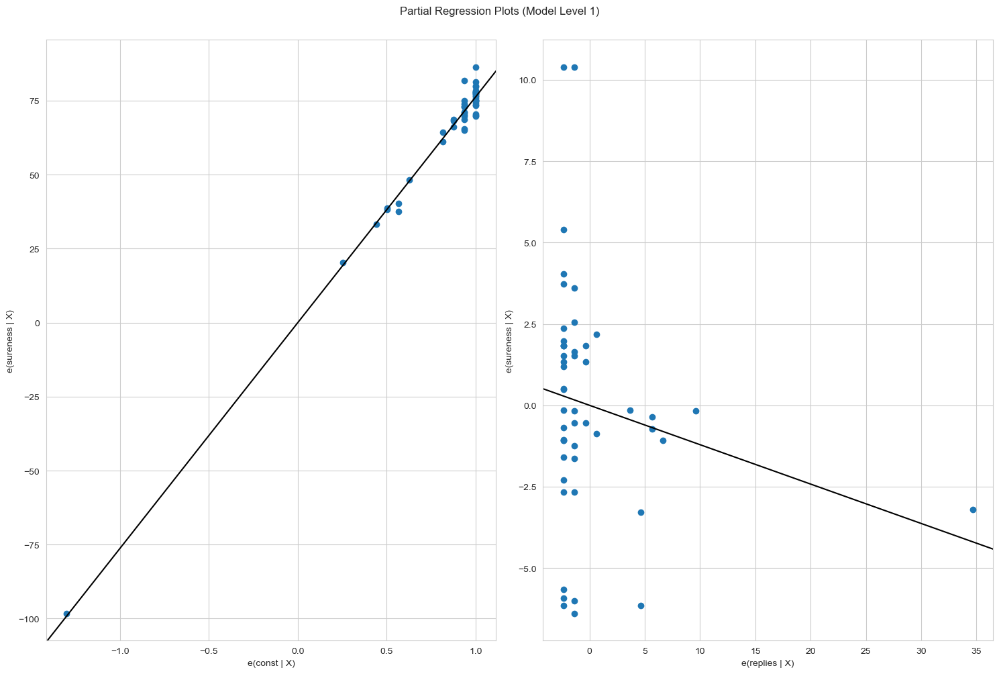

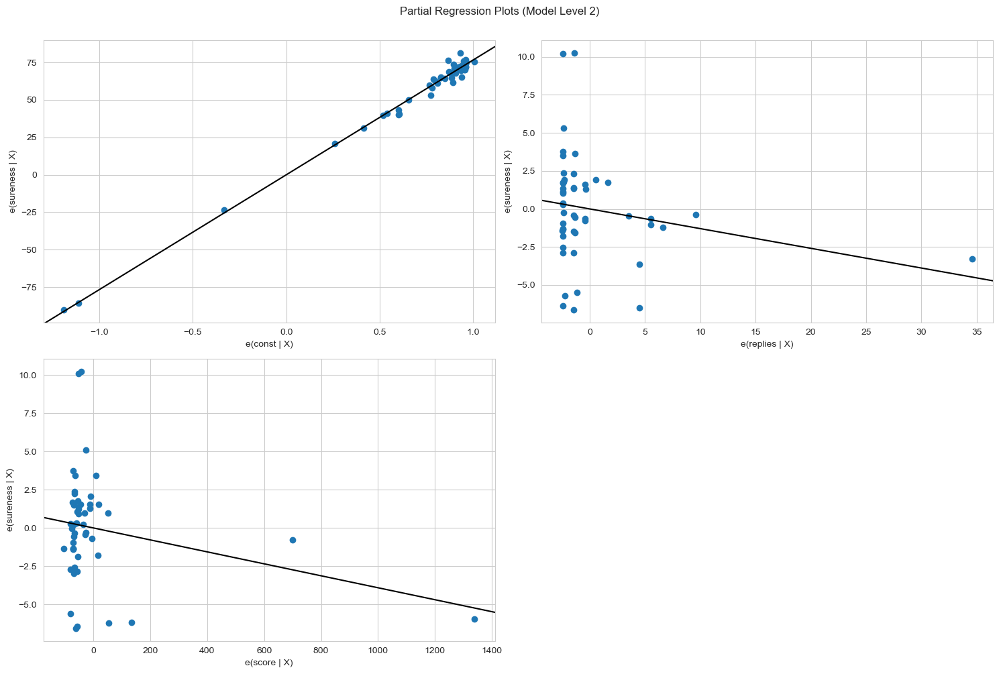

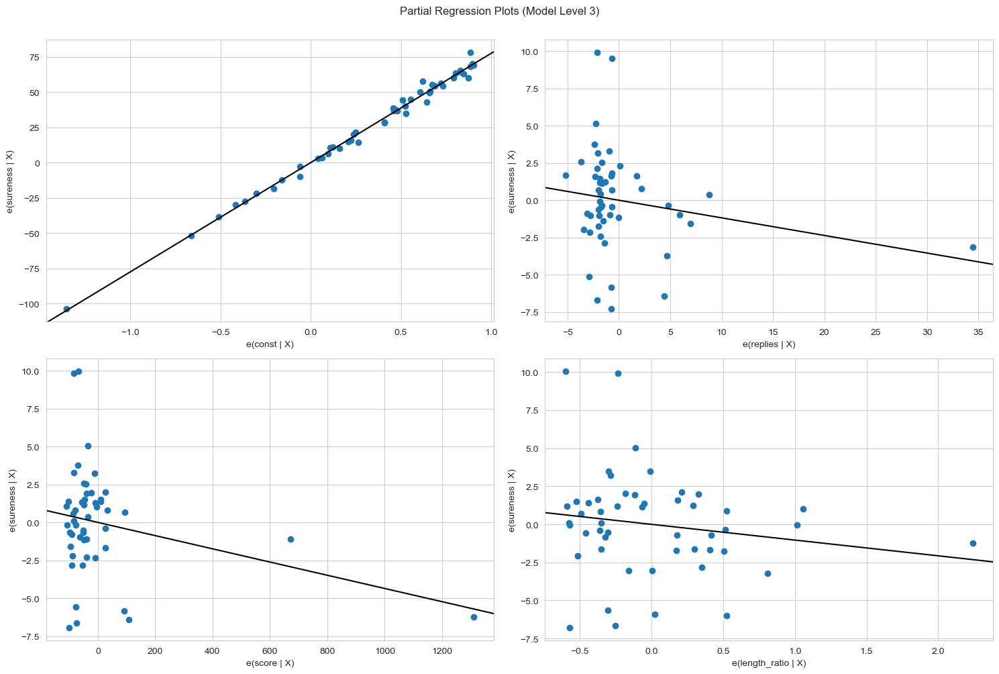

In [45]:
make_plots(fnn_hreg, 'fnn_data/hierarchy8')

# Plots of relations between different columns and the dependent variable

In [29]:
import seaborn as sns

## plot of the score vs the sureness

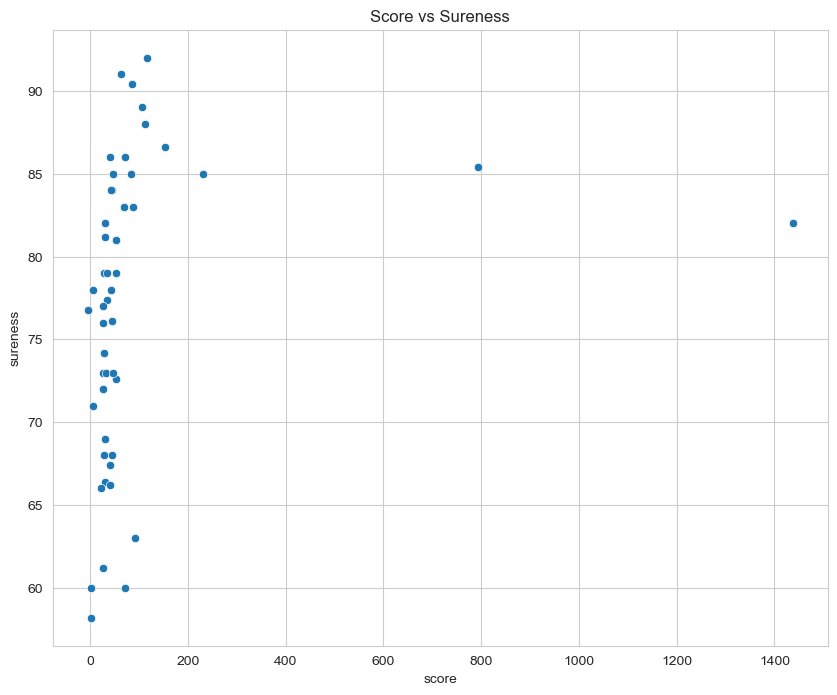

In [30]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=full_data, x='score', y='sureness')
plt.title('Score vs Sureness')
plt.savefig('plots/full_data/score_vs_sureness.png')

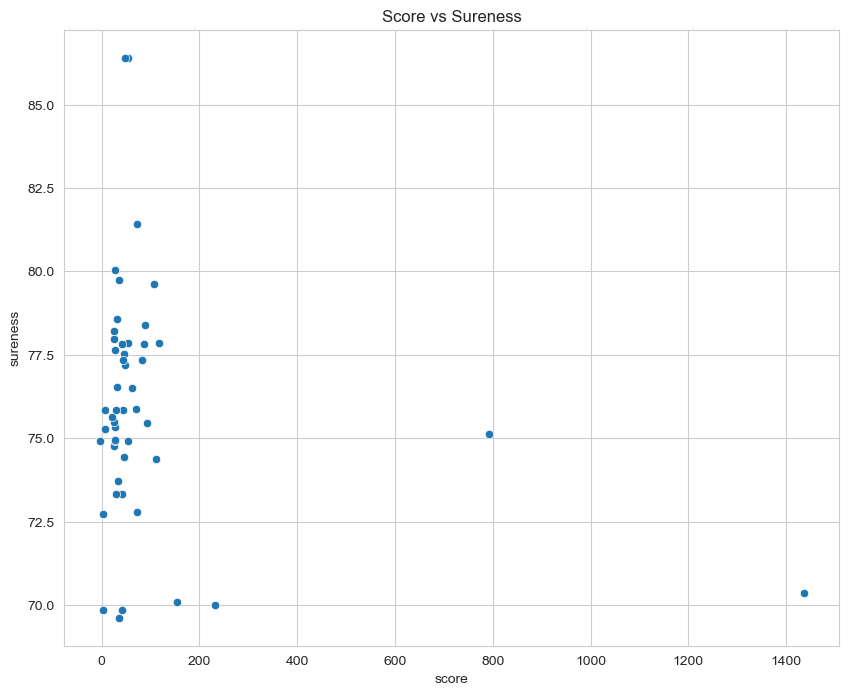

In [31]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=fnn_data, x='score', y='sureness')
plt.title('Score vs Sureness')
plt.savefig('plots/fnn_data/score_vs_sureness.png')

## plot of the replies vs the sureness

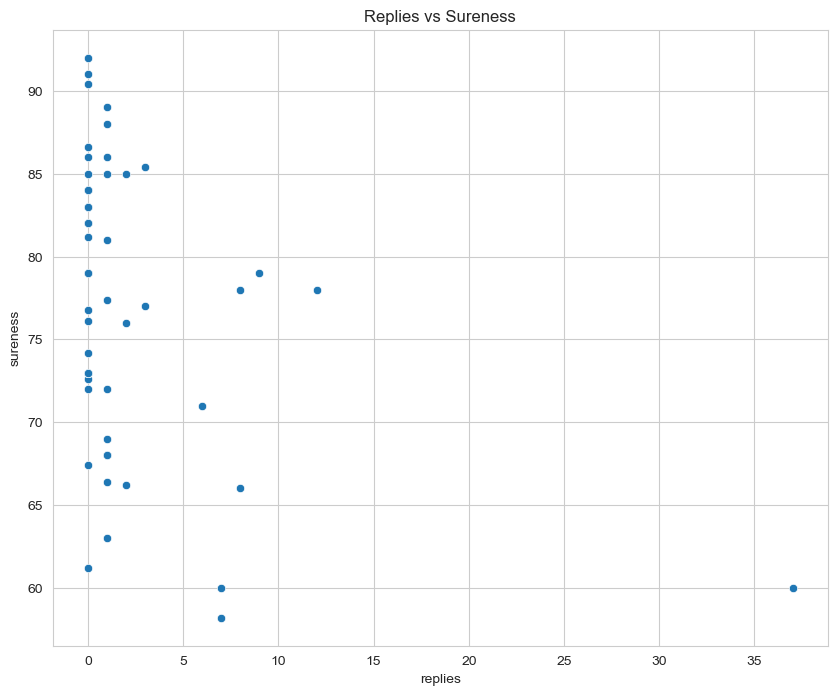

In [32]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=full_data, x='replies', y='sureness')
plt.title('Replies vs Sureness')
plt.savefig('plots/full_data/replies_vs_sureness.png')

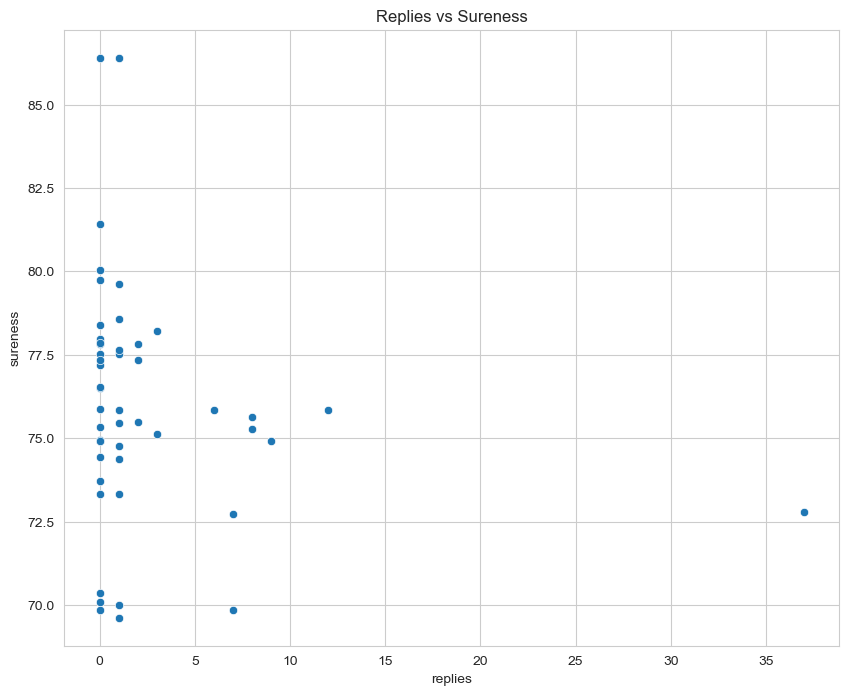

In [33]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=fnn_data, x='replies', y='sureness')
plt.title('Replies vs Sureness')
plt.savefig('plots/fnn_data/replies_vs_sureness.png')

## plot of the length vs the sureness

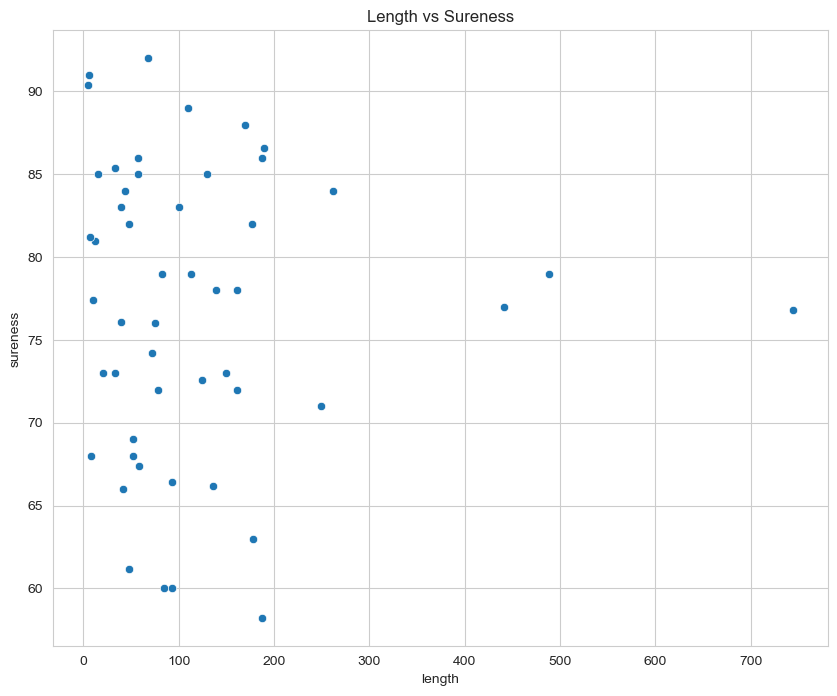

In [34]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=full_data, x='length', y='sureness')
plt.title('Length vs Sureness')
plt.savefig('plots/full_data/length_vs_sureness.png')

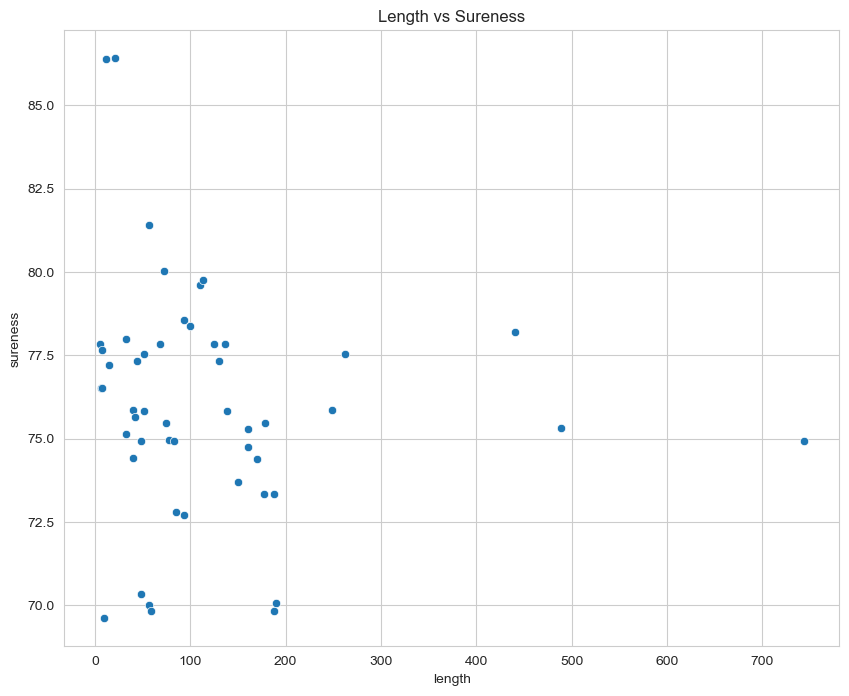

In [35]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=fnn_data, x='length', y='sureness')
plt.title('Length vs Sureness')
plt.savefig('plots/fnn_data/length_vs_sureness.png')

## plot of the length_ratio vs the sureness

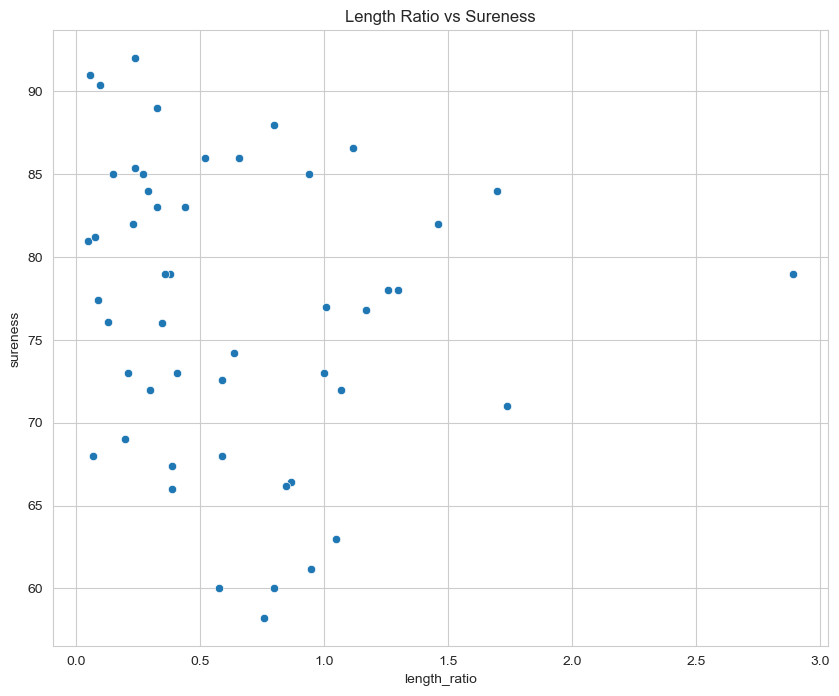

In [36]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=full_data, x='length_ratio', y='sureness')
plt.title('Length Ratio vs Sureness')
plt.savefig('plots/full_data/length_ratio_vs_sureness.png')

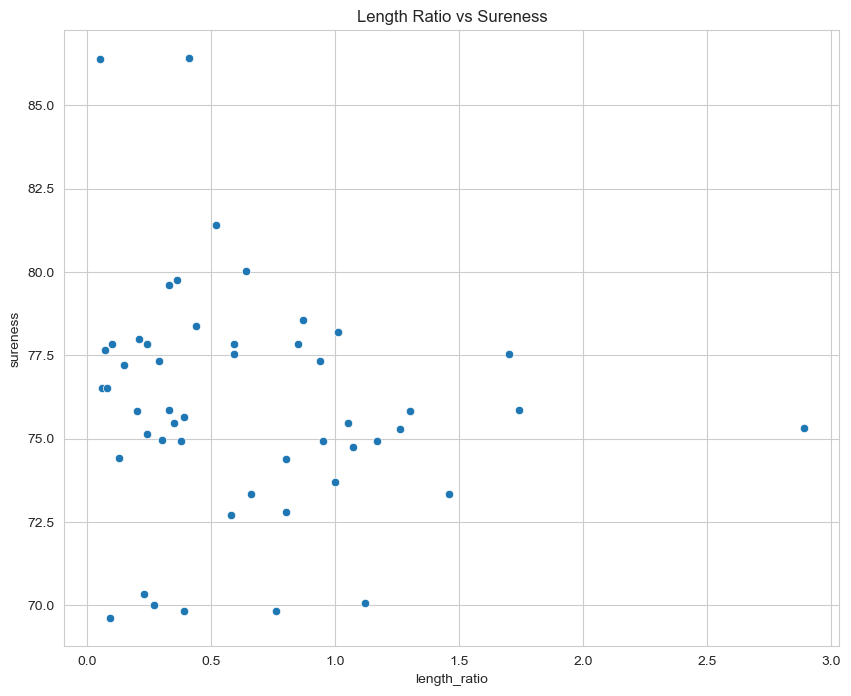

In [37]:
plt.figure(figsize=(10, 8))
sns.scatterplot(data=fnn_data, x='length_ratio', y='sureness')
plt.title('Length Ratio vs Sureness')
plt.savefig('plots/fnn_data/length_ratio_vs_sureness.png')